In [67]:
# импортируем необходимые библиотеки
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import datetime
import seaborn as sns
import tensorflow as tf

from datetime import datetime, timedelta
from xgboost import XGBClassifier
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score

from statsmodels.tsa.api import ExponentialSmoothing
from tensorflow.keras import utils
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Dense, Dropout, SpatialDropout1D, BatchNormalization, Embedding, Flatten, Activation, Input, concatenate
from tensorflow.keras.layers import SimpleRNN, GRU, LSTM, Bidirectional, Conv1D, MaxPooling1D, GlobalMaxPooling1D
from tensorflow.keras.optimizers import Adam, Adadelta, SGD, Adagrad, RMSprop
from tensorflow.keras.preprocessing.text import Tokenizer

matplotlib.style.use('ggplot')
%matplotlib inline

# Предварительная обработка данных

In [10]:
# для начала загрузим датасеты
df_transaction = pd.read_parquet("dataframes/transaction_df.parquet")
df_competitors = pd.read_parquet("dataframes/df_competitors.parquet")
df_cost = pd.read_parquet("dataframes/df_cost.parquet")
df_weather = pd.read_parquet("dataframes/weather_df.parquet")

In [11]:
# посмотрим на структуру первого из них
df_transaction.head()

,product,price,amount,place,datetime
0,Целебные травы,3.9,1.242125,Анор Лондо,2216-01-02 16:28:00
1,Целебные травы,3.9,-0.079689,Анор Лондо,2216-01-02 16:21:00
2,Целебные травы,3.9,0.882450,Анор Лондо,2216-01-02 03:03:00
3,Целебные травы,3.9,0.621377,Анор Лондо,2216-01-02 03:12:00
4,Целебные травы,3.9,1.367161,Анор Лондо,2216-01-02 05:33:00


In [12]:
df_transaction.info() # с типами данных все ок

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 875036 entries, 0 to 875035
Data columns (total 5 columns):
 #   Column    Non-Null Count   Dtype         
---  ------    --------------   -----         
 0   product   875036 non-null  object        
 1   price     875036 non-null  float64       
 2   amount    875036 non-null  float64       
 3   place     874604 non-null  object        
 4   datetime  875036 non-null  datetime64[us]
dtypes: datetime64[us](1), float64(2), object(2)
memory usage: 33.4+ MB


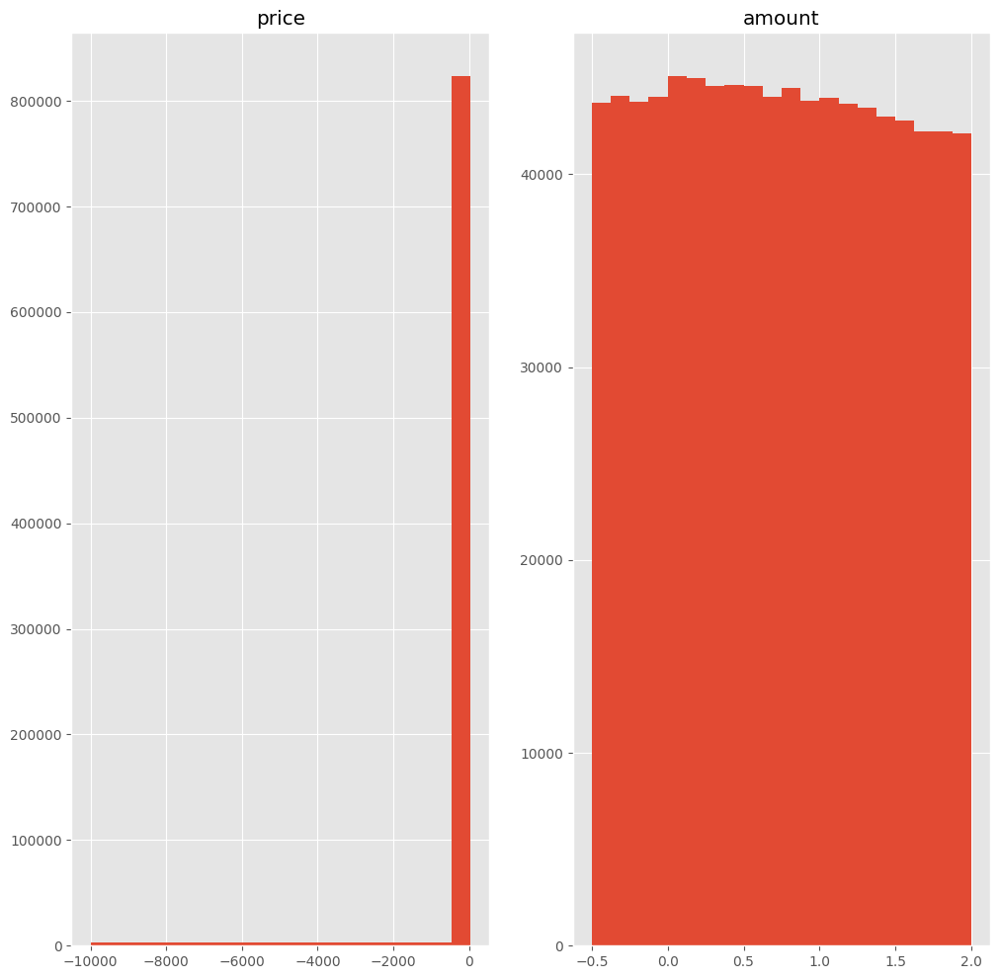

In [13]:
# провизуализируем числовые данные
fig, axs = plt.subplots(nrows=1, ncols= 2, figsize=(12, 12))

axs[0].hist(df_transaction['price'], bins=20)
axs[0].set_title('price')

axs[1].hist(df_transaction['amount'], bins=20)
axs[1].set_title('amount')


plt.show()

# видно, что у признаков есть отрицательные значения, которых быть не должно

In [14]:
# сначла посмотрим на эти значения в колонке price

df_transaction[df_transaction['price'] <= 0]

,product,price,amount,place,datetime
5,Целебные травы,-7154.53,1.988265,Анор Лондо,2216-01-02 13:57:00
40,Целебные травы,-8870.90,1.703059,Анор Лондо,2216-01-02 16:02:00
55,Эльфийская пыльца,-1263.59,0.027265,Анор Лондо,2216-01-02 05:26:00
58,Эльфийская пыльца,-1602.39,-0.060664,Анор Лондо,2216-01-02 18:44:00
93,Эльфийская пыльца,-8947.87,1.247135,Анор Лондо,2216-01-02 05:26:00
...,...,...,...,...,...
874988,Эстус,-6154.12,1.053717,Фалькония,2218-09-27 07:47:00
874992,Эстус,-6548.91,0.948498,Фалькония,2218-09-27 07:30:00
875004,Эстус,-1953.21,1.538198,Фалькония,2218-09-27 00:39:00
875014,Эстус,-5824.79,-0.209391,Фалькония,2218-09-27 01:06:00


In [15]:
df_transaction[df_transaction['price'] > 0]
# также видно, что эта цена значительно отличается не только по знаку, но и по значению, что говорит о том, что это явные выбросы
# заменим эти отрицательные значения на медианное значение положительных цен на этот товар, в этом месте и в этот день

,product,price,amount,place,datetime
0,Целебные травы,3.90,1.242125,Анор Лондо,2216-01-02 16:28:00
1,Целебные травы,3.90,-0.079689,Анор Лондо,2216-01-02 16:21:00
2,Целебные травы,3.90,0.882450,Анор Лондо,2216-01-02 03:03:00
3,Целебные травы,3.90,0.621377,Анор Лондо,2216-01-02 03:12:00
4,Целебные травы,3.90,1.367161,Анор Лондо,2216-01-02 05:33:00
...,...,...,...,...,...
875031,Эстус,9.28,1.079104,Фалькония,2218-09-27 14:50:00
875032,Эстус,9.28,1.580617,Фалькония,2218-09-27 06:16:00
875033,Эстус,9.28,1.738492,Фалькония,2218-09-27 11:14:00
875034,Эстус,9.28,0.430340,Фалькония,2218-09-27 22:24:00


In [16]:
# для этого, сначала, разделим datetime на date и time
df_transaction['date'] = pd.to_datetime(df_transaction['datetime'].dt.date)
df_transaction['time'] = df_transaction['datetime'].dt.time

df_transaction.drop('datetime', inplace=True, axis=1)

In [ ]:
dict_count_iter = {'count': 0}
def get_median_price(x):
  dict_count_iter['count'] += 1
  if dict_count_iter['count'] % 10000 == 0:
    print(dict_count_iter['count'])
  return np.median(df_transaction[(df_transaction['product'] == x['product']) & (df_transaction['place'] == x['place']) & (df_transaction['date'] == x['date']) & (df_transaction['price'] > 0)]['price'])

# чтобы не проходить по всему датасету мы пройдемся только по отрицательным значениям и запишем их в промежуточный набор данных
df_transaction_pos_price = df_transaction.loc[:, ['product', 'place', 'date', 'price']][df_transaction['price'] <= 0].apply(lambda x: get_median_price(x), axis=1)


In [ ]:
# теперь сделаем тоже самое для колонки amount

dict_count_iter = {'count': 0}
def get_median_amount(x):
    dict_count_iter['count'] += 1
    if dict_count_iter['count'] % 10000 == 0:
        print(dict_count_iter['count'])
    return np.median(df_transaction[(df_transaction['product'] == x['product']) & (df_transaction['place'] == x['place']) & (df_transaction['date'] == x['date']) & (df_transaction['amount'] > 0)]['amount'])

# чтобы не проходить по всему датасету мы пройдемся только по отрицательным значениям и запишем их в промежуточный набор данных
df_transaction_new_amount = df_transaction.loc[:, ['product', 'place', 'date', 'amount']][df_transaction['amount'] <= 0].apply(lambda x: get_median_amount(x), axis=1)

In [ ]:
df_transaction_pos_price.to_csv('dataframes/positive_prices.csv')
df_transaction_new_amount.to_csv('dataframes/positive_amounts.csv')

In [17]:
# загружаем полученные наборы данных
df_positive_prices = pd.read_csv('dataframes/positive_prices.csv', index_col='id')
df_positive_amounts = pd.read_csv('dataframes/positive_amounts.csv', index_col='id')

In [18]:
# заменяем отрицательные значения на новые
def change_price(x):
    if x.price < 0:
        return df_positive_prices['price'][x.name]
    else:
        return x.price
df_transaction['price'] = df_transaction.apply(lambda x: change_price(x), axis=1)

def change_amount(x):
    if x.amount < 0:
        return df_positive_amounts['amount'][x.name]
    else:
        return x.amount
df_transaction['amount'] = df_transaction.apply(lambda x: change_amount(x), axis=1)

In [19]:
# займемся пропусками в данных
# для начала посчитаем количество nan значение

print(df_transaction.isna().sum().sum())
# 555 - мало для нашей выборки, поэтому просто избавимся от них
df_transaction = df_transaction.dropna()

555


In [20]:
# теперь, после того как колонка time нам не нужна (так как нам нужно устанавливать цену на весь день) удалим ее
df_transaction.drop('time',axis = 1, inplace=True)

In [21]:
# сгрупируем данные по дате, месту и продукту
# и проагрегируем через сумму для поля amount и median для поля price
# (все равно это значение не меняется в течении дня, плюс ко всему median уберет возможные проблемы в данных, когда цена скакала в течении дня)


def my_agg(x):
    d = {}
    d['price'] = np.median(x['price'])
    d['amount'] = x['amount'].sum()
    return pd.Series(d, index=['price', 'amount'])

df_transaction = df_transaction.groupby(['date', 'place', 'product']).apply(my_agg)
df_transaction.reset_index(inplace=True)

In [22]:
# добавим колонку cost из фрема df_cost к нашему набору данных
df_transaction = df_transaction.merge(df_cost, on=['place', 'product', 'date'], how='left')

In [23]:
print(df_transaction.isna().sum().sum())
# так как цены есть далеко не для всех дат, мы получили много отрицательных значений
# скорее всего, в один день продукция готовилась сразу на несколько дней вперед
# поэтому заполним пропущеные значения себестоимости продукта последними известными

13881


In [24]:
# для этого, сначала отсортируем данные по дате месту и продукту
df_transaction.sort_values(by=['place', 'product', 'date'], inplace=True)
df_transaction.reset_index(drop=True, inplace=True)

In [25]:
df_transaction.head(1004)

,date,place,product,price,amount,cost
0,2216-01-02,Анор Лондо,Целебные травы,3.90,48.549733,2.07
1,2216-01-03,Анор Лондо,Целебные травы,3.90,67.312626,NaN
2,2216-01-04,Анор Лондо,Целебные травы,3.90,45.116954,NaN
3,2216-01-05,Анор Лондо,Целебные травы,3.90,46.466839,NaN
4,2216-01-06,Анор Лондо,Целебные травы,3.90,66.719908,NaN
...,...,...,...,...,...,...
999,2218-09-27,Анор Лондо,Целебные травы,13.63,55.785760,NaN
1000,2216-01-02,Анор Лондо,Эльфийская пыльца,9.21,63.166023,3.46
1001,2216-01-03,Анор Лондо,Эльфийская пыльца,9.21,56.388247,NaN
1002,2216-01-04,Анор Лондо,Эльфийская пыльца,9.21,40.934906,NaN


In [26]:
# и, теперь, заполним пропуски
df_transaction.fillna(method='ffill', inplace=True)

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\1917129074.py:2: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df_transaction.fillna(method='ffill', inplace=True)


In [27]:
df_transaction.head(1004) # значения заполнены как и планировалось

,date,place,product,price,amount,cost
0,2216-01-02,Анор Лондо,Целебные травы,3.90,48.549733,2.07
1,2216-01-03,Анор Лондо,Целебные травы,3.90,67.312626,2.07
2,2216-01-04,Анор Лондо,Целебные травы,3.90,45.116954,2.07
3,2216-01-05,Анор Лондо,Целебные травы,3.90,46.466839,2.07
4,2216-01-06,Анор Лондо,Целебные травы,3.90,66.719908,2.07
...,...,...,...,...,...,...
999,2218-09-27,Анор Лондо,Целебные травы,13.63,55.785760,9.19
1000,2216-01-02,Анор Лондо,Эльфийская пыльца,9.21,63.166023,3.46
1001,2216-01-03,Анор Лондо,Эльфийская пыльца,9.21,56.388247,3.46
1002,2216-01-04,Анор Лондо,Эльфийская пыльца,9.21,40.934906,3.46


In [28]:
# создадим новую колонку profit, в которой будем хранить прибыль

df_transaction['profit'] = df_transaction['price'] * df_transaction['amount'] - df_transaction['cost'] * df_transaction['amount']

In [29]:
# добавим в данные информацию о погоде
df_transaction = df_transaction.merge(df_weather, on=['place', 'date'], how='left')

In [30]:
# преобразуем категориальные признаки в числовые: product и place
products = {}
for i, product in enumerate(list(df_transaction['product'].unique())):
    products[product] = i

places = {}
for i, place in enumerate(list(df_transaction['place'].unique())):
    places[place] = i

df_transaction['product'] = df_transaction['product'].apply(lambda x: products[x]) # меняем продукт на соответсвтующую цифру
df_transaction['place'] = df_transaction['place'].apply(lambda x: places[x]) # меняем место на соответсвтующую цифру
df_transaction.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14998 entries, 0 to 14997
Data columns (total 10 columns):
 #   Column   Non-Null Count  Dtype         
---  ------   --------------  -----         
 0   date     14998 non-null  datetime64[ns]
 1   place    14998 non-null  int64         
 2   product  14998 non-null  int64         
 3   price    14998 non-null  float64       
 4   amount   14998 non-null  float64       
 5   cost     14998 non-null  float64       
 6   profit   14998 non-null  float64       
 7   hot      14998 non-null  int64         
 8   rain     14998 non-null  int64         
 9   snow     14998 non-null  int64         
dtypes: datetime64[ns](1), float64(4), int64(5)
memory usage: 1.1 MB


In [31]:
# преобразуем категориальные данные в формат ohe
ohe_product = pd.get_dummies(df_transaction['product'], dtype=int, prefix='product')
# df_transaction = df_transaction.drop('product',axis = 1)
df_transaction = df_transaction.join(ohe_product)

ohe_place = pd.get_dummies(df_transaction['place'], dtype=int, prefix='place')
# df_transaction = df_transaction.drop('place',axis = 1)
df_transaction = df_transaction.join(ohe_place)

In [66]:
places

{'Анор Лондо': 0,
 'Врата Балдура': 1,
 'Кеджистан': 2,
 'Нокрон': 3,
 'Фалькония': 4}

In [67]:
products

{'Целебные травы': 0, 'Эльфийская пыльца': 1, 'Эстус': 2}

In [32]:
df_transaction
# product_0: Целебные травы
# product_1: Эльфийская пыльца
# product_2: Эстус

# place_0: Анор Лондо
# place_1: Врата Балдура
# place_2: Кеджистан
# place_3: Нокрон
# place_4: Фалькония

,date,place,product,price,amount,cost,profit,hot,rain,snow,product_0,product_1,product_2,place_0,place_1,place_2,place_3,place_4
0,2216-01-02,0,0,3.90,48.549733,2.07,88.846011,1,0,0,1,0,0,1,0,0,0,0
1,2216-01-03,0,0,3.90,67.312626,2.07,123.182106,1,0,0,1,0,0,1,0,0,0,0
2,2216-01-04,0,0,3.90,45.116954,2.07,82.564027,0,0,0,1,0,0,1,0,0,0,0
3,2216-01-05,0,0,3.90,46.466839,2.07,85.034316,0,0,0,1,0,0,1,0,0,0,0
4,2216-01-06,0,0,3.90,66.719908,2.07,122.097432,0,0,1,1,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14993,2218-09-23,4,2,9.28,73.463345,3.26,442.249337,0,1,0,0,0,1,0,0,0,0,1
14994,2218-09-24,4,2,9.28,60.929602,7.29,121.249907,0,0,0,0,0,1,0,0,0,0,1
14995,2218-09-25,4,2,9.28,82.102969,7.29,163.384909,0,0,1,0,0,1,0,0,0,0,1
14996,2218-09-26,4,2,9.28,68.207911,7.29,135.733742,0,0,1,0,0,1,0,0,0,0,1


In [33]:
df_transaction = df_transaction.drop('place',axis = 1)
df_transaction = df_transaction.drop('product',axis = 1)

In [34]:
# добавим к нашим данным колонку день недели, чтобы проверит зависимость от этого параметра
df_transaction['weekday'] = df_transaction['date'].apply(lambda x: x.weekday())

In [35]:
# посмотрим на таблицу с информацией о конкурентах
df_competitors.head()

,place,product,competitor,price,date
0,Анор Лондо,Целебные травы,Арториас&Co,3.78,2216-01-04
1,Анор Лондо,Целебные травы,Арториас&Co,3.78,2216-01-05
2,Анор Лондо,Целебные травы,Арториас&Co,3.78,2216-01-06
3,Анор Лондо,Целебные травы,Арториас&Co,3.78,2216-01-09
5,Анор Лондо,Целебные травы,Арториас&Co,3.78,2216-01-11


In [36]:
# закодируем place и product

df_competitors['product'] = df_competitors['product'].apply(lambda x: products[x]) # меняем продукт на соответсвтующую цифру
df_competitors['place'] = df_competitors['place'].apply(lambda x: places[x]) # меняем место на соответсвтующую цифру
df_competitors.head()

,place,product,competitor,price,date
0,0,0,Арториас&Co,3.78,2216-01-04
1,0,0,Арториас&Co,3.78,2216-01-05
2,0,0,Арториас&Co,3.78,2216-01-06
3,0,0,Арториас&Co,3.78,2216-01-09
5,0,0,Арториас&Co,3.78,2216-01-11


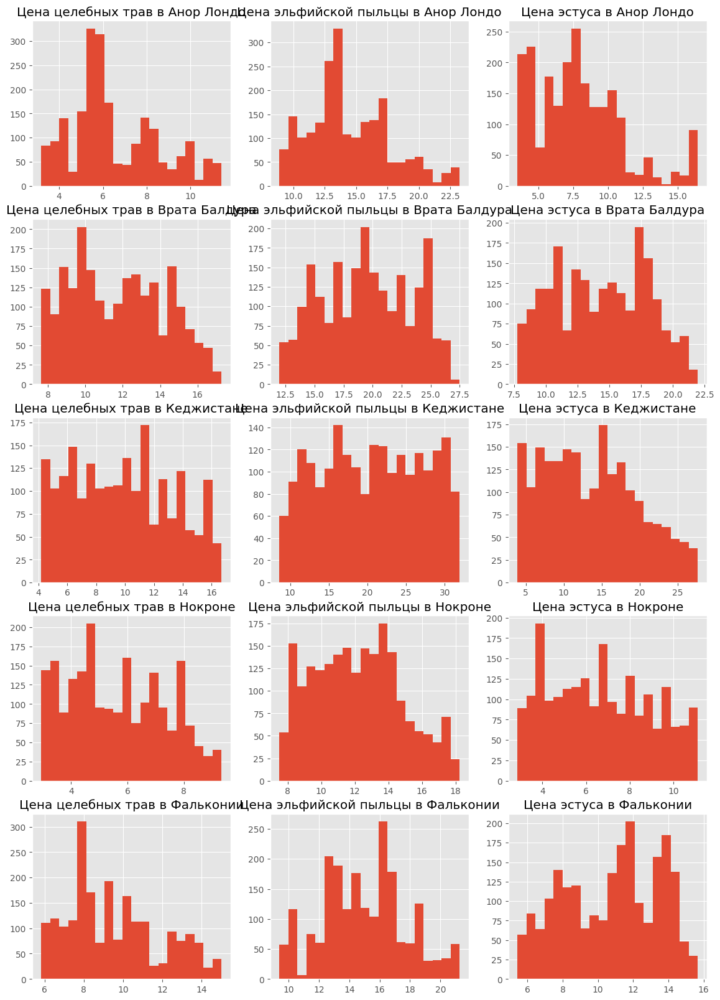

In [37]:
# визуализируем наши данные
fig, axs = plt.subplots(nrows=5, ncols= 3, figsize=(14, 20))

axs[0][0].hist(df_competitors[(df_competitors['place']==0) & (df_competitors['product']==0)]['price'], bins=20)
axs[0][0].set_title('Цена целебных трав в Анор Лондо')
axs[0][1].hist(df_competitors[(df_competitors['place']==0) & (df_competitors['product']==1)]['price'], bins=20)
axs[0][1].set_title('Цена эльфийской пыльцы в Анор Лондо')
axs[0][2].hist(df_competitors[(df_competitors['place']==0) & (df_competitors['product']==2)]['price'], bins=20)
axs[0][2].set_title('Цена эстуса в Анор Лондо')

axs[1][0].hist(df_competitors[(df_competitors['place']==1) & (df_competitors['product']==0)]['price'], bins=20)
axs[1][0].set_title('Цена целебных трав в Врата Балдура')
axs[1][1].hist(df_competitors[(df_competitors['place']==1) & (df_competitors['product']==1)]['price'], bins=20)
axs[1][1].set_title('Цена эльфийской пыльцы в Врата Балдура')
axs[1][2].hist(df_competitors[(df_competitors['place']==1) & (df_competitors['product']==2)]['price'], bins=20)
axs[1][2].set_title('Цена эстуса в Врата Балдура')

axs[2][0].hist(df_competitors[(df_competitors['place']==2) & (df_competitors['product']==0)]['price'], bins=20)
axs[2][0].set_title('Цена целебных трав в Кеджистане')
axs[2][1].hist(df_competitors[(df_competitors['place']==2) & (df_competitors['product']==1)]['price'], bins=20)
axs[2][1].set_title('Цена эльфийской пыльцы в Кеджистане')
axs[2][2].hist(df_competitors[(df_competitors['place']==2) & (df_competitors['product']==2)]['price'], bins=20)
axs[2][2].set_title('Цена эстуса в Кеджистане')

axs[3][0].hist(df_competitors[(df_competitors['place']==3) & (df_competitors['product']==0)]['price'], bins=20)
axs[3][0].set_title('Цена целебных трав в Нокроне')
axs[3][1].hist(df_competitors[(df_competitors['place']==3) & (df_competitors['product']==1)]['price'], bins=20)
axs[3][1].set_title('Цена эльфийской пыльцы в Нокроне')
axs[3][2].hist(df_competitors[(df_competitors['place']==3) & (df_competitors['product']==2)]['price'], bins=20)
axs[3][2].set_title('Цена эстуса в Нокроне')

axs[4][0].hist(df_competitors[(df_competitors['place']==4) & (df_competitors['product']==0)]['price'], bins=20)
axs[4][0].set_title('Цена целебных трав в Фальконии')
axs[4][1].hist(df_competitors[(df_competitors['place']==4) & (df_competitors['product']==1)]['price'], bins=20)
axs[4][1].set_title('Цена эльфийской пыльцы в Фальконии')
axs[4][2].hist(df_competitors[(df_competitors['place']==4) & (df_competitors['product']==2)]['price'], bins=20)
axs[4][2].set_title('Цена эстуса в Фальконии')

plt.show()

# данные не имеют выбросов
# В данных нет аномальных значений
# Из этого следует вывод, что данные не нуждаются в предварительной обработке

# Разведочный анализ данных

In [39]:
df_transaction.head()

,date,price,amount,cost,profit,hot,rain,snow,product_0,product_1,product_2,place_0,place_1,place_2,place_3,place_4,weekday
0,2216-01-02,3.9,48.549733,2.07,88.846011,1,0,0,1,0,0,1,0,0,0,0,1
1,2216-01-03,3.9,67.312626,2.07,123.182106,1,0,0,1,0,0,1,0,0,0,0,2
2,2216-01-04,3.9,45.116954,2.07,82.564027,0,0,0,1,0,0,1,0,0,0,0,3
3,2216-01-05,3.9,46.466839,2.07,85.034316,0,0,0,1,0,0,1,0,0,0,0,4
4,2216-01-06,3.9,66.719908,2.07,122.097432,0,0,1,1,0,0,1,0,0,0,0,5


In [40]:
df_transaction.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14998 entries, 0 to 14997
Data columns (total 17 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   date       14998 non-null  datetime64[ns]
 1   price      14998 non-null  float64       
 2   amount     14998 non-null  float64       
 3   cost       14998 non-null  float64       
 4   profit     14998 non-null  float64       
 5   hot        14998 non-null  int64         
 6   rain       14998 non-null  int64         
 7   snow       14998 non-null  int64         
 8   product_0  14998 non-null  int32         
 9   product_1  14998 non-null  int32         
 10  product_2  14998 non-null  int32         
 11  place_0    14998 non-null  int32         
 12  place_1    14998 non-null  int32         
 13  place_2    14998 non-null  int32         
 14  place_3    14998 non-null  int32         
 15  place_4    14998 non-null  int32         
 16  weekday    14998 non-null  int64        

In [41]:
df_transaction.describe(include=[np.number])

,price,amount,cost,profit,hot,rain,snow,product_0,product_1,product_2,place_0,place_1,place_2,place_3,place_4,weekday
count,14998.000000,14998.000000,14998.000000,14998.000000,14998.000000,14998.000000,14998.000000,14998.000000,14998.000000,14998.000000,14998.000000,14998.000000,14998.000000,14998.000000,14998.000000,14998.000000
mean,11.787471,57.510819,6.424587,299.145916,0.175223,0.172623,0.167222,0.333378,0.333244,0.333378,0.200027,0.199893,0.200027,0.200027,0.200027,3.003134
std,5.559835,15.008273,3.656906,179.767222,0.380171,0.377934,0.373187,0.471436,0.471389,0.471436,0.400033,0.399933,0.400033,0.400033,0.400033,1.998880
min,2.730000,0.033510,1.180000,0.494950,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,7.690000,48.226224,3.740000,166.741844,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
50%,10.530000,58.639145,5.460000,260.267833,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000
75%,14.810000,67.986017,8.230000,386.617434,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000
max,31.200000,119.981085,24.520000,1414.440290,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,6.000000


### Первые, очевидные выводы о данных
* Медианная прибыль за день состовляет 260 злотых (и отличается от средней на 15%)
* У нас 3 товара и 5 мест сбыта
* Почти в 45% дней присутствуют различные погодные явления
* Мы успешно избавились от нулевых значений

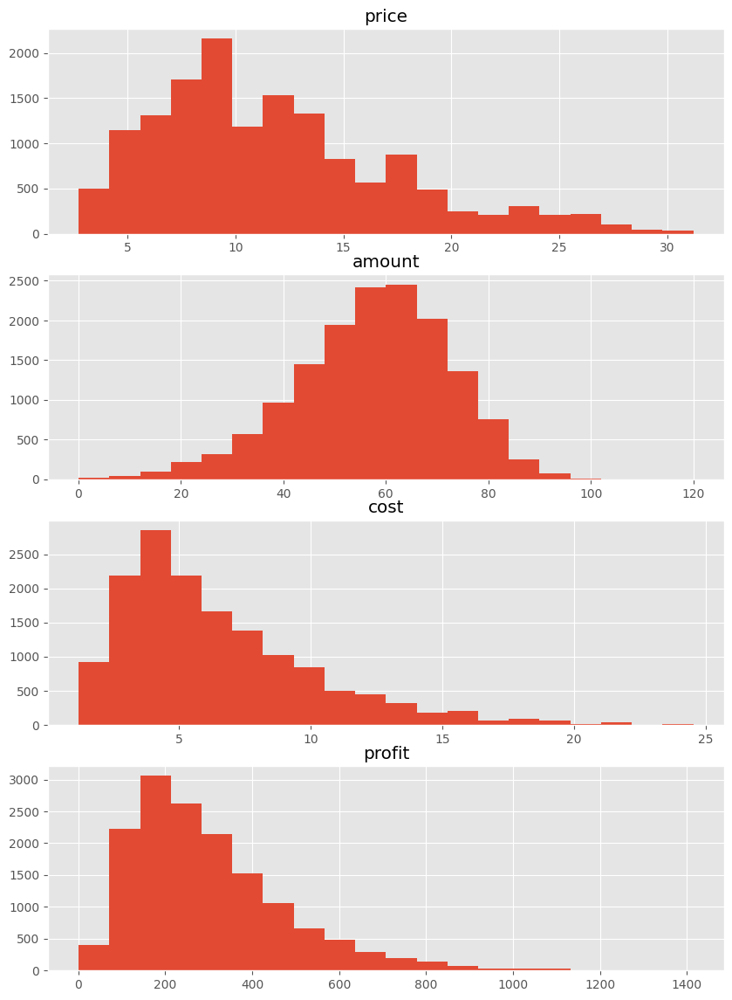

In [42]:
# посмотрим распределения числовых величин
fig, axs = plt.subplots(nrows=4, ncols= 1, figsize=(10, 14))

axs[0].hist(df_transaction['price'], bins=20)
axs[0].set_title('price')

axs[1].hist(df_transaction['amount'], bins=20)
axs[1].set_title('amount')

axs[2].hist(df_transaction['cost'], bins=20)
axs[2].set_title('cost')

axs[3].hist(df_transaction['profit'], bins=20)
axs[3].set_title('profit')


plt.show()
# есть длинный хвост у признака price, похоже на выбросы
# amount имеет распределение близкое к нормальному, но есть большой конец слева
# cost и profit имеют схожие распределения и они похожи на log нормальные
# у cost есть явный выбросы справа, как впрочем-то и у profit'a

In [43]:
# избавимся от выбросов и начном с колонки cost
df_transaction_clean = df_transaction[df_transaction['cost'] <= 20]

In [44]:
# воспользуемся правилом трех сигм для колонки amount
# Наблюдаемое отклонение от среднего
dev = (df_transaction_clean['amount']-df_transaction_clean['amount'].mean()).abs()
# Стандартное отклонение
std = df_transaction_clean['amount'].std()
# Фильтруем исходный набор данных
df_transaction_clean = df_transaction_clean[~(dev>3*std)]

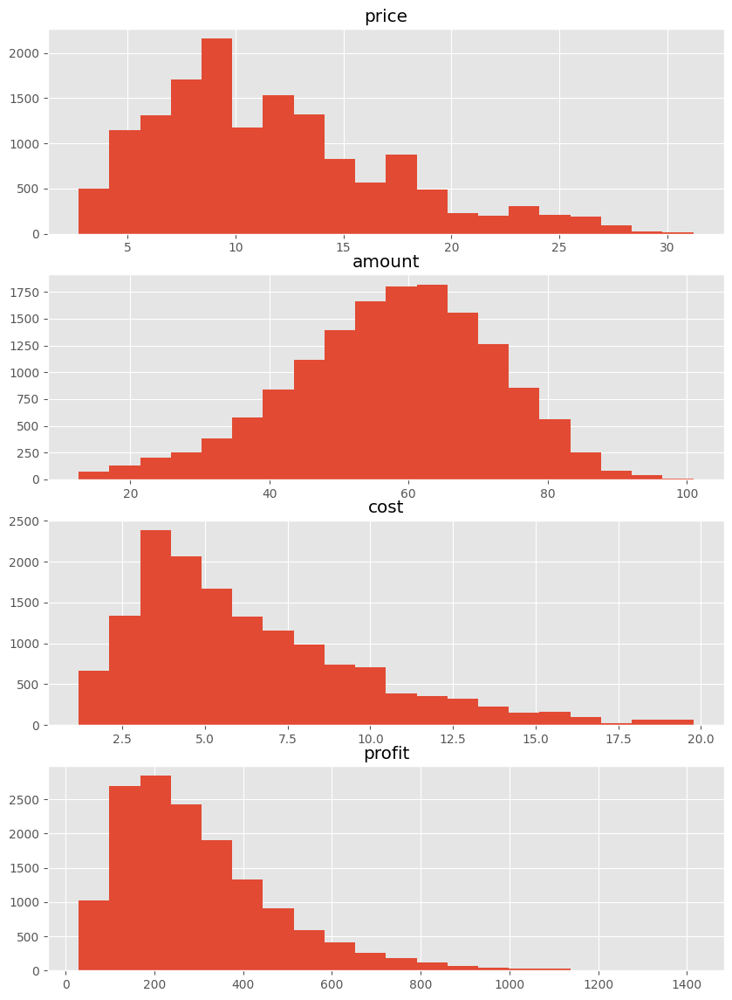

In [45]:
fig, axs = plt.subplots(nrows=4, ncols= 1, figsize=(10, 14))

axs[0].hist(df_transaction_clean['price'], bins=20)
axs[0].set_title('price')

axs[1].hist(df_transaction_clean['amount'], bins=20)
axs[1].set_title('amount')

axs[2].hist(df_transaction_clean['cost'], bins=20)
axs[2].set_title('cost')

axs[3].hist(df_transaction_clean['profit'], bins=20)
axs[3].set_title('profit')


plt.show()
# выглядит чуть ровнее

<Axes: >

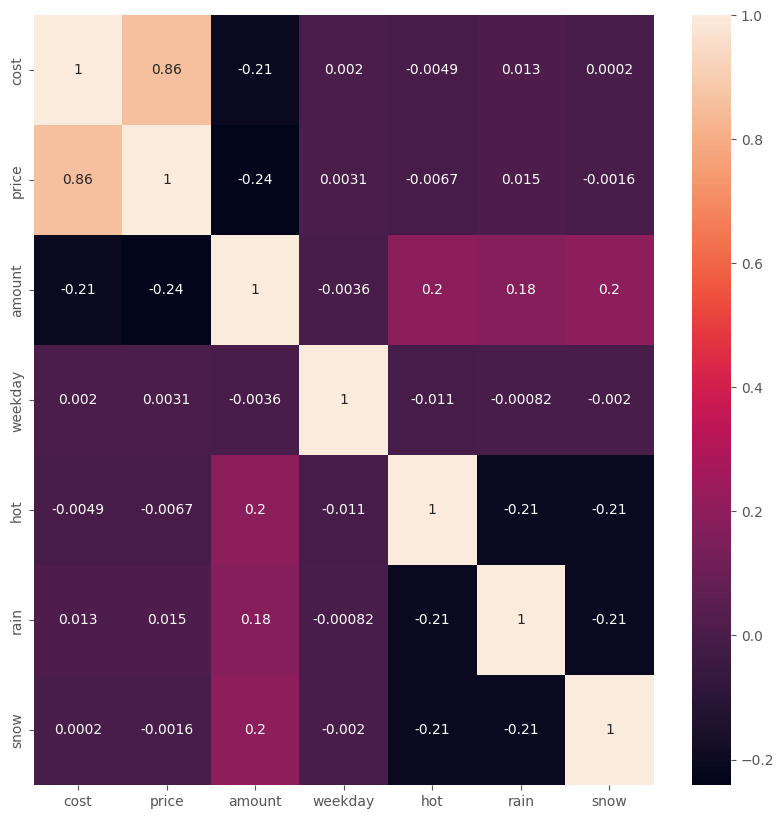

In [46]:
# посмотрим на внутренние кореляции в данных в зависимости от погоды
numeric_feature = ['cost', 'price', 'amount', 'weekday', 'hot', 'rain', 'snow']

fig, ax = plt.subplots(figsize=(10,10))
sns.heatmap(df_transaction_clean[numeric_feature].corr(), annot=True, ax=ax)
# уверенных кореляций не обнаружено

<Axes: >

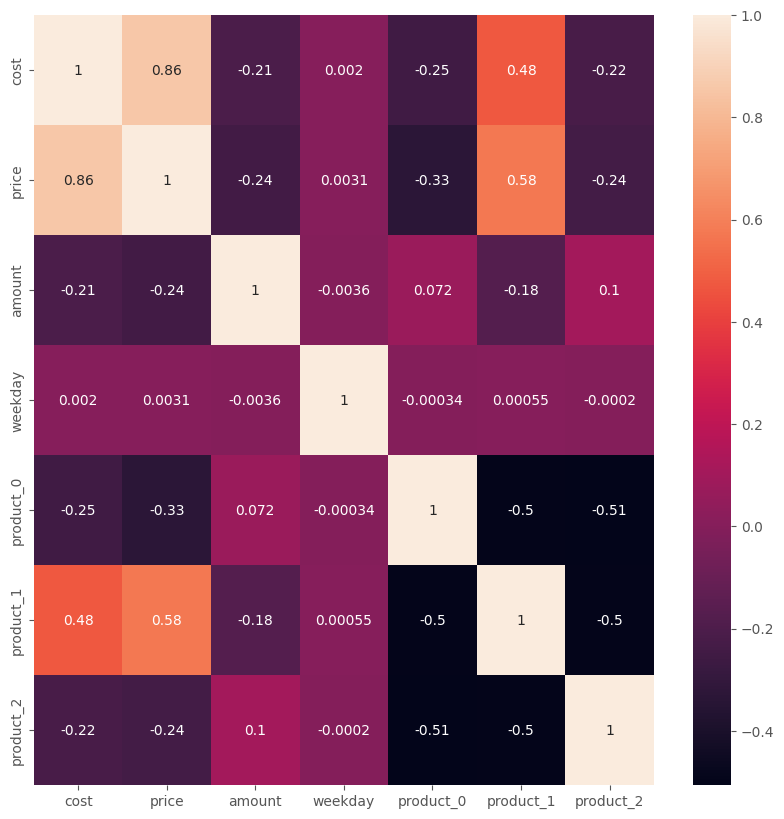

In [47]:
# посмотрим на внутренние кореляции в данных в зависимости от продукта
numeric_feature = ['cost', 'price', 'amount', 'weekday', 'product_0', 'product_1', 'product_2']

fig, ax = plt.subplots(figsize=(10,10))
sns.heatmap(df_transaction_clean[numeric_feature].corr(), annot=True, ax=ax)
# есть средняя кореляция между ценой и продуктом (что логично)

<Axes: >

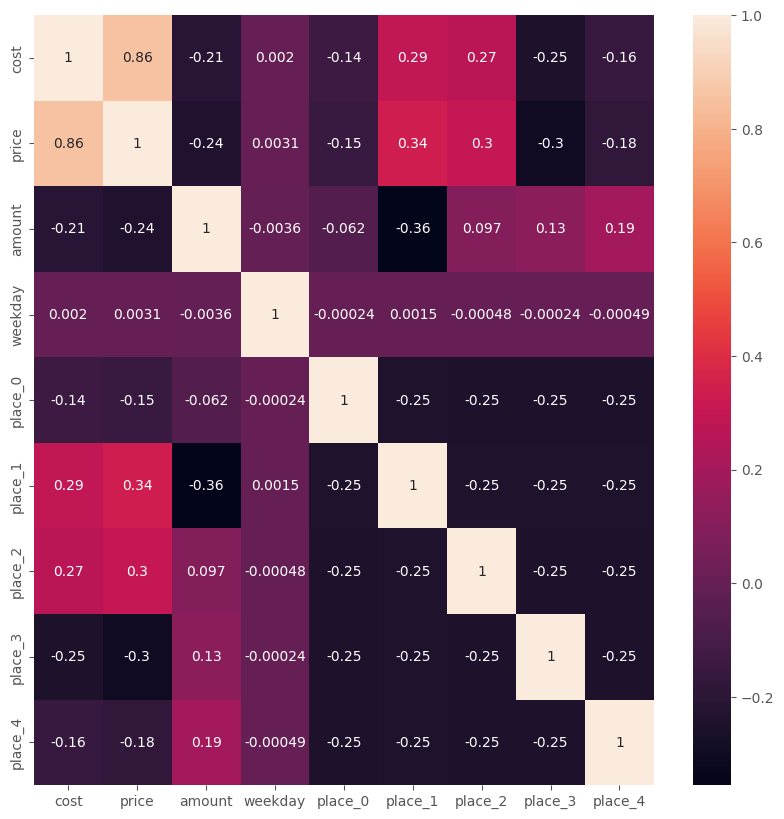

In [48]:
# посмотрим на внутренние кореляции в данных в зависимости от места
numeric_feature = ['cost', 'price', 'amount', 'weekday', 'place_0', 'place_1', 'place_2', 'place_3', 'place_4']

fig, ax = plt.subplots(figsize=(10,10))
sns.heatmap(df_transaction_clean[numeric_feature].corr(), annot=True, ax=ax)
# нет уверенных кореляция от места

In [49]:
# создадим колонку weather, в которую запишем сумму по колонкам hot, rain и snow
# в итоге получим колонку, которая хранит 0 в случае хорошей погоды и 1 в случае каких то погодных явлений
df_transaction_clean['weather'] = df_transaction_clean[['hot', 'rain', 'snow']].apply(lambda x: sum(x), axis=1)

<Axes: title={'center': 'amount'}, xlabel='weather'>

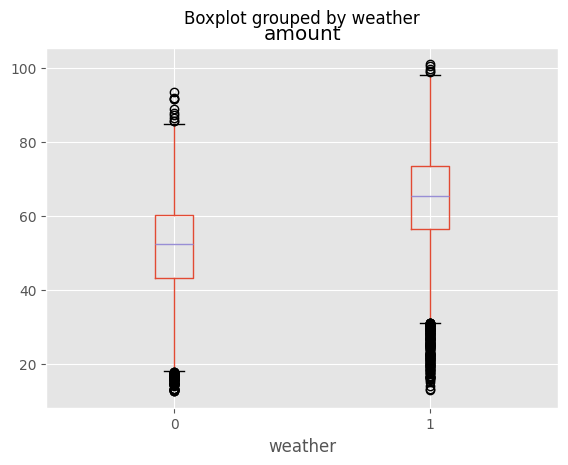

In [50]:
df_transaction_clean.boxplot(column='amount', by='weather')
# из графика видно, что количество проданых товаров при каких либо погодных условиях выше
# эта информация поможет для построения модели в будущем

<Axes: title={'center': 'cost'}, xlabel='[product_0, product_1, product_2]'>

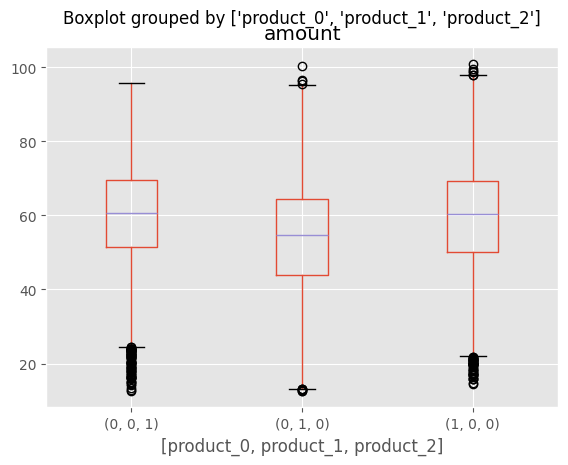

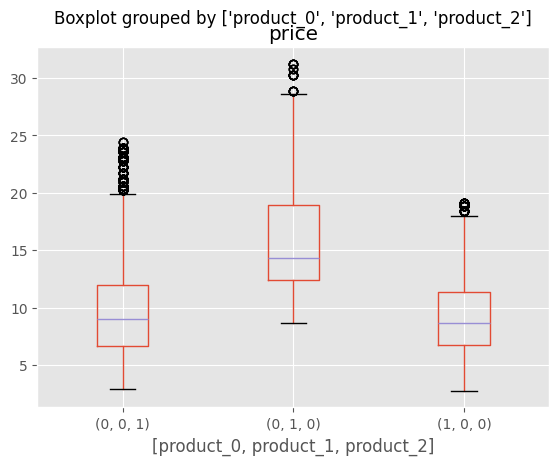

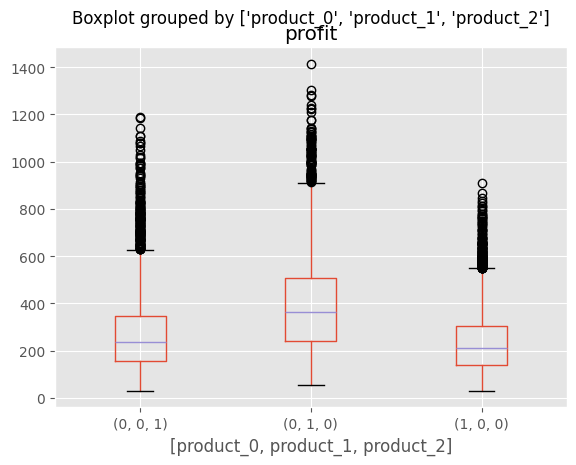

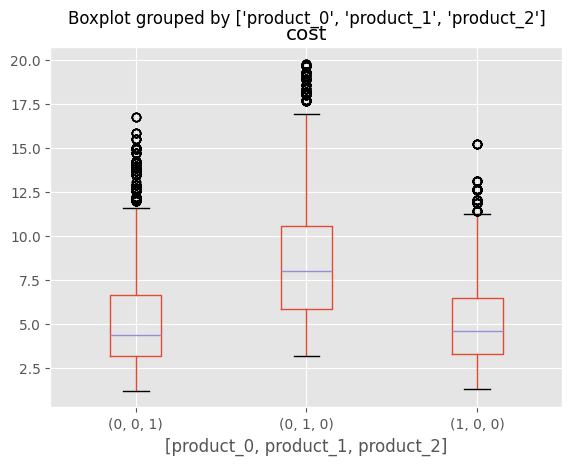

In [51]:
df_transaction_clean.boxplot(column='amount', by=['product_0', 'product_1', 'product_2'])
df_transaction_clean.boxplot(column='price', by=['product_0', 'product_1', 'product_2'])
df_transaction_clean.boxplot(column='profit', by=['product_0', 'product_1', 'product_2'])
df_transaction_clean.boxplot(column='cost', by=['product_0', 'product_1', 'product_2'])
# Эльфийская пыльца продается в меньшем количестве, но имеет сильно более выскоую цену ввиду высокой себестоимости
# в следствии этого, с этого продукта идет максимальная прибыль

<Axes: title={'center': 'cost'}, xlabel='[place_0, place_1, place_2, place_3, place_4]'>

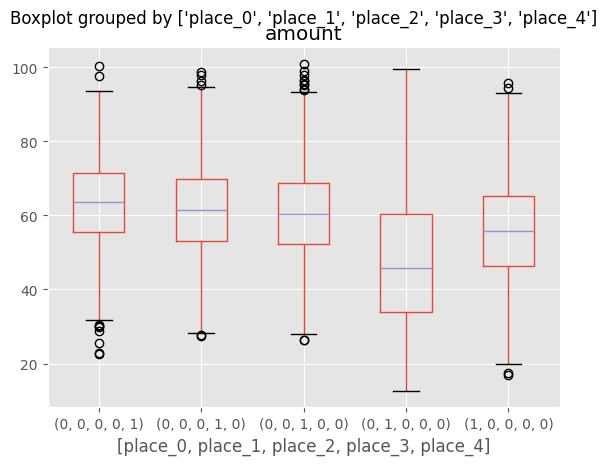

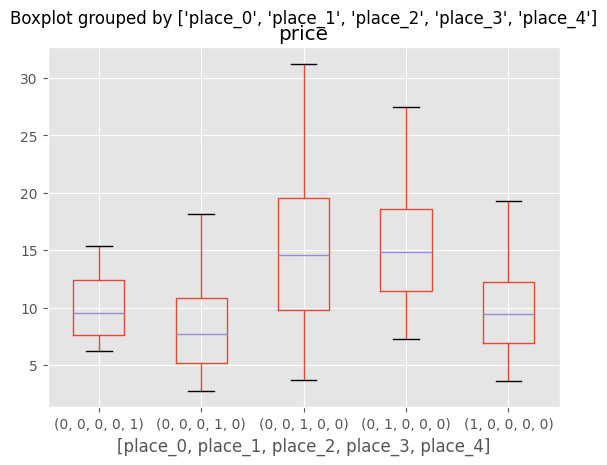

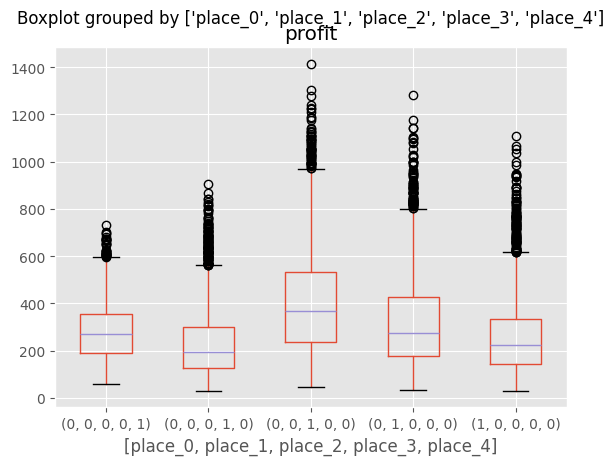

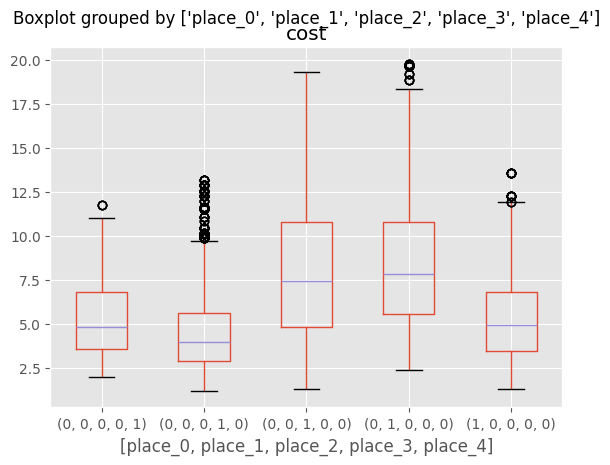

In [52]:
df_transaction_clean.boxplot(column='amount', by=['place_0', 'place_1', 'place_2', 'place_3', 'place_4'])
df_transaction_clean.boxplot(column='price', by=['place_0', 'place_1', 'place_2', 'place_3', 'place_4'])
df_transaction_clean.boxplot(column='profit', by=['place_0', 'place_1', 'place_2', 'place_3', 'place_4'])
df_transaction_clean.boxplot(column='cost', by=['place_0', 'place_1', 'place_2', 'place_3', 'place_4'])
# меньше всего продаж во втором городе
# при этом большая прибыль с третьего
# в этих же местах и самые высокие цены - элитные районы или крайний север)
# наивысшая себестоимость во 2 и третем местах

In [53]:
# преобразуем дату в день/месяц/год

df_transaction_clean['year'] = df_transaction_clean['date'].apply(lambda x: x.year)
df_transaction_clean['month'] = df_transaction_clean['date'].apply(lambda x: x.month)
df_transaction_clean['day'] = df_transaction_clean['date'].apply(lambda x: x.day)

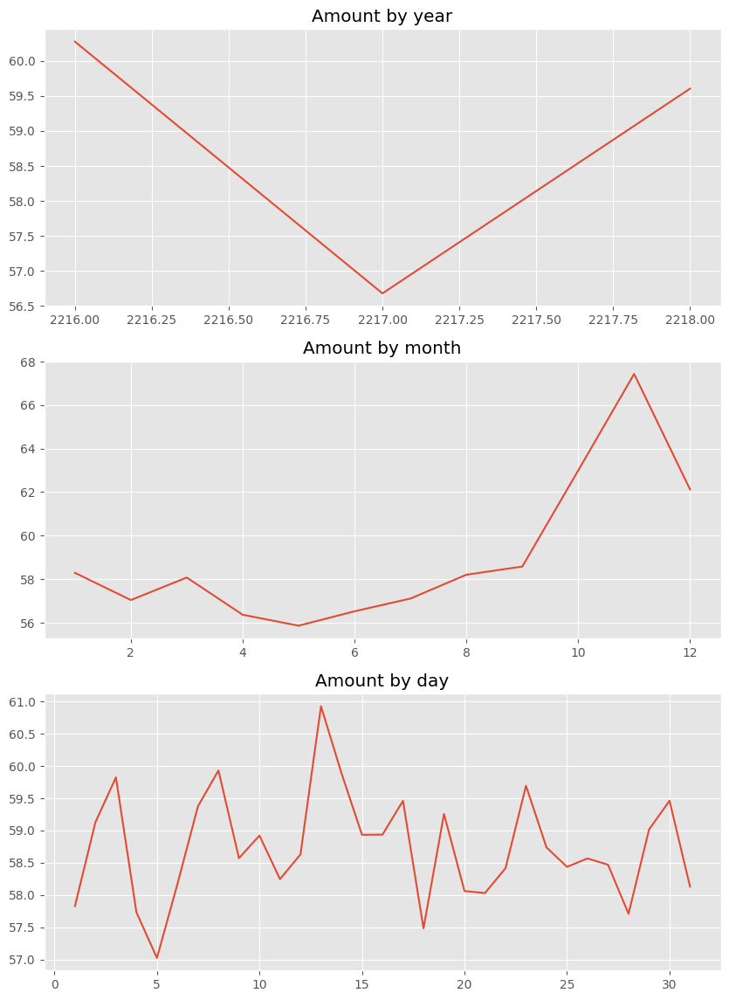

In [54]:
fig, axs = plt.subplots(nrows=3, ncols= 1, figsize=(10, 14))

axs[0].plot(df_transaction_clean.groupby('year').median()['amount'])
axs[0].set_title('Amount by year')

axs[1].plot(df_transaction_clean.groupby('month').median()['amount'])
axs[1].set_title('Amount by month')

axs[2].plot(df_transaction_clean.groupby('day').median()['amount'])
axs[2].set_title('Amount by day')


plt.show()
# из графика видим, что число продаж начинает резко расти с 8 месяца и достигает максимума в 11
# в 2217 году были низкие продажи

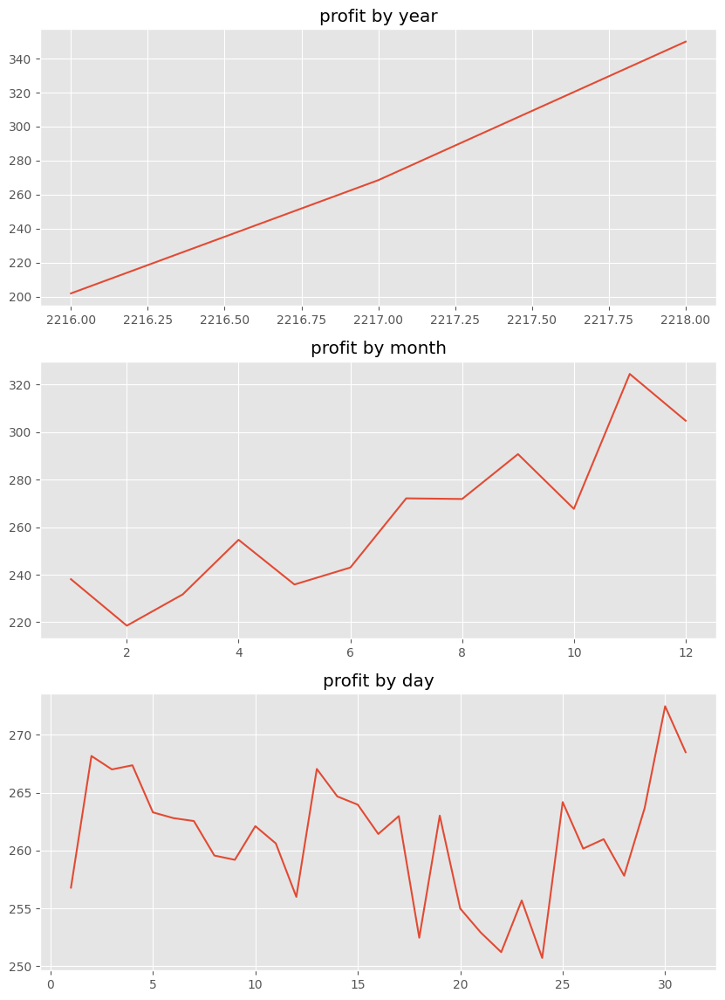

In [55]:
fig, axs = plt.subplots(nrows=3, ncols= 1, figsize=(10, 14))

axs[0].plot(df_transaction_clean.groupby('year').median()['profit'])
axs[0].set_title('profit by year')

axs[1].plot(df_transaction_clean.groupby('month').median()['profit'])
axs[1].set_title('profit by month')

axs[2].plot(df_transaction_clean.groupby('day').median()['profit'])
axs[2].set_title('profit by day')


plt.show()
# прибыль растет из года в год

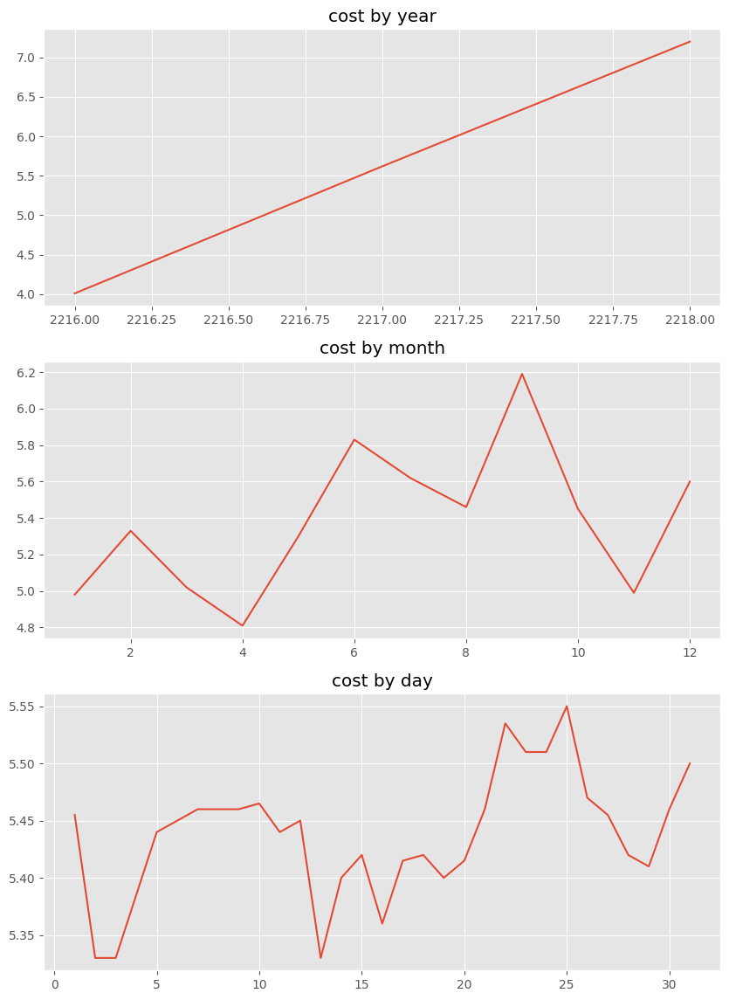

In [56]:
fig, axs = plt.subplots(nrows=3, ncols= 1, figsize=(10, 14))

axs[0].plot(df_transaction_clean.groupby('year').median()['cost'])
axs[0].set_title('cost by year')

axs[1].plot(df_transaction_clean.groupby('month').median()['cost'])
axs[1].set_title('cost by month')

axs[2].plot(df_transaction_clean.groupby('day').median()['cost'])
axs[2].set_title('cost by day')


plt.show()
# себестоимость также растут из года в год

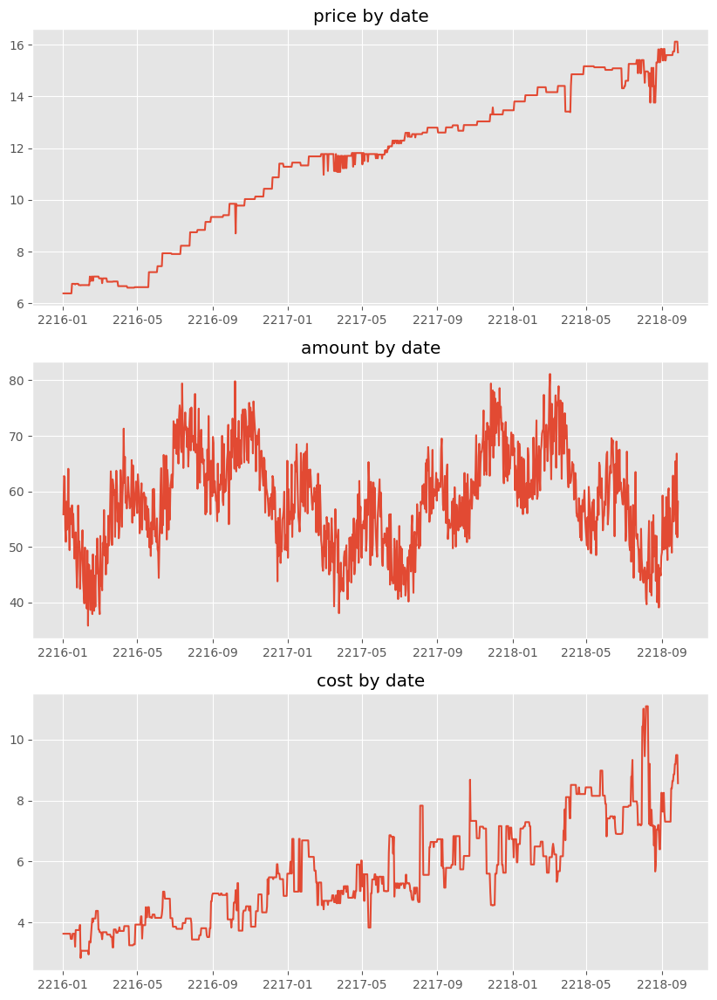

In [57]:
# посмотрим распределение по дате
fig, axs = plt.subplots(nrows=3, ncols= 1, figsize=(10, 14))

axs[0].plot(df_transaction_clean.groupby('date').median()['price'])
axs[0].set_title('price by date')

axs[1].plot(df_transaction_clean.groupby('date').median()['amount'])
axs[1].set_title('amount by date')

axs[2].plot(df_transaction_clean.groupby('date').median()['cost'])
axs[2].set_title('cost by date')

plt.show()

# цена имеет восходящий линейный тренд и не имеет сезонной составляющей
# количество продаж описывается аддетивной моделью, у него есть сезонная составляющая (похожа на квартальную). 
# При этом есть еще одна годовая сезонность, которая накладывается на квартальную.
# Себестоимость так же имеет восходящий линейный тренд и не имеет сезонности

### Посмотрим данные по отдельным продуктам

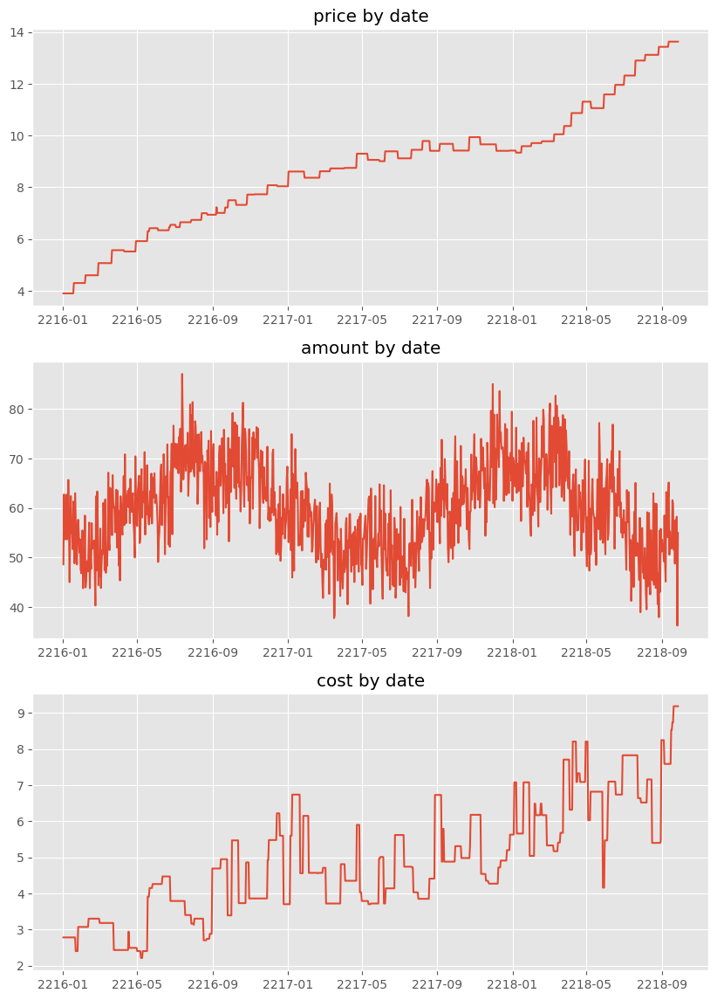

In [66]:
fig, axs = plt.subplots(nrows=3, ncols= 1, figsize=(10, 14))

axs[0].plot(df_transaction_clean[df_transaction_clean['product_0'] == 1].groupby('date').median()['price'])
axs[0].set_title('price by date')

axs[1].plot(df_transaction_clean[df_transaction_clean['product_0'] == 1].groupby('date').median()['amount'])
axs[1].set_title('amount by date')

axs[2].plot(df_transaction_clean[df_transaction_clean['product_0'] == 1].groupby('date').median()['cost'])
axs[2].set_title('cost by date')

plt.show()

# У первого продукта линейный восходящий тренд для цены и себестоимости
# Количество продаж имеет годовую сезонную состовляющую, описываемую аддетивной моделью, и боковой тренд
# ряды не менют свой характер

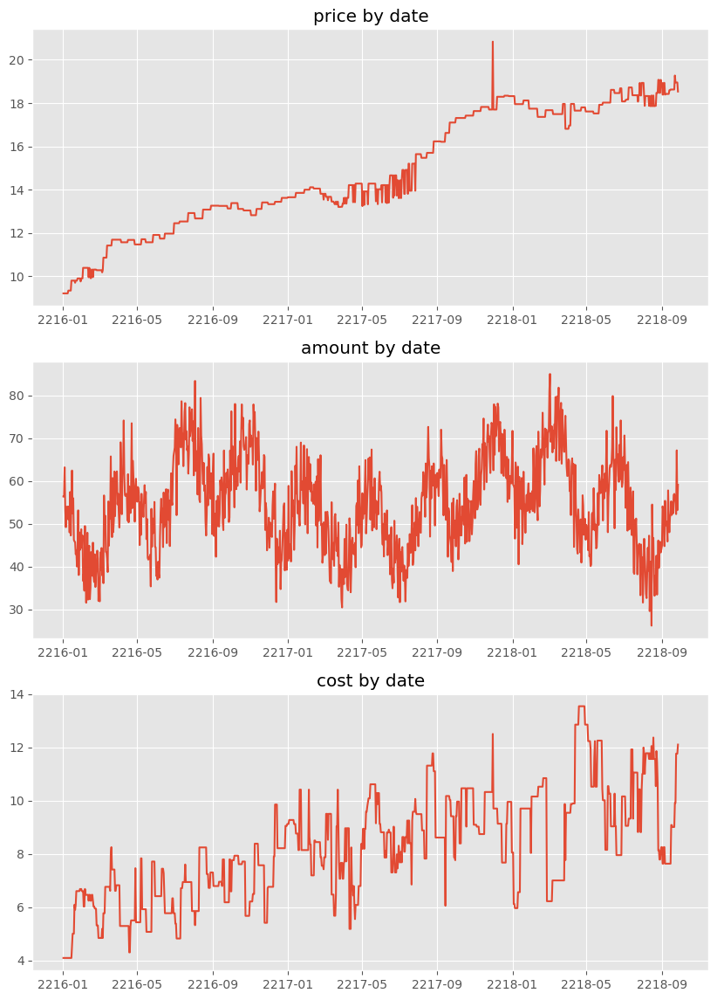

In [67]:
fig, axs = plt.subplots(nrows=3, ncols= 1, figsize=(10, 14))

axs[0].plot(df_transaction_clean[df_transaction_clean['product_1'] == 1].groupby('date').median()['price'])
axs[0].set_title('price by date')

axs[1].plot(df_transaction_clean[df_transaction_clean['product_1'] == 1].groupby('date').median()['amount'])
axs[1].set_title('amount by date')

axs[2].plot(df_transaction_clean[df_transaction_clean['product_1'] == 1].groupby('date').median()['cost'])
axs[2].set_title('cost by date')

plt.show()

# У второго продукта линейный восходящий тренд для цены и себестоимости
# Количество продаж имеет годовую сезонную состовляющую (период 3-4 месяца), описываемую аддетивной моделью, и боковой тренд
# ряды не менют свой характер

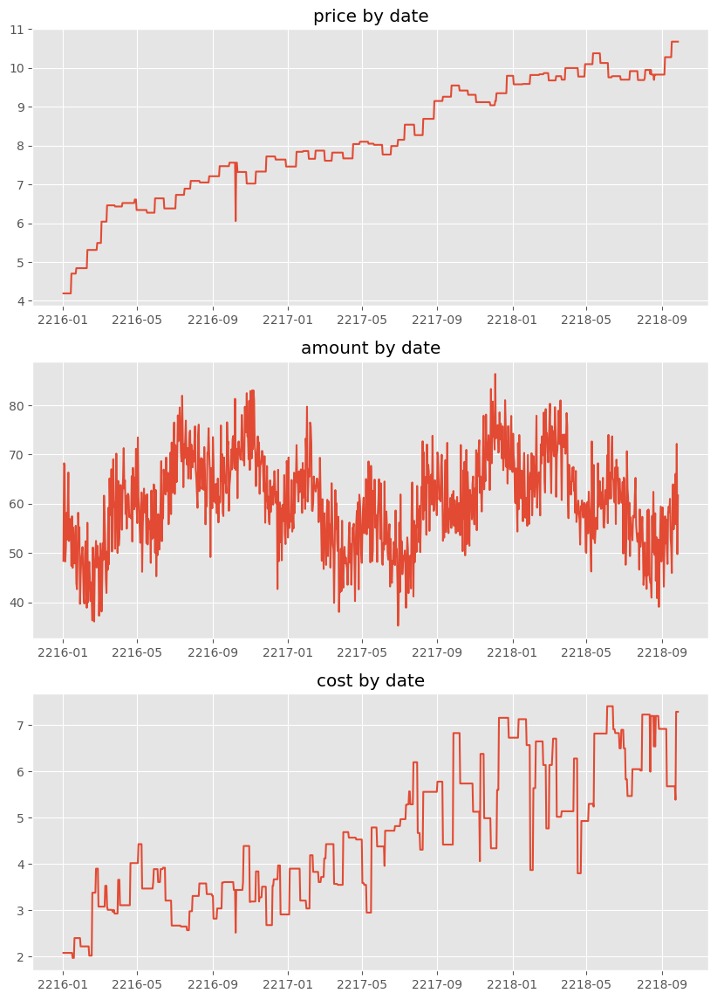

In [75]:
fig, axs = plt.subplots(nrows=3, ncols= 1, figsize=(10, 14))

axs[0].plot(df_transaction_clean[df_transaction_clean['product_2'] == 1].groupby('date').median()['price'])
axs[0].set_title('price by date')

axs[1].plot(df_transaction_clean[df_transaction_clean['product_2'] == 1].groupby('date').median()['amount'])
axs[1].set_title('amount by date')

axs[2].plot(df_transaction_clean[df_transaction_clean['product_2'] == 1].groupby('date').median()['cost'])
axs[2].set_title('cost by date')

plt.show()

# У третьего продукта линейный восходящий тренд для цены и себестоимости
# Количество продаж имеет годовую сезонную состовляющую (цикл каждые 3-4 месяца), описываемую аддетивной моделью, и боковой тренд
# ряды не менют свой характер

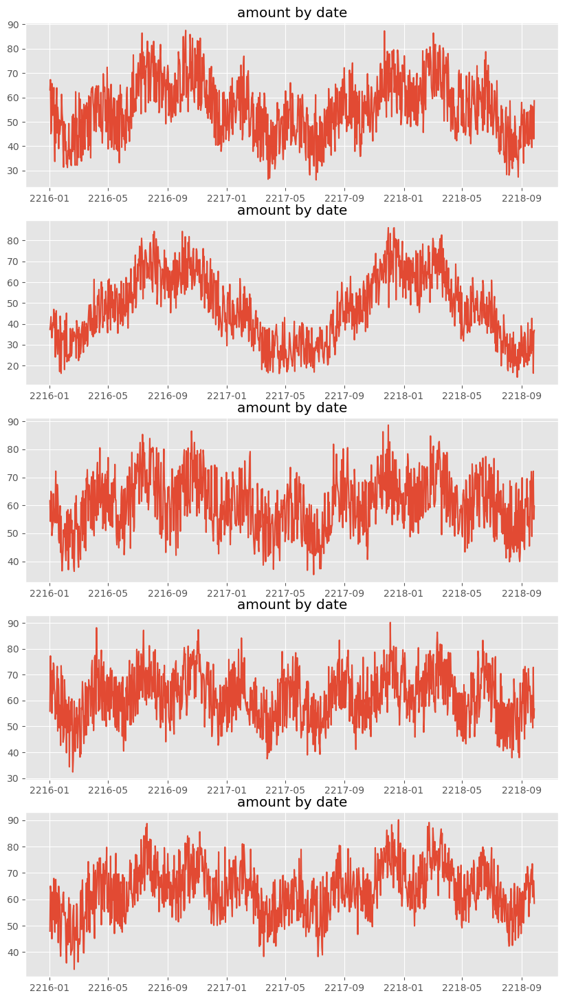

In [74]:
# Посмотрим данные по отдельным продуктам

fig, axs = plt.subplots(nrows=5, ncols= 1, figsize=(10, 18))


axs[0].plot(df_transaction_clean[df_transaction_clean['place_0'] == 1].groupby('date').median()['amount'])
axs[0].set_title('amount by date')

axs[1].plot(df_transaction_clean[df_transaction_clean['place_1'] == 1].groupby('date').median()['amount'])
axs[1].set_title('amount by date')

axs[2].plot(df_transaction_clean[df_transaction_clean['place_2'] == 1].groupby('date').median()['amount'])
axs[2].set_title('amount by date')

axs[3].plot(df_transaction_clean[df_transaction_clean['place_3'] == 1].groupby('date').median()['amount'])
axs[3].set_title('amount by date')

axs[4].plot(df_transaction_clean[df_transaction_clean['place_4'] == 1].groupby('date').median()['amount'])
axs[4].set_title('amount by date')


plt.show()

# Во всех местах количество продаж имеет боковой тренд
# Во втором месте есть сезонность с периодом 1.5 года. Такая же есть и в первом месте, но менее ярко выражена
# ряды не менют свой характер

<Axes: title={'center': 'profit'}, xlabel='weekday'>

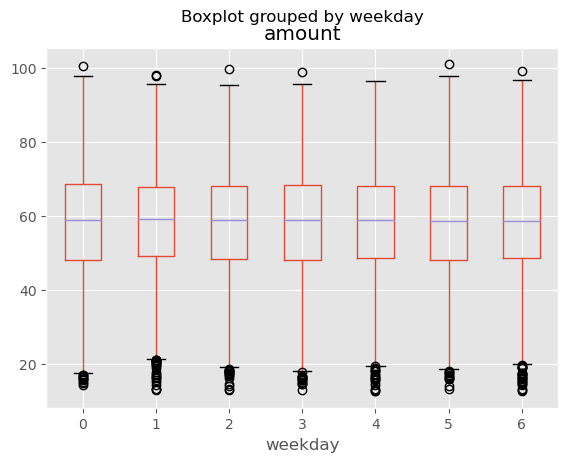

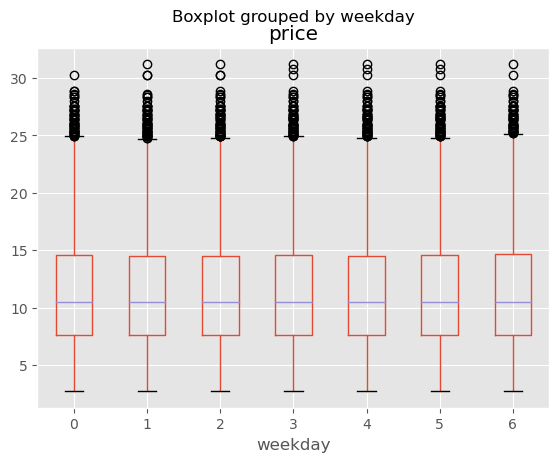

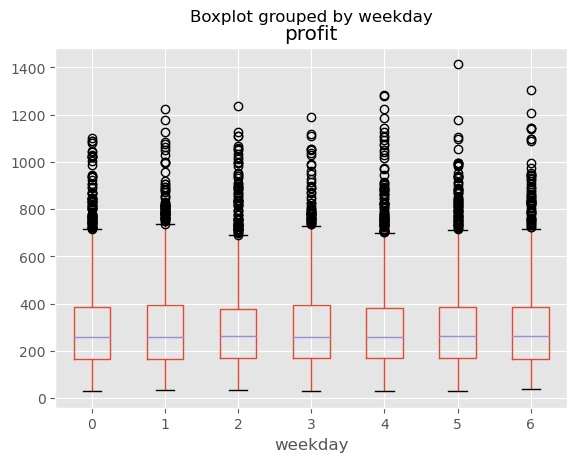

In [48]:
df_transaction_clean.boxplot(column='amount', by='weekday')
df_transaction_clean.boxplot(column='price', by='weekday')
df_transaction_clean.boxplot(column='profit', by='weekday')
# зависимости не обнаружено ((

# Построение моделей

Нам нужно построить модель для предсказания прибыли на каждый из 90 дней в зависимости от выбранной цены.

Изначально мы имеем только 2 признака - дата и цена (которую мы задаем), но нам точно нужны колонки количества проданного товара и себестоимости. Себестоимость нам нужно спрогнозировать на основе данных прошлых месяцев, так как на нее не влияют такие факторы как, например, цена, которую мы будем менять. Для количества проданного товара необходимо построить регрессионную модель. Помимо этого будет полезно предсказывать погоду, так как есть зависимость по этому признаку. Также нужно спрогнозировать цены конкурентов, чтобы иметь понимание о всем рынке

## 1. Прогнозирование себестоимости товаров

Теперь нам нужно спрогнозировать себестоимость для каждого товара в каждый момент времени в каждой локации
Для этого восполюзуемся фреймом df_cost

In [58]:
# преобразуем в нем места и продукты в числовой формат

df_cost['product'] = df_cost['product'].apply(lambda x: products[x]) # меняем продукт на соответсвтующую цифру
df_cost['place'] = df_cost['place'].apply(lambda x: places[x]) # меняем место на соответсвтующую цифру
df_cost.head()

,place,product,cost,date
0,0,0,2.07,2216-01-02
1,0,0,3.07,2216-01-26
2,0,0,3.30,2216-02-12
3,0,0,4.04,2216-03-06
4,0,0,3.88,2216-03-27


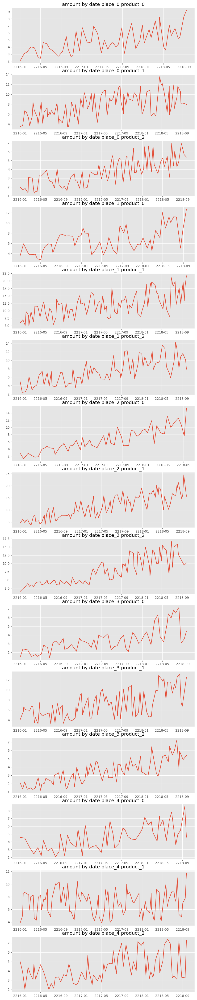

In [59]:
fig, axs = plt.subplots(nrows=15, ncols= 1, figsize=(10, 54))


axs[0].plot(df_cost[(df_cost['place'] == 0) & (df_cost['product'] == 0)].groupby('date').median()['cost'])
axs[0].set_title('amount by date place_0 product_0')
axs[1].plot(df_cost[(df_cost['place'] == 0) & (df_cost['product'] == 1)].groupby('date').median()['cost'])
axs[1].set_title('amount by date place_0 product_1')
axs[2].plot(df_cost[(df_cost['place'] == 0) & (df_cost['product'] == 2)].groupby('date').median()['cost'])
axs[2].set_title('amount by date place_0 product_2')

axs[3].plot(df_cost[(df_cost['place'] == 1) & (df_cost['product'] == 0)].groupby('date').median()['cost'])
axs[3].set_title('amount by date place_1 product_0')
axs[4].plot(df_cost[(df_cost['place'] == 1) & (df_cost['product'] == 1)].groupby('date').median()['cost'])
axs[4].set_title('amount by date place_1 product_1')
axs[5].plot(df_cost[(df_cost['place'] == 1) & (df_cost['product'] == 2)].groupby('date').median()['cost'])
axs[5].set_title('amount by date place_1 product_2')

axs[6].plot(df_cost[(df_cost['place'] == 2) & (df_cost['product'] == 0)].groupby('date').median()['cost'])
axs[6].set_title('amount by date place_2 product_0')
axs[7].plot(df_cost[(df_cost['place'] == 2) & (df_cost['product'] == 1)].groupby('date').median()['cost'])
axs[7].set_title('amount by date place_2 product_1')
axs[8].plot(df_cost[(df_cost['place'] == 2) & (df_cost['product'] == 2)].groupby('date').median()['cost'])
axs[8].set_title('amount by date place_2 product_2')

axs[9].plot(df_cost[(df_cost['place'] == 3) & (df_cost['product'] == 0)].groupby('date').median()['cost'])
axs[9].set_title('amount by date place_3 product_0')
axs[10].plot(df_cost[(df_cost['place'] == 3) & (df_cost['product'] == 1)].groupby('date').median()['cost'])
axs[10].set_title('amount by date place_3 product_1')
axs[11].plot(df_cost[(df_cost['place'] == 3) & (df_cost['product'] == 2)].groupby('date').median()['cost'])
axs[11].set_title('amount by date place_3 product_2')

axs[12].plot(df_cost[(df_cost['place'] == 4) & (df_cost['product'] == 0)].groupby('date').median()['cost'])
axs[12].set_title('amount by date place_4 product_0')
axs[13].plot(df_cost[(df_cost['place'] == 4) & (df_cost['product'] == 1)].groupby('date').median()['cost'])
axs[13].set_title('amount by date place_4 product_1')
axs[14].plot(df_cost[(df_cost['place'] == 4) & (df_cost['product'] == 2)].groupby('date').median()['cost'])
axs[14].set_title('amount by date place_4 product_2')


plt.show()

# данные имют ступенчатыый вид, так как мы заполняли пропуски верхними значениями
# посмотрим как это отразится на предсказании

In [60]:
print(len(df_cost['cost']))

1117


Всего мы имеем 1117 уникальных себестоимостей.
Это значит, что каждый товар в каждом месте имеет около 74 себестоимостей. Так как всего у нас данные о 1000 днях, то можно сделать вывод, что в среднем, себестоимость меянется (производятся закупки) каждые 14 дней. 

Исходя из этого , нам нужно спрогноизровать цены 6 закупок (90//14), который мы будем проводить каждые 14 день в нашем прогнозе

In [61]:
# однако, из графиков мы видим, что разные товары закупаются по разному (вне зависимости от места), убедимся в этом на числах
print(len(df_cost[df_cost['product'] == 0]['cost']))
print(len(df_cost[df_cost['product'] == 1]['cost']))
print(len(df_cost[df_cost['product'] == 2]['cost']))

# так и есть

272
464
381


Всвязи с эти скорректируем наши выводы по поводу частоты изменения себестоимости

Первый товар, в среднем, изменил свою себестоимость по 54 раза в точке. Интервал закупок 1000//54 = 18

Второй товар, в среднем, изменил свою себестоимость по 93 раза в точке. Интервал закупок 1000 // 93 = 11

Третий товар, в среднем, изменил свою себестоимость по 76 раз в точке. Интервал закупок 1000 // 76 = 13

Исходя из этого , нам нужно спрогноизровать:
* цены 5 закупок (90//18) для первого товара
* Цены 9 закупок (90//11) для второго товара
* Цены 8 закупок (90//13) для третьего товара

In [62]:
# зададим горизонты
horizont_0 = 5
horizont_1 = 9
horizont_2 = 7


Все временные ряды имеют схожую природу, поэтому опишем их один раз

1. У временных рядов восходящий тренд (кроме place_4 product_1 - у него боковой)
2. У временных рядов мультиплекативная сезонность (исключения: place_1, product_0; place_4, product_4; place_4, product_2)
3. Ряд не меняет свой характер (исплюкчениz: place_2, product_2; place_4, product_0; place_4, product_2)
4. У рядов нет выбросов
5. У рядов нет пропусков

In [63]:
# подготовим данные

# теперь повторю все действия для каждой из комбинации локации и третьего товара
data_cost_0_0 = df_cost[(df_cost['place'] == 0) & (df_cost['product'] == 0)].groupby('date').median()['cost']
data_cost_0_0 = data_cost_0_0.reset_index()

data_cost_1_0 = df_cost[(df_cost['place'] == 1) & (df_cost['product'] == 0)].groupby('date').median()['cost']
data_cost_1_0 = data_cost_1_0.reset_index()

data_cost_2_0 = df_cost[(df_cost['place'] == 2) & (df_cost['product'] == 0)].groupby('date').median()['cost']
data_cost_2_0 = data_cost_2_0.reset_index()

data_cost_3_0 = df_cost[(df_cost['place'] == 3) & (df_cost['product'] == 0)].groupby('date').median()['cost']
data_cost_3_0 = data_cost_3_0.reset_index()

data_cost_4_0 = df_cost[(df_cost['place'] == 4) & (df_cost['product'] == 0)].groupby('date').median()['cost']
data_cost_4_0 = data_cost_4_0.reset_index()

data_cost_0_1 = df_cost[(df_cost['place'] == 0) & (df_cost['product'] == 1)].groupby('date').median()['cost']
data_cost_0_1 = data_cost_0_1.reset_index()

data_cost_1_1 = df_cost[(df_cost['place'] == 1) & (df_cost['product'] == 1)].groupby('date').median()['cost']
data_cost_1_1 = data_cost_1_1.reset_index()

data_cost_2_1 = df_cost[(df_cost['place'] == 2) & (df_cost['product'] == 1)].groupby('date').median()['cost']
data_cost_2_1 = data_cost_2_1.reset_index()

data_cost_3_1 = df_cost[(df_cost['place'] == 3) & (df_cost['product'] == 1)].groupby('date').median()['cost']
data_cost_3_1 = data_cost_3_1.reset_index()

data_cost_4_1 = df_cost[(df_cost['place'] == 4) & (df_cost['product'] == 1)].groupby('date').median()['cost']
data_cost_4_1 = data_cost_4_1.reset_index()

data_cost_0_2 = df_cost[(df_cost['place'] == 0) & (df_cost['product'] == 2)].groupby('date').median()['cost']
data_cost_0_2 = data_cost_0_2.reset_index()

data_cost_1_2 = df_cost[(df_cost['place'] == 1) & (df_cost['product'] == 2)].groupby('date').median()['cost']
data_cost_1_2 = data_cost_1_2.reset_index()

data_cost_2_2 = df_cost[(df_cost['place'] == 2) & (df_cost['product'] == 2)].groupby('date').median()['cost']
data_cost_2_2 = data_cost_2_2.reset_index()

data_cost_3_2 = df_cost[(df_cost['place'] == 3) & (df_cost['product'] == 2)].groupby('date').median()['cost']
data_cost_3_2 = data_cost_3_2.reset_index()

data_cost_4_2 = df_cost[(df_cost['place'] == 4) & (df_cost['product'] == 2)].groupby('date').median()['cost']
data_cost_4_2 = data_cost_4_2.reset_index()

Text(0.5, 1.0, 'Себестоимость')

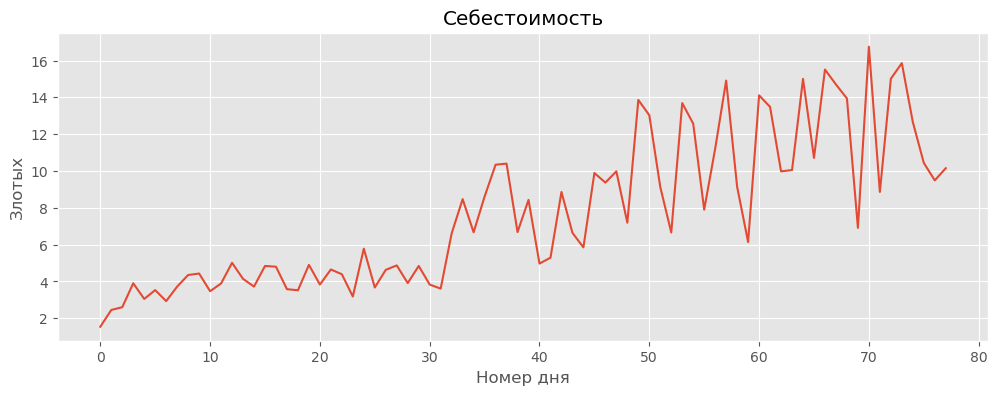

In [197]:
fig = plt.figure(figsize=(12, 4))
data_cost_2_2['cost'].plot()
plt.xlabel(u'Номер дня')
plt.ylabel(u'Злотых')
plt.title(u'Себестоимость')
# ряд менятся после 30 наблюдения

Text(0.5, 1.0, 'Себестоимость')

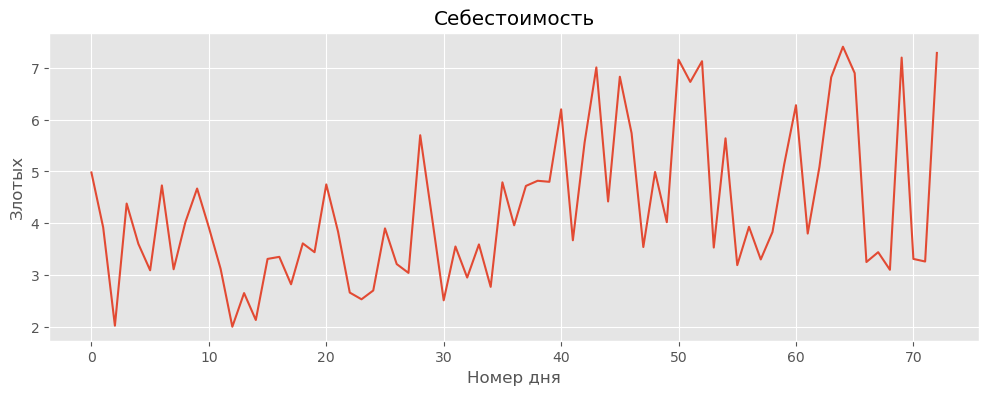

In [526]:
fig = plt.figure(figsize=(12, 4))
data_cost_4_2['cost'].plot()
plt.xlabel(u'Номер дня')
plt.ylabel(u'Злотых')
plt.title(u'Себестоимость')
# ряд менятся после 47 наблюдения

Text(0.5, 1.0, 'Себестоимость')

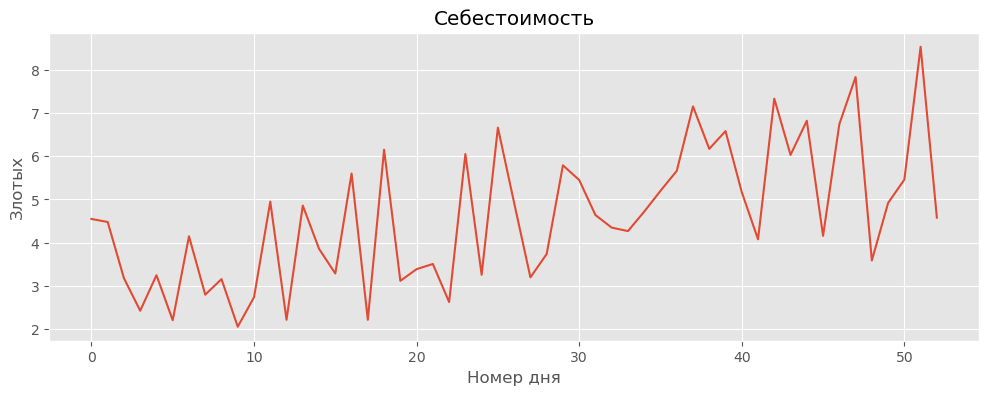

In [527]:
fig = plt.figure(figsize=(12, 4))
data_cost_4_0['cost'].plot()
plt.xlabel(u'Номер дня')
plt.ylabel(u'Злотых')
plt.title(u'Себестоимость')
# ряд менятся после 33 наблюдения

In [64]:
# обрежим эти данные для лучшего прогноза
data_cost_2_2 = data_cost_2_2[30:]
data_cost_4_0 = data_cost_4_0[33:]
data_cost_4_2 = data_cost_4_2[47:]

In [68]:
fit_cost_0_0 = ExponentialSmoothing(np.asarray(data_cost_0_0['cost']), seasonal_periods=24, 
                                    seasonal='multiplicative', trend='additive', damped_trend=True).fit()
fittedcost0_0_ = fit_cost_0_0.predict(0, len(data_cost_0_0['cost'])+horizont_0-1)

fit_cost_0_1 = ExponentialSmoothing(np.asarray(data_cost_0_1['cost']), seasonal_periods=17, 
                                    seasonal='multiplicative', trend='additive', damped_trend=True).fit()
fittedcost0_1_ = fit_cost_0_1.predict(0, len(data_cost_0_1['cost'])+horizont_1-1)

fit_cost_0_2 = ExponentialSmoothing(np.asarray(data_cost_0_2['cost']), seasonal_periods=17, 
                                    seasonal='multiplicative', trend='additive', damped_trend=True).fit()
fittedcost0_2_ = fit_cost_0_2.predict(0, len(data_cost_0_2['cost'])+horizont_2-1)


fit_cost_1_0 = ExponentialSmoothing(np.asarray(data_cost_1_0['cost']), seasonal_periods=11, 
                                    seasonal='additive', trend='additive', damped_trend=True).fit()
fittedcost1_0_ = fit_cost_1_0.predict(0, len(data_cost_1_0['cost'])+horizont_0-1)

fit_cost_1_1 = ExponentialSmoothing(np.asarray(data_cost_1_1['cost']), seasonal_periods=21, 
                                    seasonal='multiplicative', trend='additive', damped_trend=True).fit()
fittedcost1_1_ = fit_cost_1_1.predict(0, len(data_cost_1_1['cost'])+horizont_1-1)

fit_cost_1_2 = ExponentialSmoothing(np.asarray(data_cost_1_2['cost']), seasonal_periods=20, 
                                    seasonal='multiplicative', trend='additive', damped_trend=True).fit()
fittedcost1_2_ = fit_cost_1_2.predict(0, len(data_cost_1_2['cost'])+horizont_2-1)


fit_cost_2_0 = ExponentialSmoothing(np.asarray(data_cost_2_0['cost']), seasonal_periods=15, 
                                    seasonal='multiplicative', trend='additive', damped_trend=True).fit()
fittedcost2_0_ = fit_cost_2_0.predict(0, len(data_cost_2_0['cost'])+horizont_0-1)

fit_cost_2_1 = ExponentialSmoothing(np.asarray(data_cost_2_1['cost']), seasonal_periods=20, 
                                    seasonal='multiplicative', trend='additive', damped_trend=True).fit()
fittedcost2_1_ = fit_cost_2_1.predict(0, len(data_cost_2_1['cost'])+horizont_1-1)

fit_cost_2_2 = ExponentialSmoothing(np.asarray(data_cost_2_2['cost']), seasonal_periods=17, 
                                    seasonal='multiplicative', trend='additive', damped_trend=True).fit()
fittedcost2_2_ = fit_cost_2_2.predict(0, len(data_cost_2_2['cost'])+horizont_2-1)


fit_cost_3_0 = ExponentialSmoothing(np.asarray(data_cost_3_0['cost']), seasonal_periods=11, 
                                    seasonal='multiplicative', trend='additive', damped_trend=True).fit()
fittedcost3_0_ = fit_cost_3_0.predict(0, len(data_cost_3_0['cost'])+horizont_0-1)

fit_cost_3_1 = ExponentialSmoothing(np.asarray(data_cost_3_1['cost']), seasonal_periods=26, 
                                    seasonal='multiplicative', trend='additive', damped_trend=True).fit()
fittedcost3_1_ = fit_cost_3_1.predict(0, len(data_cost_3_1['cost'])+horizont_1-1)

fit_cost_3_2 = ExponentialSmoothing(np.asarray(data_cost_3_2['cost']), seasonal_periods=22, 
                                    seasonal='multiplicative', trend='additive', damped_trend=True).fit()
fittedcost3_2_ = fit_cost_3_2.predict(0, len(data_cost_3_2['cost'])+horizont_2-1)


fit_cost_4_0 = ExponentialSmoothing(np.asarray(data_cost_4_0['cost']), seasonal_periods=7, 
                                    seasonal='multiplicative', trend='additive', damped_trend=True).fit()
fittedcost4_0_ = fit_cost_4_0.predict(0, len(data_cost_4_0['cost'])+horizont_0-1)

fit_cost_4_1 = ExponentialSmoothing(np.asarray(data_cost_4_1['cost']), seasonal_periods=36, 
                                    seasonal='additive', trend=None).fit()
fittedcost4_1_ = fit_cost_4_1.predict(0, len(data_cost_4_1['cost'])+horizont_1-1)

fit_cost_4_2 = ExponentialSmoothing(np.asarray(data_cost_4_2['cost']), seasonal_periods=13, 
                                    seasonal='additive', trend='additive', damped_trend=True).fit()
fittedcost4_2_ = fit_cost_4_2.predict(0, len(data_cost_4_2['cost'])+horizont_2-1)

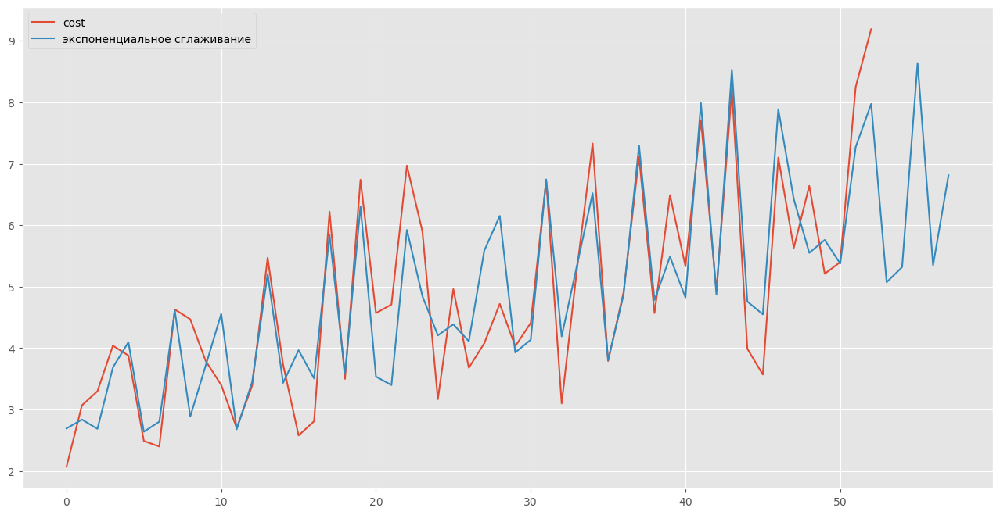

In [584]:
plt.figure(figsize=(16,8))
plt.plot(np.asarray(data_cost_0_0['cost']), label='cost')
plt.plot(fittedcost0_0_, label='экспоненциальное сглаживание')
plt.legend(loc='best')
plt.show()

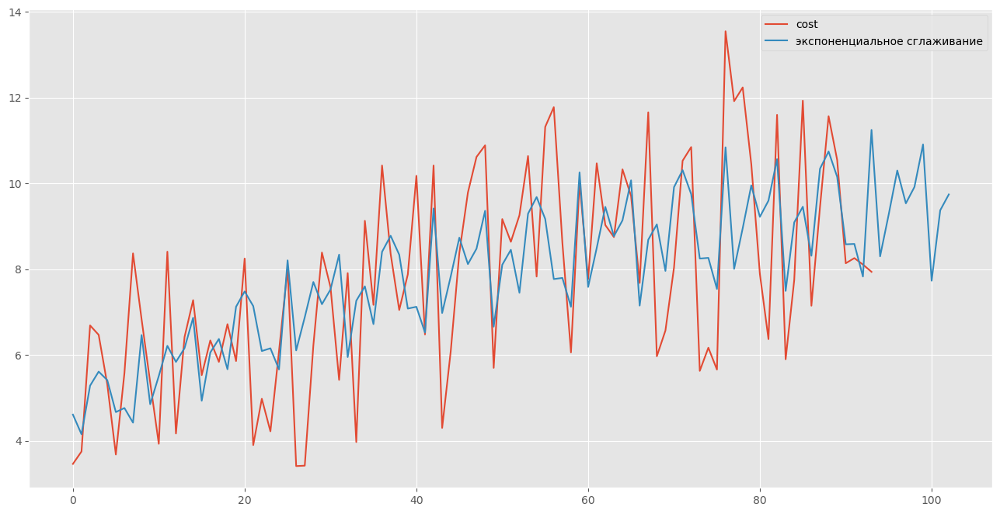

In [585]:
plt.figure(figsize=(16,8))
plt.plot(np.asarray(data_cost_0_1['cost']), label='cost')
plt.plot(fittedcost0_1_, label='экспоненциальное сглаживание')
plt.legend(loc='best')
plt.show()

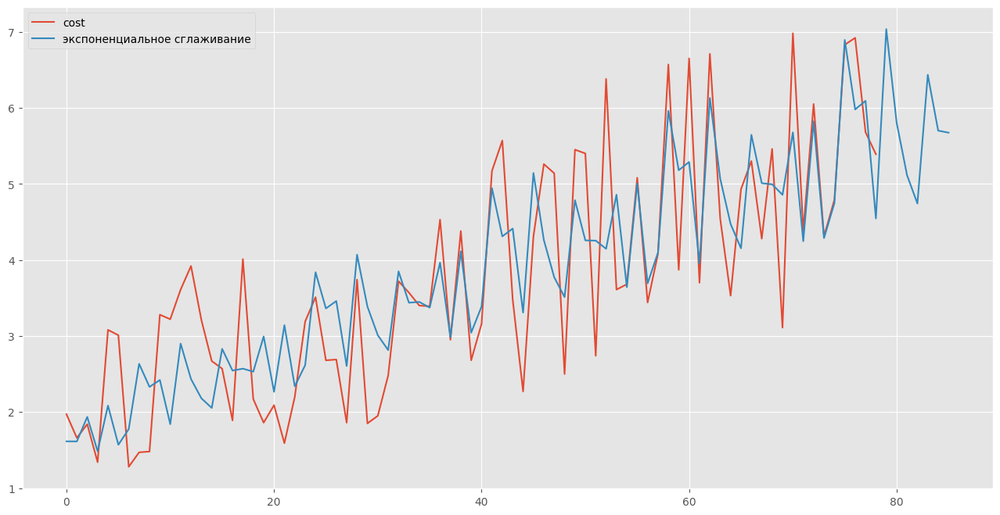

In [69]:
plt.figure(figsize=(16,8))
plt.plot(np.asarray(data_cost_0_2['cost']), label='cost')
plt.plot(fittedcost0_2_, label='экспоненциальное сглаживание')
plt.legend(loc='best')
plt.show()

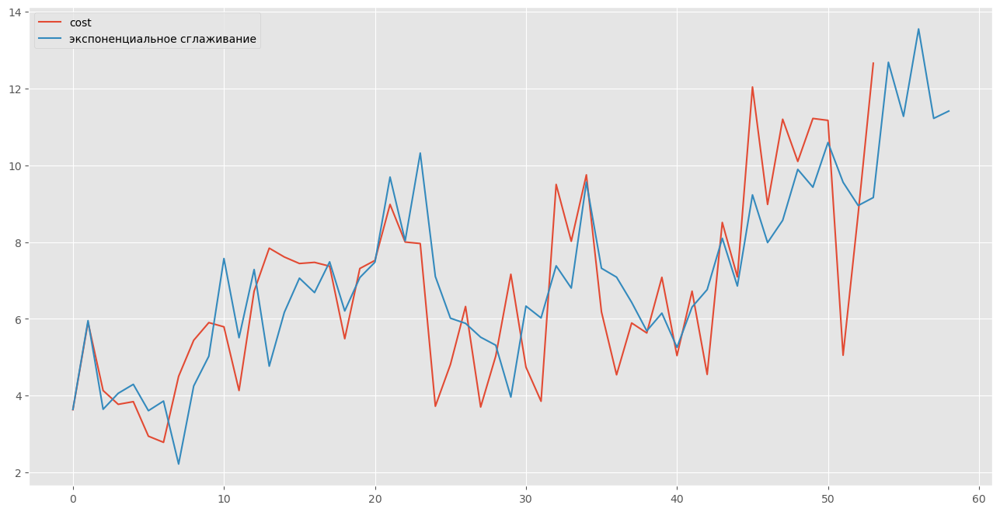

In [587]:
plt.figure(figsize=(16,8))
plt.plot(np.asarray(data_cost_1_0['cost']), label='cost')
plt.plot(fittedcost1_0_, label='экспоненциальное сглаживание')
plt.legend(loc='best')
plt.show()

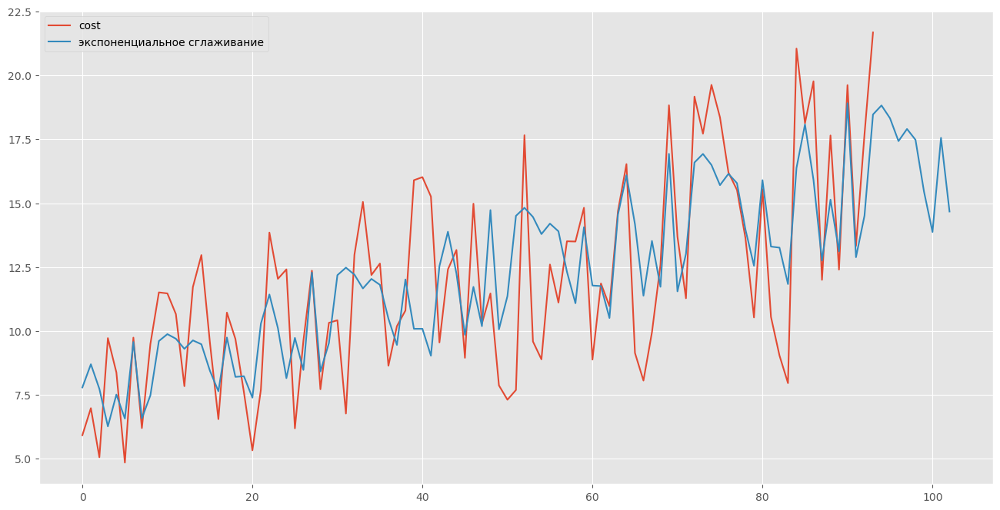

In [588]:
plt.figure(figsize=(16,8))
plt.plot(np.asarray(data_cost_1_1['cost']), label='cost')
plt.plot(fittedcost1_1_, label='экспоненциальное сглаживание')
plt.legend(loc='best')
plt.show()

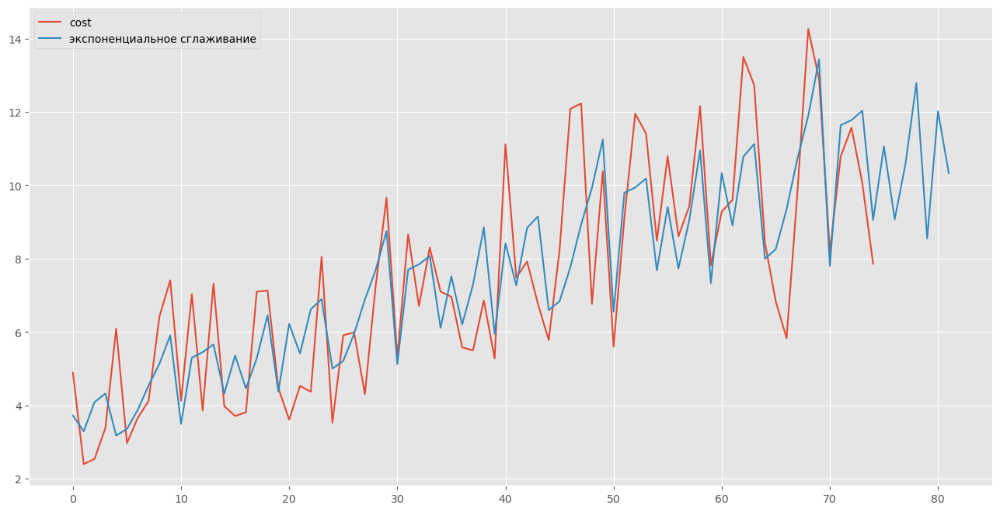

In [589]:
plt.figure(figsize=(16,8))
plt.plot(np.asarray(data_cost_1_2['cost']), label='cost')
plt.plot(fittedcost1_2_, label='экспоненциальное сглаживание')
plt.legend(loc='best')
plt.show()

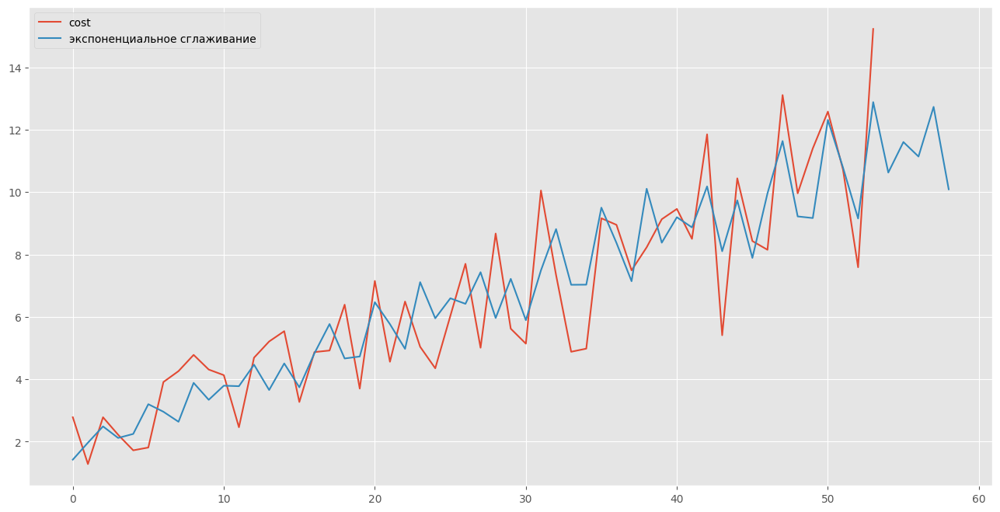

In [70]:
plt.figure(figsize=(16,8))
plt.plot(np.asarray(data_cost_2_0['cost']), label='cost')
plt.plot(fittedcost2_0_, label='экспоненциальное сглаживание')
plt.legend(loc='best')
plt.show()

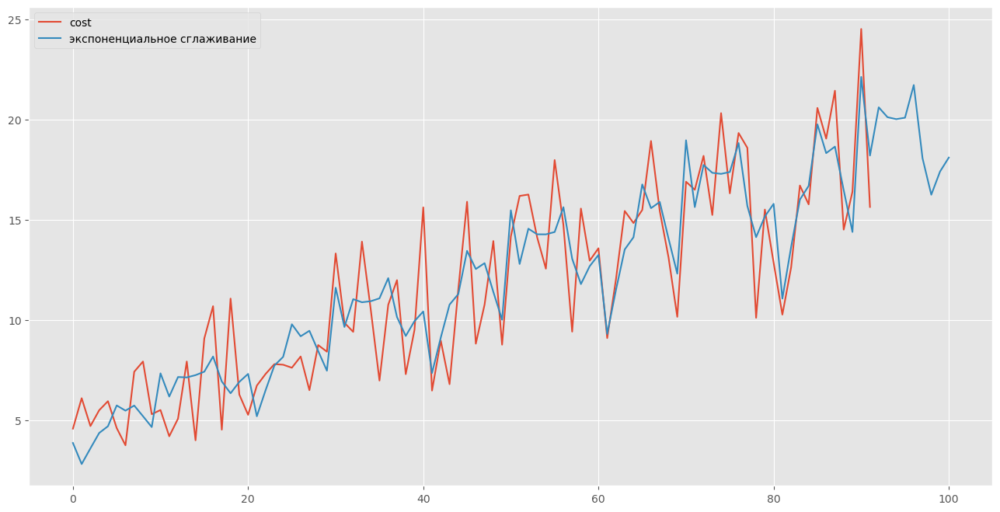

In [591]:
plt.figure(figsize=(16,8))
plt.plot(np.asarray(data_cost_2_1['cost']), label='cost')
plt.plot(fittedcost2_1_, label='экспоненциальное сглаживание')
plt.legend(loc='best')
plt.show()

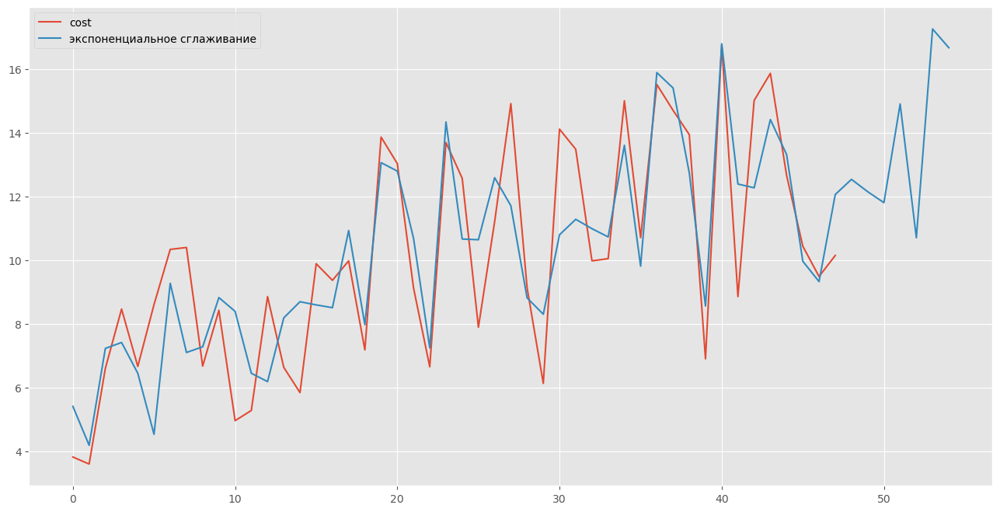

In [592]:
plt.figure(figsize=(16,8))
plt.plot(np.asarray(data_cost_2_2['cost']), label='cost')
plt.plot(fittedcost2_2_, label='экспоненциальное сглаживание')
plt.legend(loc='best')
plt.show()

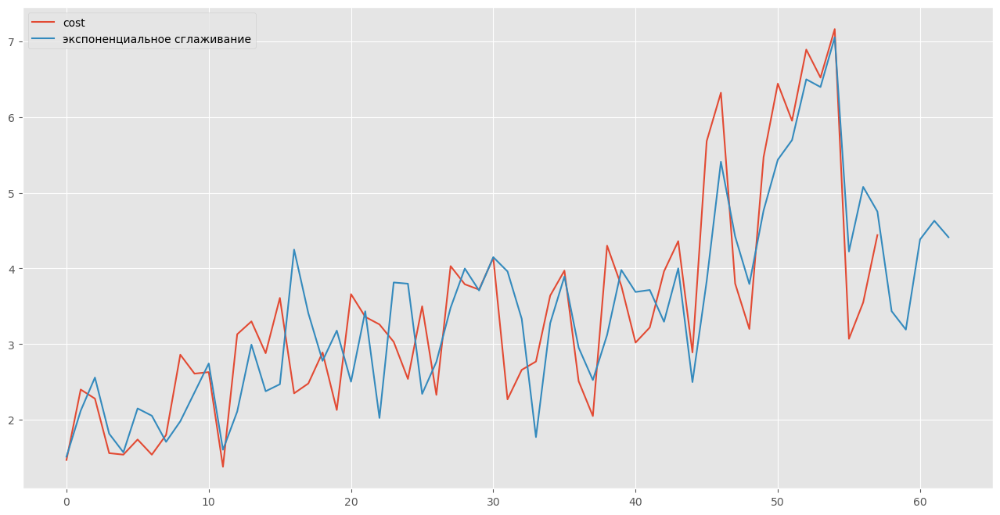

In [593]:
plt.figure(figsize=(16,8))
plt.plot(np.asarray(data_cost_3_0['cost']), label='cost')
plt.plot(fittedcost3_0_, label='экспоненциальное сглаживание')
plt.legend(loc='best')
plt.show()

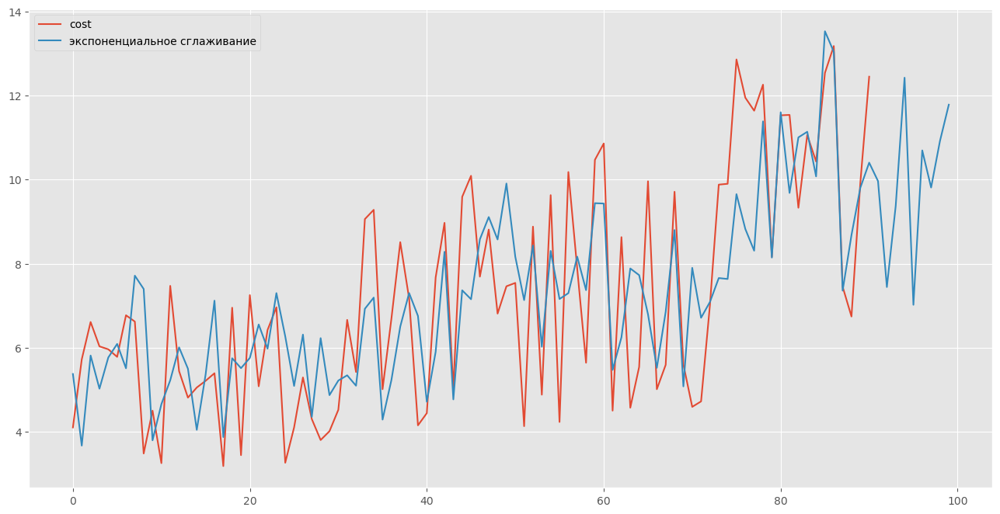

In [594]:
plt.figure(figsize=(16,8))
plt.plot(np.asarray(data_cost_3_1['cost']), label='cost')
plt.plot(fittedcost3_1_, label='экспоненциальное сглаживание')
plt.legend(loc='best')
plt.show()

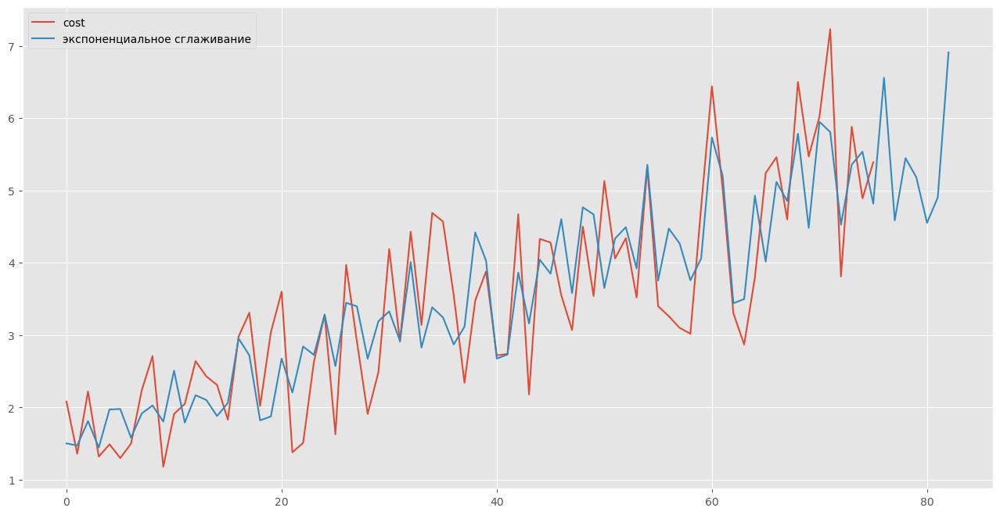

In [595]:
plt.figure(figsize=(16,8))
plt.plot(np.asarray(data_cost_3_2['cost']), label='cost')
plt.plot(fittedcost3_2_, label='экспоненциальное сглаживание')
plt.legend(loc='best')
plt.show()

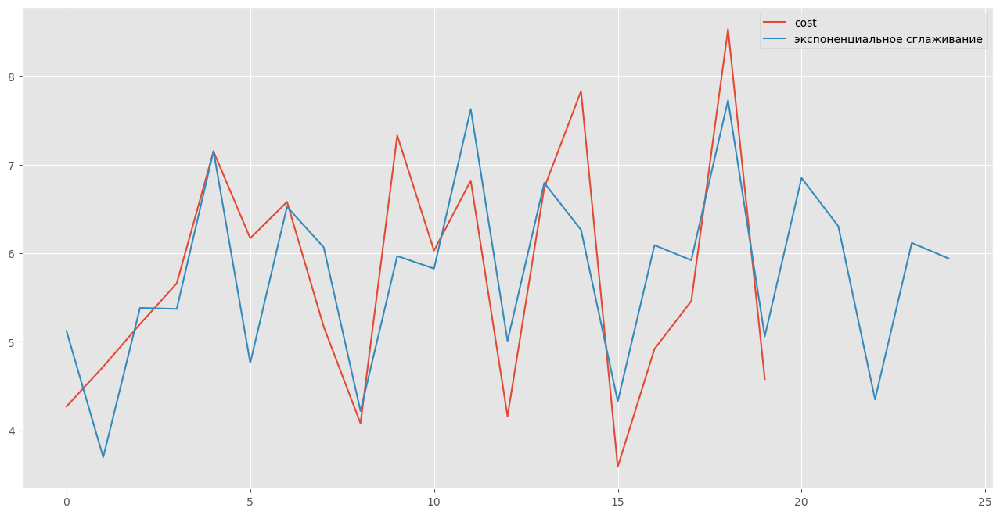

In [596]:
plt.figure(figsize=(16,8))
plt.plot(np.asarray(data_cost_4_0['cost']), label='cost')
plt.plot(fittedcost4_0_, label='экспоненциальное сглаживание')
plt.legend(loc='best')
plt.show()

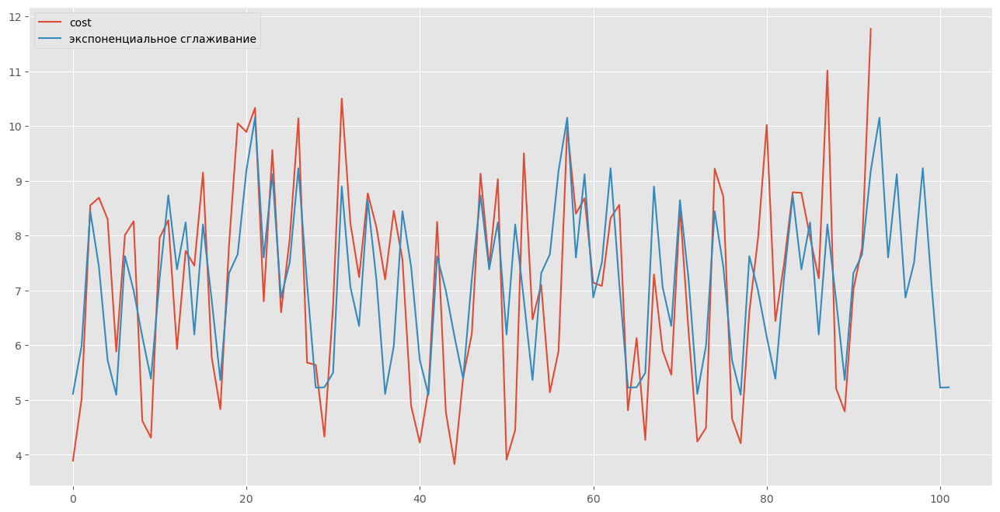

In [597]:
plt.figure(figsize=(16,8))
plt.plot(np.asarray(data_cost_4_1['cost']), label='cost')
plt.plot(fittedcost4_1_, label='экспоненциальное сглаживание')
plt.legend(loc='best')
plt.show()

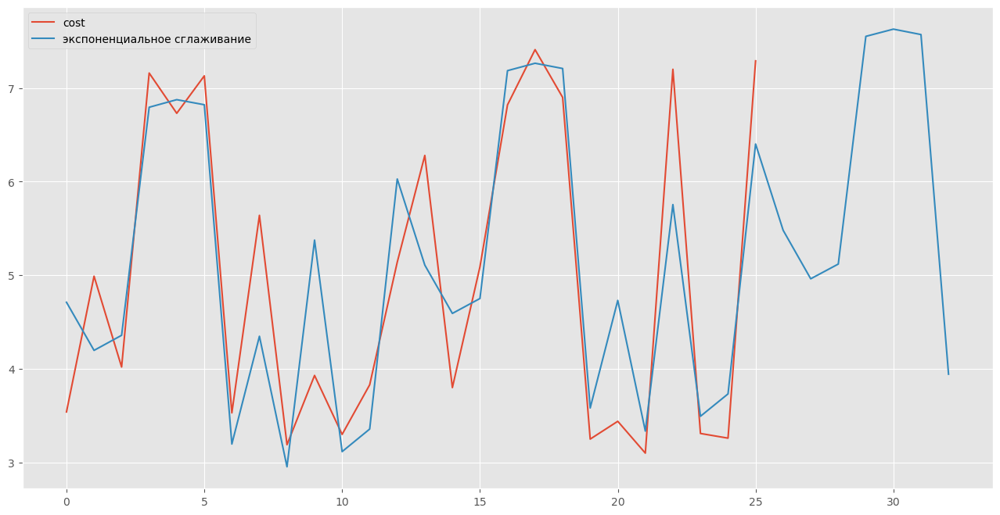

In [598]:
plt.figure(figsize=(16,8))
plt.plot(np.asarray(data_cost_4_2['cost']), label='cost')
plt.plot(fittedcost4_2_, label='экспоненциальное сглаживание')
plt.legend(loc='best')
plt.show()

У нас получились достаточно неплохие, для такой несложной модели, прогнозы

In [71]:
predict_cost_expon_1_1 = fittedcost0_0_[len(fittedcost0_0_)-horizont_0:]
predict_cost_expon_2_1 = fittedcost1_0_[len(fittedcost1_0_)-horizont_0:]
predict_cost_expon_3_1 = fittedcost2_0_[len(fittedcost2_0_)-horizont_0:]
predict_cost_expon_4_1 = fittedcost3_0_[len(fittedcost3_0_)-horizont_0:]
predict_cost_expon_5_1 = fittedcost4_0_[len(fittedcost4_0_)-horizont_0:]

predict_cost_expon_1_2 = fittedcost0_1_[len(fittedcost0_1_)-horizont_1:]
predict_cost_expon_2_2 = fittedcost1_1_[len(fittedcost1_1_)-horizont_1:]
predict_cost_expon_3_2 = fittedcost2_1_[len(fittedcost2_1_)-horizont_1:]
predict_cost_expon_4_2 = fittedcost3_1_[len(fittedcost3_1_)-horizont_1:]
predict_cost_expon_5_2 = fittedcost4_1_[len(fittedcost4_1_)-horizont_1:]

predict_cost_expon_1_3 = fittedcost0_2_[len(fittedcost0_2_)-horizont_2:]
predict_cost_expon_2_3 = fittedcost1_2_[len(fittedcost1_2_)-horizont_2:]
predict_cost_expon_3_3 = fittedcost2_2_[len(fittedcost2_2_)-horizont_2:]
predict_cost_expon_4_3 = fittedcost3_2_[len(fittedcost3_2_)-horizont_2:]
predict_cost_expon_5_3 = fittedcost4_2_[len(fittedcost4_2_)-horizont_2:]

### 2 Прогнозирование цен у конкурентов

In [72]:
# нам интересна максимальная цена у конкурентов, 
# так как не желаьельно иметь цену выше максимально у конкурентов 
# так же нам не важно кто из конкурентов какую цену ставит, 
# поэтому сгрупируем все данные по месту, продукту и дате и сагрегируем по максимуму
# (чтобы на всякий случай отсечь выбросы сверху буду брать не максимум, а близкую к нему 98 процентиль, чтобы избежать нежелательных выбросов)
df_competitors.head()

,place,product,competitor,price,date
0,0,0,Арториас&Co,3.78,2216-01-04
1,0,0,Арториас&Co,3.78,2216-01-05
2,0,0,Арториас&Co,3.78,2216-01-06
3,0,0,Арториас&Co,3.78,2216-01-09
5,0,0,Арториас&Co,3.78,2216-01-11


In [73]:
# удалим столбец компетитор
df_competitors.drop('competitor', axis=1, inplace=True)

In [74]:
df_competitors_grouped = df_competitors.groupby(['place', 'product', 'date']).apply(lambda x: np.percentile(x, 98))
df_competitors_grouped = df_competitors_grouped.to_frame('price').reset_index()

In [75]:
df_competitors_grouped.head()

,place,product,date,price
0,0,0,2216-01-02,4.2100
1,0,0,2216-01-03,4.2088
2,0,0,2216-01-04,4.1720
3,0,0,2216-01-05,4.1640
4,0,0,2216-01-06,4.2082


In [76]:
data_competitors_0_0 = df_competitors_grouped[(df_competitors_grouped['place'] == 0) & (df_competitors_grouped['product'] == 0)]['price']
data_competitors_0_0.reset_index(drop=True, inplace=True)

Text(0.5, 1.0, 'Цены конкурентов')

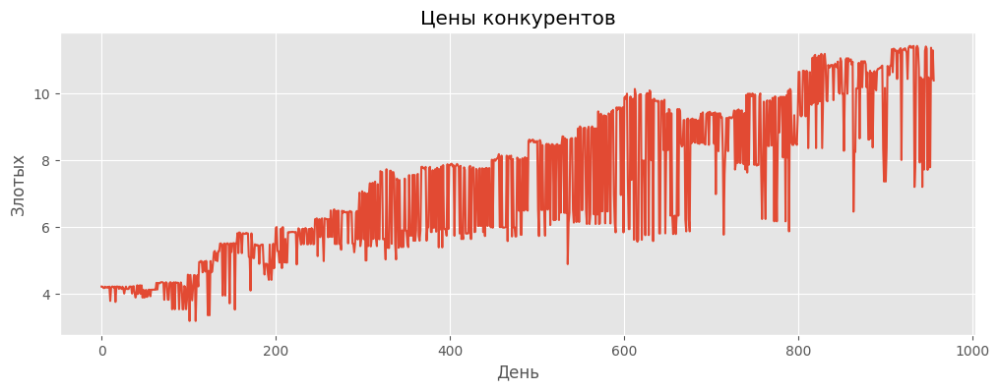

In [77]:
fig = plt.figure(figsize=(12, 4))
data_competitors_0_0.plot()
plt.xlabel(u'День')
plt.ylabel(u'Злотых')
plt.title(u'Цены конкурентов')

1. У временного ряда восходящий тренд
2. У временного ряда мультипликативная сезонность
3. Ряд меняет свой характер (сначла около 100 наблюдения, затем около 300 и около 700)
4. У ряда нет выбросов
5. У ряда нет пропусков

Text(0.5, 1.0, 'Цены конкурентов')

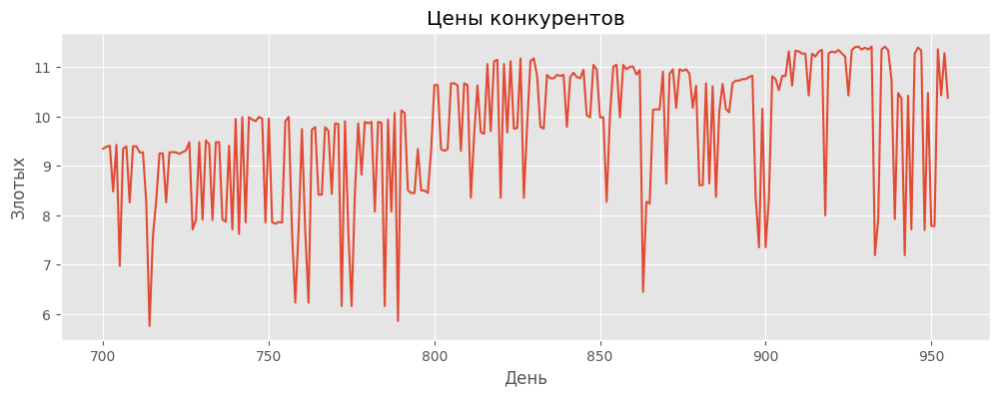

In [78]:
fig = plt.figure(figsize=(12, 4))
data_competitors_0_0[700:].plot()
plt.xlabel(u'День')
plt.ylabel(u'Злотых')
plt.title(u'Цены конкурентов')
# возьмем только последний кусок, который наиболее актуален для нас, так как ряд менял свое поведение раньше
# на этом участке нет тренда

In [79]:
# я, не до конца понима выбросы ли эти пики в низ или нет, потому что их много
# попробую построить модель без предворительной чистки
data_competitors_0_0 = data_competitors_0_0[700:]
fit_competitors_0_0 = ExponentialSmoothing(np.asarray(data_competitors_0_0), seasonal_periods=100, 
                                           seasonal='additive', trend='additive', damped_trend=True).fit()
fitted_competitors_0_0_ = fit_competitors_0_0.predict(0, len(data_competitors_0_0)+90-1)

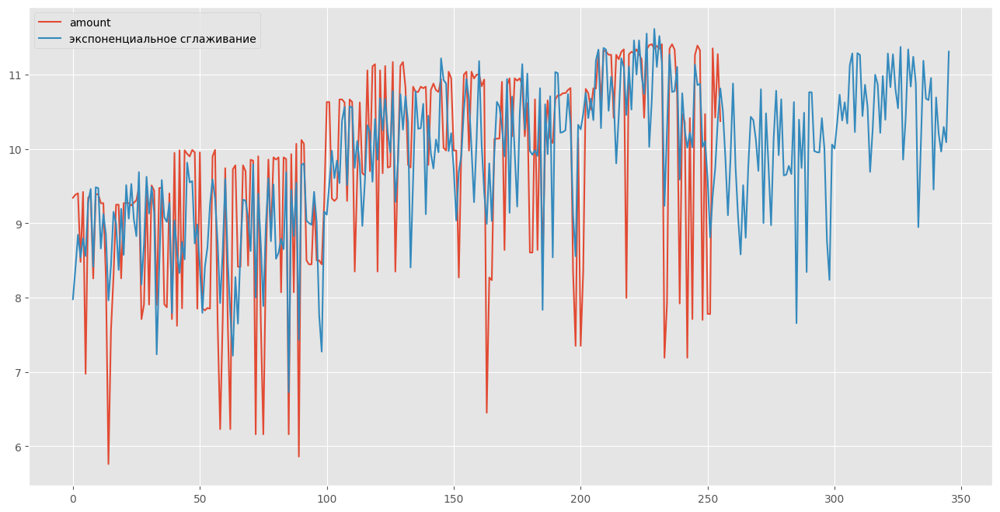

In [80]:
plt.figure(figsize=(16,8))
plt.plot(np.asarray(data_competitors_0_0), label='amount')
plt.plot(fitted_competitors_0_0_, label='экспоненциальное сглаживание')
plt.legend(loc='best')
plt.show()
# получили вполне неплохую модель, которая хорошо описывает данные

Text(0.5, 1.0, 'Цены конкурентов')

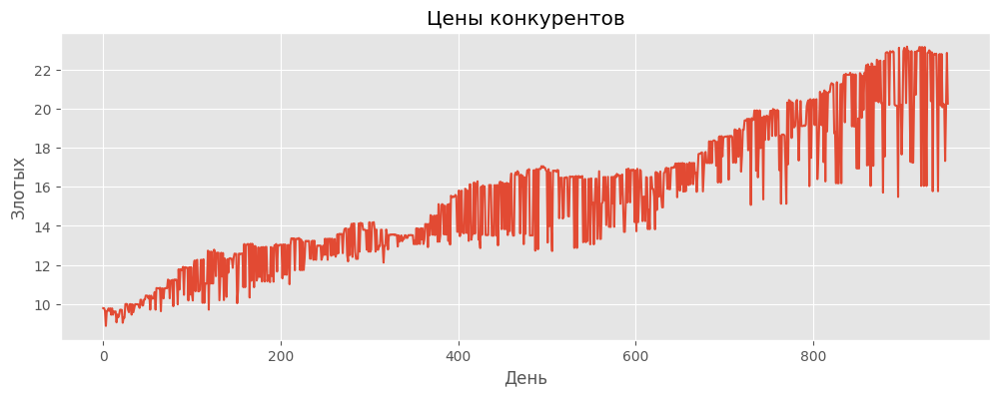

In [81]:
data_competitors_0_1 = df_competitors_grouped[(df_competitors_grouped['place'] == 0) & (df_competitors_grouped['product'] == 1)]['price']
data_competitors_0_1.reset_index(drop=True, inplace=True)

fig = plt.figure(figsize=(12, 4))
data_competitors_0_1.plot()
plt.xlabel(u'День')
plt.ylabel(u'Злотых')
plt.title(u'Цены конкурентов')

1. У временного ряда восходящий тренд
2. У временного ряда мультипликативная сезонность
3. Ряд меняет свой характер (сначла около 350 наблюдения, затем около 650)
4. У ряда нет выбросов
5. У ряда нет пропусков

Text(0.5, 1.0, 'Цены конкурентов')

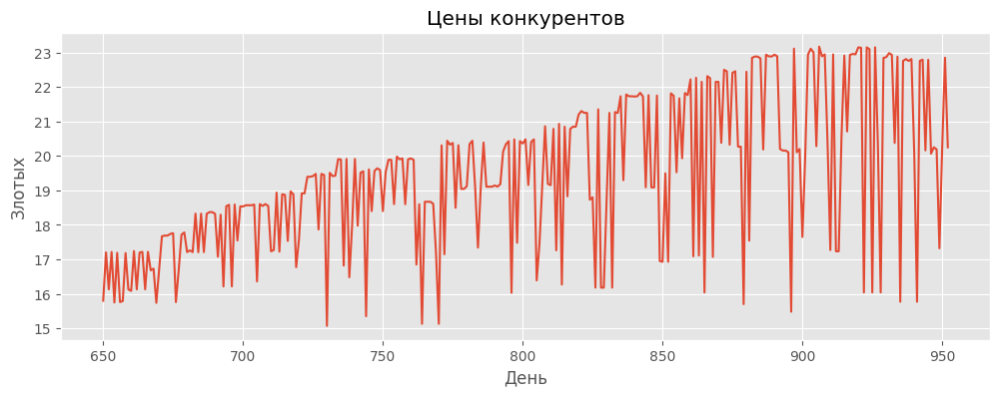

In [82]:
data_competitors_0_1 = data_competitors_0_1[650:]

fig = plt.figure(figsize=(12, 4))
data_competitors_0_1.plot()
plt.xlabel(u'День')
plt.ylabel(u'Злотых')
plt.title(u'Цены конкурентов')
# возьмем только последний кусок, который наиболее актуален для нас, так как ряд менял свое поведение раньше
# на этом участке нет тренда

In [83]:
fit_competitors_0_1 = ExponentialSmoothing(np.asarray(data_competitors_0_1), seasonal_periods=120, 
                                           seasonal='multiplicative', trend='additive', damped_trend=True).fit()
fitted_competitors_0_1_ = fit_competitors_0_1.predict(0, len(data_competitors_0_1)+90-1)

D:\anaconda3\envs\cuda\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


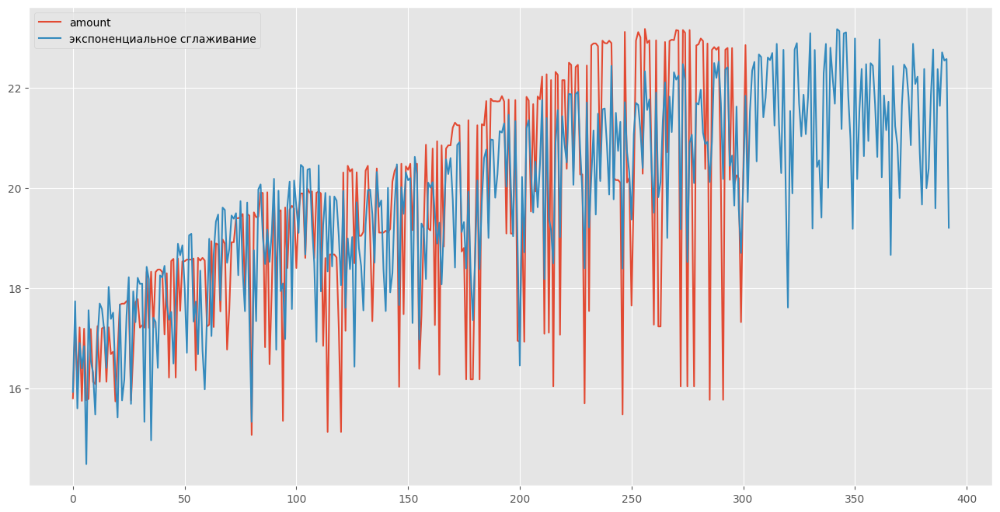

In [84]:
plt.figure(figsize=(16,8))
plt.plot(np.asarray(data_competitors_0_1), label='amount')
plt.plot(fitted_competitors_0_1_, label='экспоненциальное сглаживание')
plt.legend(loc='best')
plt.show()
# получили вполне неплохую модель, которая хорошо описывает данные

Text(0.5, 1.0, 'Цены конкурентов')

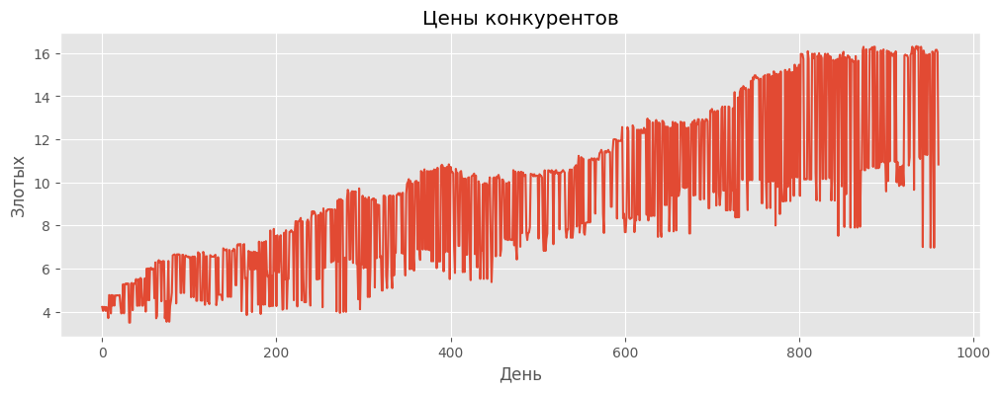

In [85]:
data_competitors_0_2 = df_competitors_grouped[(df_competitors_grouped['place'] == 0) & (df_competitors_grouped['product'] == 2)]['price']
data_competitors_0_2.reset_index(drop=True, inplace=True)

fig = plt.figure(figsize=(12, 4))
data_competitors_0_2.plot()
plt.xlabel(u'День')
plt.ylabel(u'Злотых')
plt.title(u'Цены конкурентов')

1. У временного ряда восходящий тренд
2. У временного ряда мультипликативная сезонность
3. Ряд не меняет свой характер
4. У ряда нет выбросов
5. У ряда нет пропусков

D:\anaconda3\envs\cuda\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


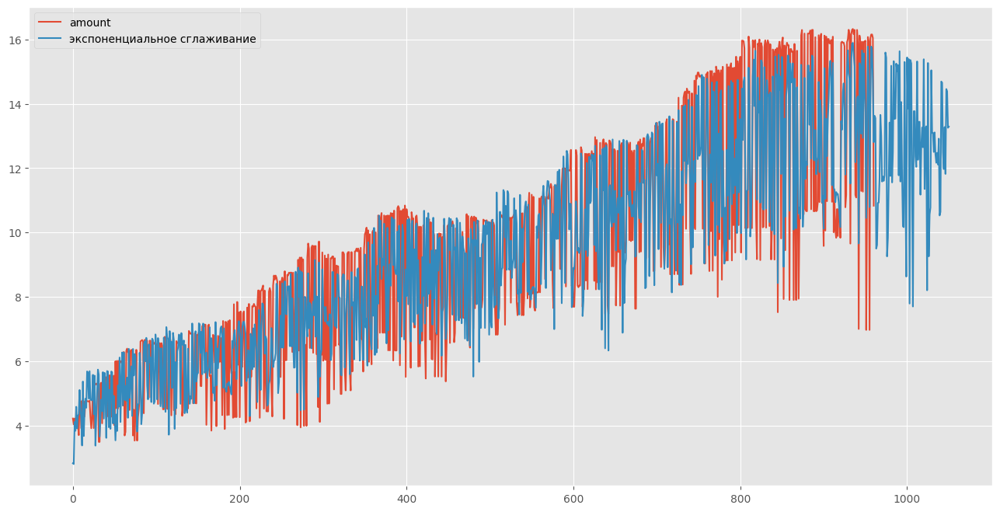

In [86]:
fit_competitors_0_2 = ExponentialSmoothing(np.asarray(data_competitors_0_2), seasonal_periods=365, 
                                           seasonal='multiplicative', trend='additive', damped_trend=True).fit()
fitted_competitors_0_2_ = fit_competitors_0_2.predict(0, len(data_competitors_0_2)+90-1)

plt.figure(figsize=(16,8))
plt.plot(np.asarray(data_competitors_0_2), label='amount')
plt.plot(fitted_competitors_0_2_, label='экспоненциальное сглаживание')
plt.legend(loc='best')
plt.show()

Text(0.5, 1.0, 'Цены конкурентов')

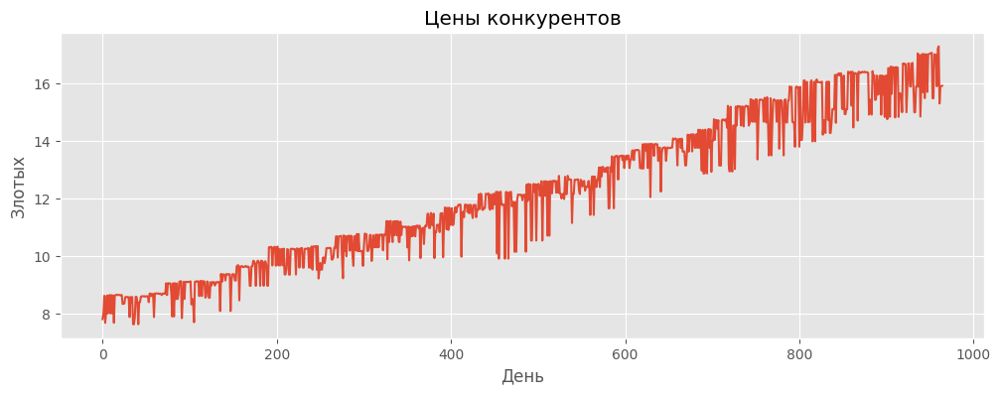

In [87]:
data_competitors_1_0 = df_competitors_grouped[(df_competitors_grouped['place'] == 1) & (df_competitors_grouped['product'] == 0)]['price']
data_competitors_1_0.reset_index(drop=True, inplace=True)

fig = plt.figure(figsize=(12, 4))
data_competitors_1_0.plot()
plt.xlabel(u'День')
plt.ylabel(u'Злотых')
plt.title(u'Цены конкурентов')

1. У временного ряда восходящий тренд
2. У временного ряда аддетивная сезонность
3. Ряд не меняет свой характер (около 450 дня увеличивается ширина временного ряда)
4. У ряда нет выбросов
5. У ряда нет пропусков

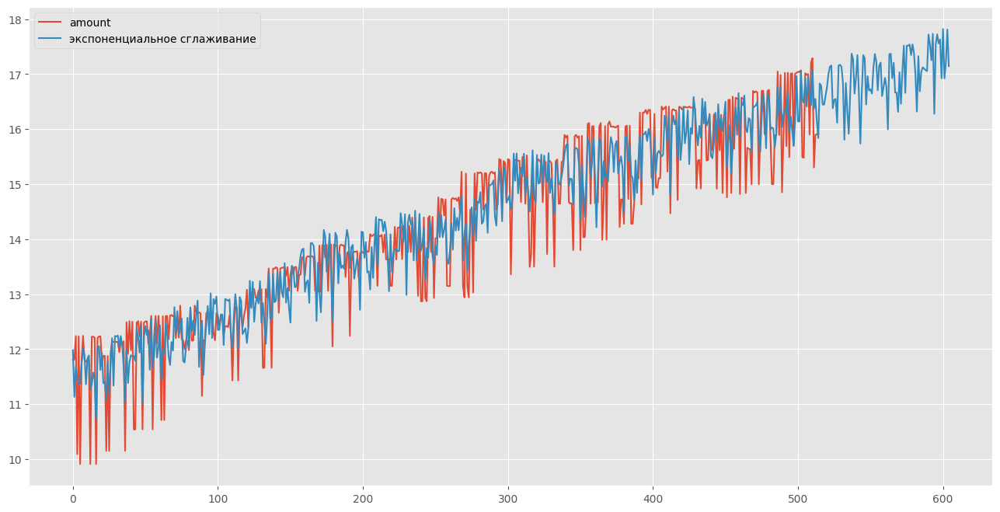

In [88]:
data_competitors_1_0 = data_competitors_1_0[450:]
fit_competitors_1_0 = ExponentialSmoothing(np.asarray(data_competitors_1_0), seasonal_periods=182, 
                                           seasonal='additive', trend='additive').fit()
fitted_competitors_1_0_ = fit_competitors_1_0.predict(0, len(data_competitors_1_0)+90-1)

plt.figure(figsize=(16,8))
plt.plot(np.asarray(data_competitors_1_0), label='amount')
plt.plot(fitted_competitors_1_0_, label='экспоненциальное сглаживание')
plt.legend(loc='best')
plt.show()

Text(0.5, 1.0, 'Цены конкурентов')

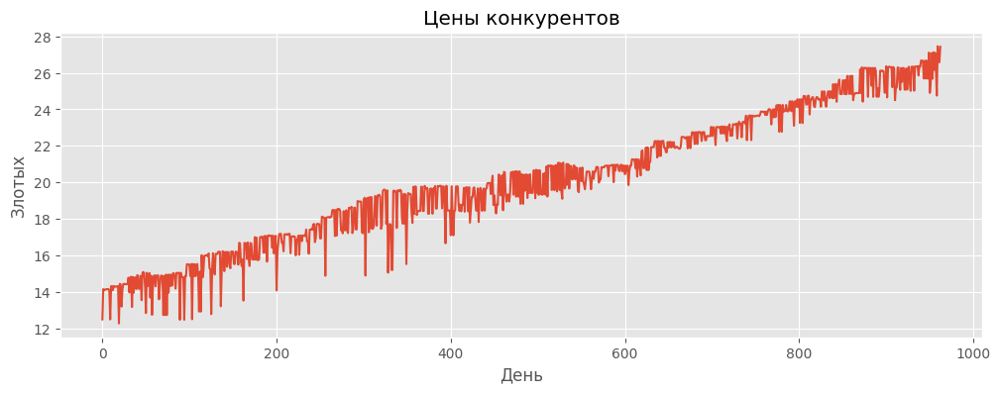

In [89]:
data_competitors_1_1 = df_competitors_grouped[(df_competitors_grouped['place'] == 1) & (df_competitors_grouped['product'] == 1)]['price']
data_competitors_1_1.reset_index(drop=True, inplace=True)

fig = plt.figure(figsize=(12, 4))
data_competitors_1_1.plot()
plt.xlabel(u'День')
plt.ylabel(u'Злотых')
plt.title(u'Цены конкурентов')

Ряд не меняет свой характер (около 880 наблюдения), поэтому рассмотрим этот участок


Text(0.5, 1.0, 'Цены конкурентов')

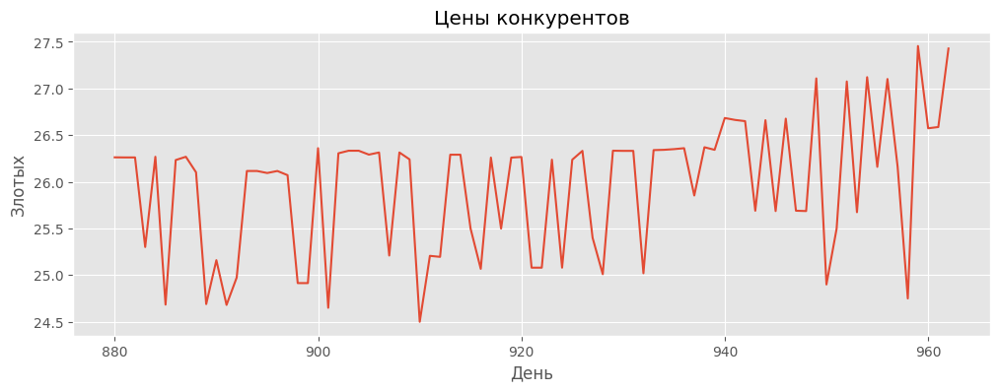

In [90]:
data_competitors_1_1 = df_competitors_grouped[(df_competitors_grouped['place'] == 1) & (df_competitors_grouped['product'] == 1)]['price']
data_competitors_1_1.reset_index(drop=True, inplace=True)

fig = plt.figure(figsize=(12, 4))
data_competitors_1_1[880:].plot()
plt.xlabel(u'День')
plt.ylabel(u'Злотых')
plt.title(u'Цены конкурентов')

1. У временного ряда боковой тренд
2. У временного ряда аддетивная сезонность
3. Ряд не меняет свой характер
4. У ряда нет выбросов
5. У ряда нет пропусков

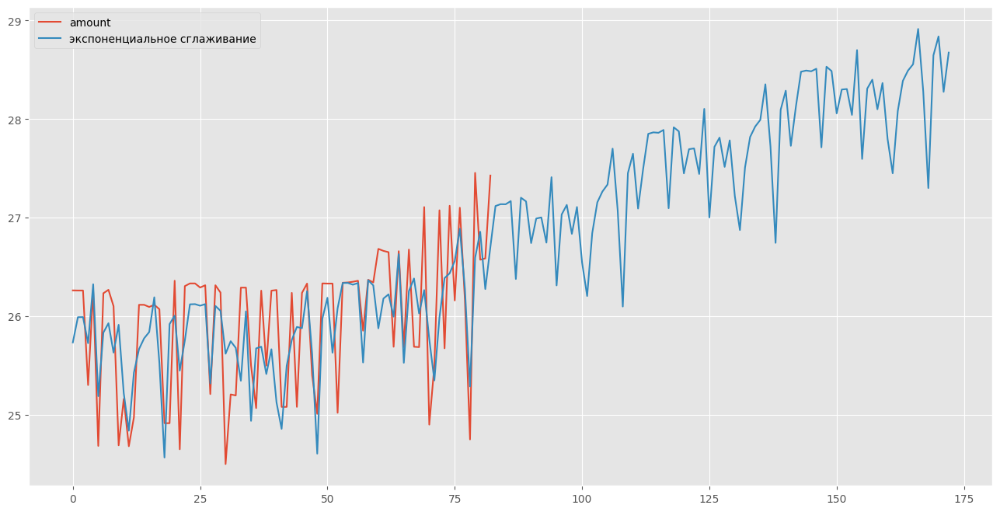

In [91]:
data_competitors_1_1 = data_competitors_1_1[880:]
fit_competitors_1_1 = ExponentialSmoothing(np.asarray(data_competitors_1_1), seasonal_periods=30, 
                                           seasonal='additive', trend='additive', damped_trend=True).fit()
fitted_competitors_1_1_ = fit_competitors_1_1.predict(0, len(data_competitors_1_1)+90-1)

plt.figure(figsize=(16,8))
plt.plot(np.asarray(data_competitors_1_1), label='amount')
plt.plot(fitted_competitors_1_1_, label='экспоненциальное сглаживание')
plt.legend(loc='best')
plt.show()

Text(0.5, 1.0, 'Цены конкурентов')

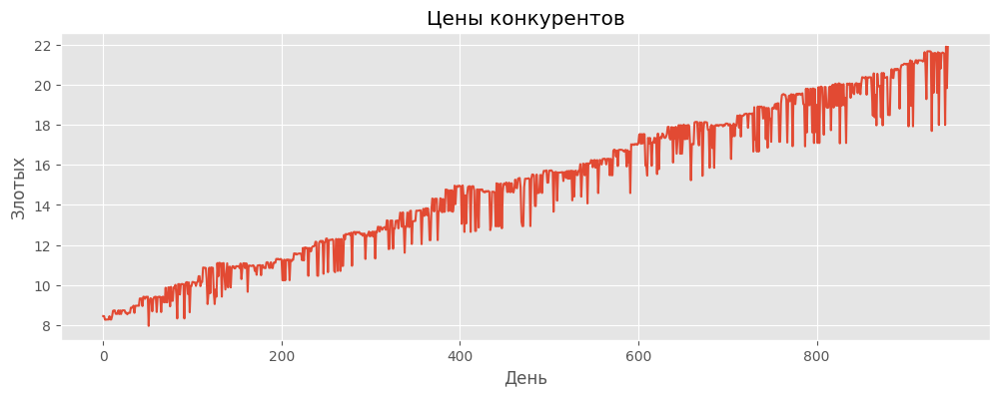

In [92]:
data_competitors_1_2 = df_competitors_grouped[(df_competitors_grouped['place'] == 1) & (df_competitors_grouped['product'] == 2)]['price']
data_competitors_1_2.reset_index(drop=True, inplace=True)

fig = plt.figure(figsize=(12, 4))
data_competitors_1_2.plot()
plt.xlabel(u'День')
plt.ylabel(u'Злотых')
plt.title(u'Цены конкурентов')

1. У временного ряда растущий тренд
2. У временного ряда мультипликативная сезонность
3. Ряд не меняет свой характер
4. У ряда нет выбросов
5. У ряда нет пропусков

D:\anaconda3\envs\cuda\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


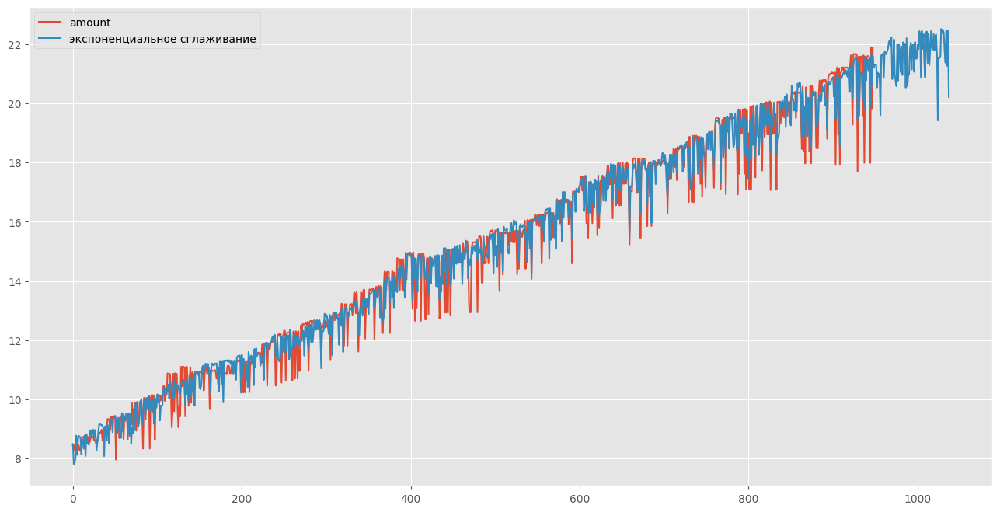

In [93]:
fit_competitors_1_2 = ExponentialSmoothing(np.asarray(data_competitors_1_2), seasonal_periods=365, 
                                           seasonal='multiplicative', trend='additive').fit()
fitted_competitors_1_2_ = fit_competitors_1_2.predict(0, len(data_competitors_1_2)+90-1)

plt.figure(figsize=(16,8))
plt.plot(np.asarray(data_competitors_1_2), label='amount')
plt.plot(fitted_competitors_1_2_, label='экспоненциальное сглаживание')
plt.legend(loc='best')
plt.show()

Text(0.5, 1.0, 'Цены конкурентов')

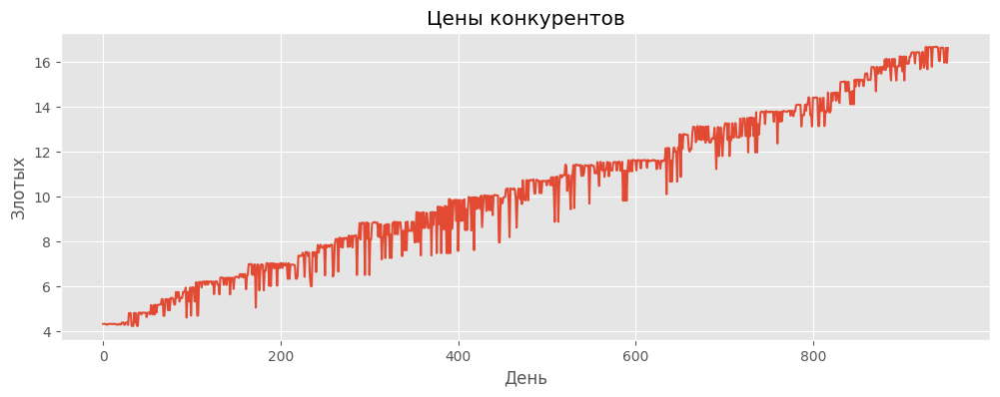

In [94]:
data_competitors_2_0 = df_competitors_grouped[(df_competitors_grouped['place'] == 2) & (df_competitors_grouped['product'] == 0)]['price']
data_competitors_2_0.reset_index(drop=True, inplace=True)

fig = plt.figure(figsize=(12, 4))
data_competitors_2_0.plot()
plt.xlabel(u'День')
plt.ylabel(u'Злотых')
plt.title(u'Цены конкурентов')

1. У временного ряда растущий тренд
2. У временного ряда аддетивная сезонность
3. Ряд меняет свой характер около 700 наблюдения
4. У ряда нет выбросов
5. У ряда нет пропусков

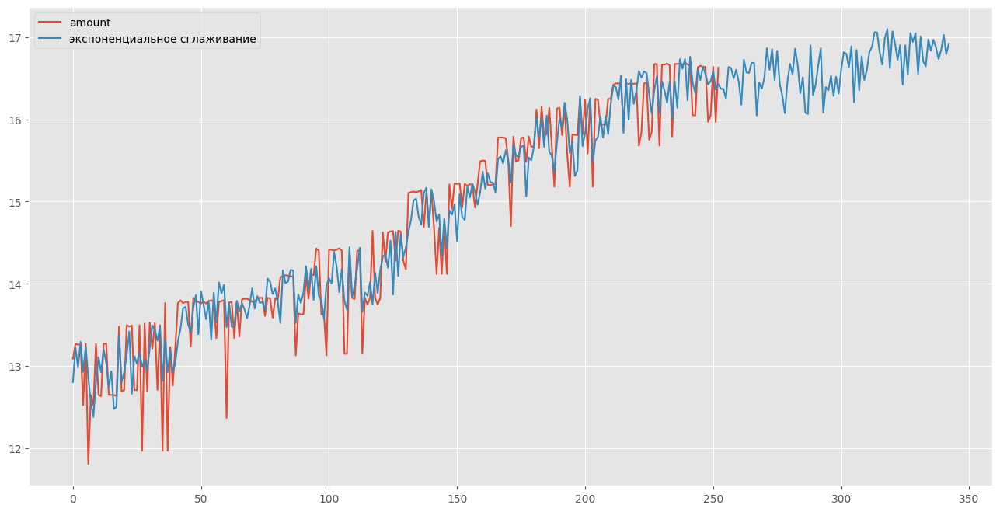

In [95]:
data_competitors_2_0 = data_competitors_2_0[700:]
fit_competitors_2_0 = ExponentialSmoothing(np.asarray(data_competitors_2_0), seasonal_periods=90, 
                                           seasonal='additive', trend='additive', damped_trend=True).fit()
fitted_competitors_2_0_ = fit_competitors_2_0.predict(0, len(data_competitors_2_0)+90-1)

plt.figure(figsize=(16,8))
plt.plot(np.asarray(data_competitors_2_0), label='amount')
plt.plot(fitted_competitors_2_0_, label='экспоненциальное сглаживание')
plt.legend(loc='best')
plt.show()

Text(0.5, 1.0, 'Цены конкурентов')

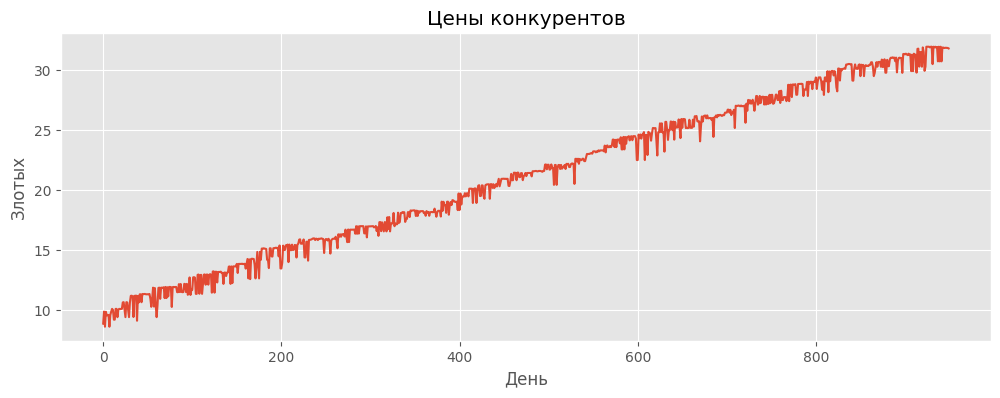

In [96]:
data_competitors_2_1 = df_competitors_grouped[(df_competitors_grouped['place'] == 2) & (df_competitors_grouped['product'] == 1)]['price']
data_competitors_2_1.reset_index(drop=True, inplace=True)

fig = plt.figure(figsize=(12, 4))
data_competitors_2_1.plot()
plt.xlabel(u'День')
plt.ylabel(u'Злотых')
plt.title(u'Цены конкурентов')

1. У временного ряда растущий тренд
2. У временного ряда аддетивная сезонность
3. Ряд не меняет свой характер
4. У ряда нет выбросов
5. У ряда нет пропусков

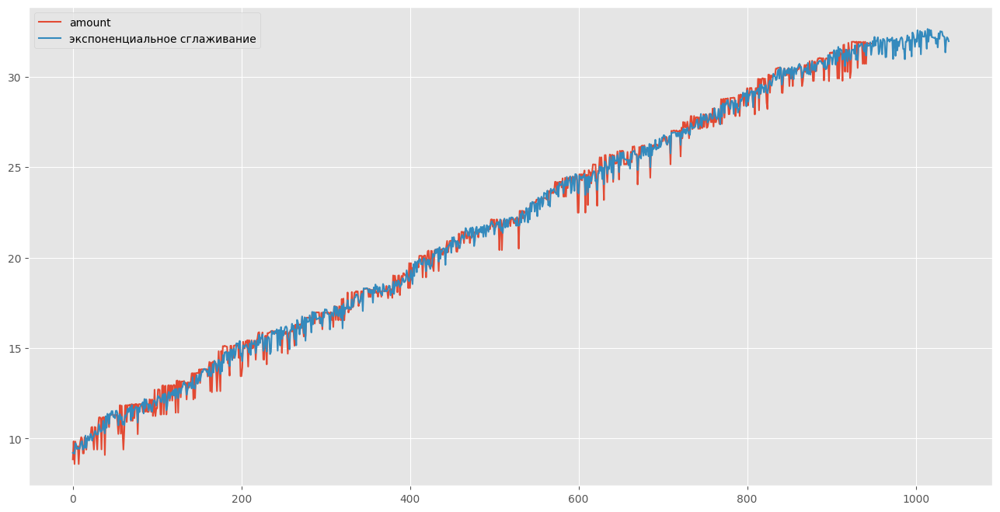

In [97]:
fit_competitors_2_1 = ExponentialSmoothing(np.asarray(data_competitors_2_1), seasonal_periods=365, 
                                           seasonal='additive', trend='additive', damped_trend=True).fit()
fitted_competitors_2_1_ = fit_competitors_2_1.predict(0, len(data_competitors_2_1)+90-1)

plt.figure(figsize=(16,8))
plt.plot(np.asarray(data_competitors_2_1), label='amount')
plt.plot(fitted_competitors_2_1_, label='экспоненциальное сглаживание')
plt.legend(loc='best')
plt.show()

Text(0.5, 1.0, 'Цены конкурентов')

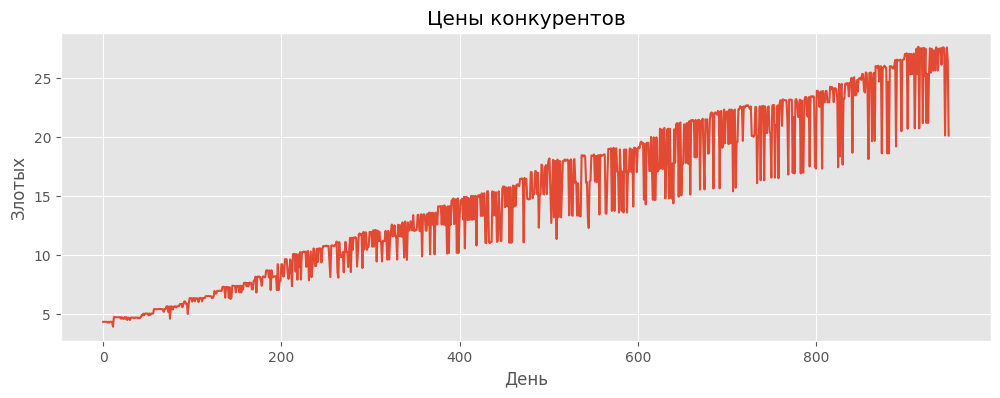

In [98]:
data_competitors_2_2 = df_competitors_grouped[(df_competitors_grouped['place'] == 2) & (df_competitors_grouped['product'] == 2)]['price']
data_competitors_2_2.reset_index(drop=True, inplace=True)

fig = plt.figure(figsize=(12, 4))
data_competitors_2_2.plot()
plt.xlabel(u'День')
plt.ylabel(u'Злотых')
plt.title(u'Цены конкурентов')

1. У временного ряда растущий тренд
2. У временного ряда мультипликативная сезонность
3. Ряд меняет свой характер около 200 наблюдения
4. У ряда нет выбросов
5. У ряда нет пропусков

D:\anaconda3\envs\cuda\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


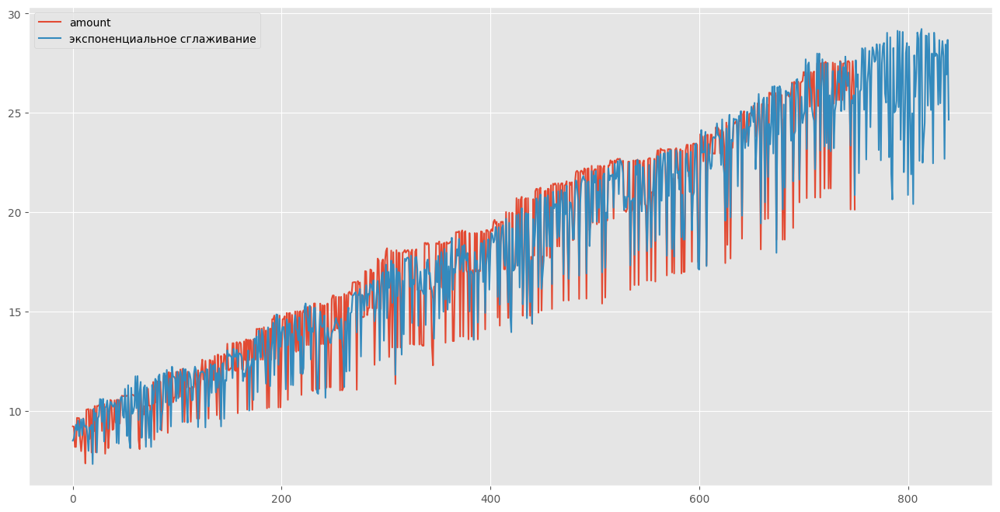

In [99]:
data_competitors_2_2 = data_competitors_2_2[200:]
fit_competitors_2_2 = ExponentialSmoothing(np.asarray(data_competitors_2_2), seasonal_periods=365, 
                                           seasonal='multiplicative', trend='additive', damped_trend=True).fit()
fitted_competitors_2_2_ = fit_competitors_2_2.predict(0, len(data_competitors_2_2)+90-1)

plt.figure(figsize=(16,8))
plt.plot(np.asarray(data_competitors_2_2), label='amount')
plt.plot(fitted_competitors_2_2_, label='экспоненциальное сглаживание')
plt.legend(loc='best')
plt.show()

Text(0.5, 1.0, 'Цены конкурентов')

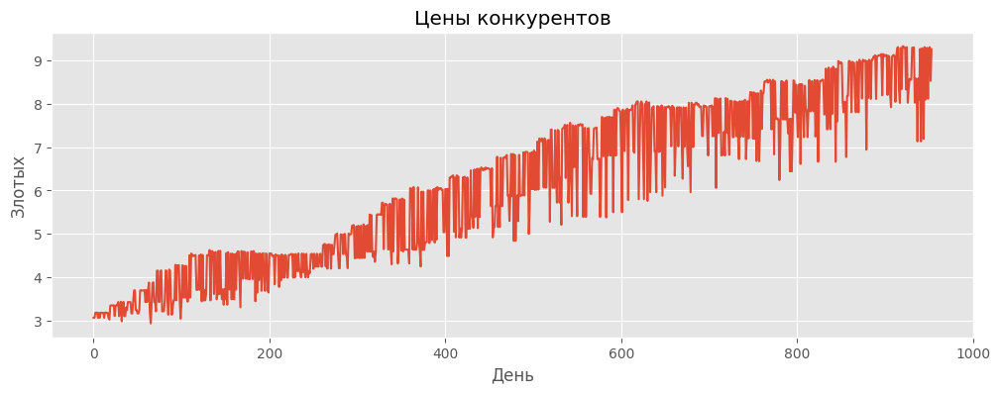

In [100]:
data_competitors_3_0 = df_competitors_grouped[(df_competitors_grouped['place'] == 3) & (df_competitors_grouped['product'] == 0)]['price']
data_competitors_3_0.reset_index(drop=True, inplace=True)

fig = plt.figure(figsize=(12, 4))
data_competitors_3_0.plot()
plt.xlabel(u'День')
plt.ylabel(u'Злотых')
plt.title(u'Цены конкурентов')

1. У временного ряда растущий тренд
2. У временного ряда аддетивная сезонность
3. Ряд меняет свой характер около 290 наблюдения, около 600 и 750 наблюдения
4. У ряда нет выбросов
5. У ряда нет пропусков

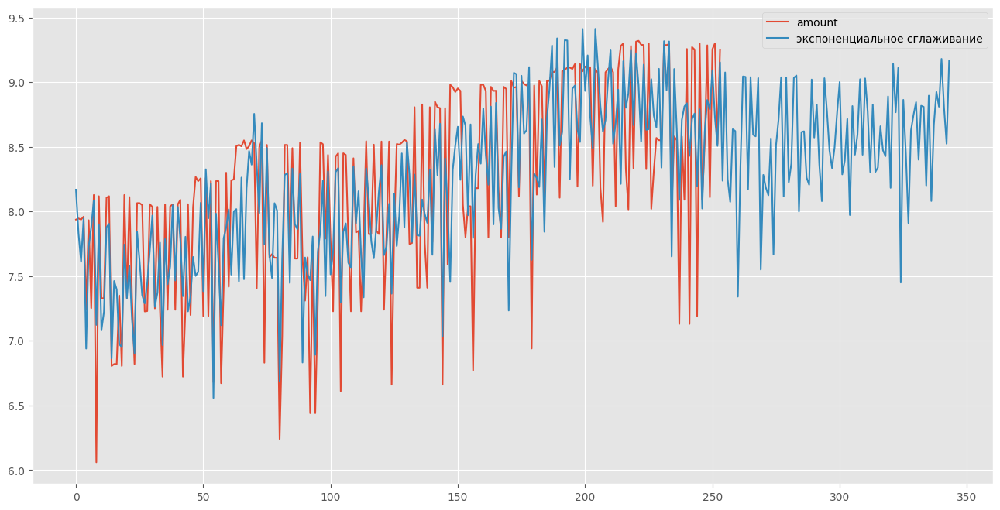

In [101]:
data_competitors_3_0 = data_competitors_3_0[700:]
fit_competitors_3_0 = ExponentialSmoothing(np.asarray(data_competitors_3_0), seasonal_periods=90, 
                                           seasonal='additive', trend='additive', damped_trend=True).fit()
fitted_competitors_3_0_ = fit_competitors_3_0.predict(0, len(data_competitors_3_0)+90-1)

plt.figure(figsize=(16,8))
plt.plot(np.asarray(data_competitors_3_0), label='amount')
plt.plot(fitted_competitors_3_0_, label='экспоненциальное сглаживание')
plt.legend(loc='best')
plt.show()

Text(0.5, 1.0, 'Цены конкурентов')

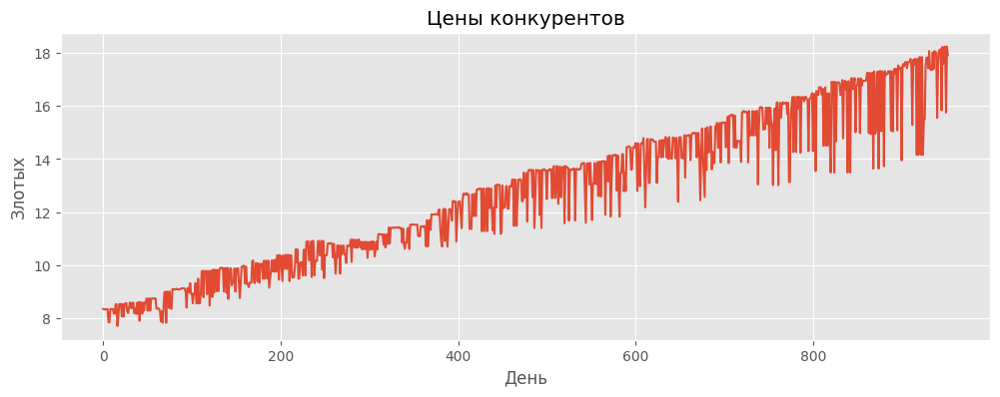

In [102]:
data_competitors_3_1 = df_competitors_grouped[(df_competitors_grouped['place'] == 3) & (df_competitors_grouped['product'] == 1)]['price']
data_competitors_3_1.reset_index(drop=True, inplace=True)

fig = plt.figure(figsize=(12, 4))
data_competitors_3_1.plot()
plt.xlabel(u'День')
plt.ylabel(u'Злотых')
plt.title(u'Цены конкурентов')

1. У временного ряда растущий тренд
2. У временного ряда мультипликативная сезонность
3. Ряд меняет свой характер около 200 и 370 наблюдениев
4. У ряда нет выбросов
5. У ряда нет пропусков

D:\anaconda3\envs\cuda\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


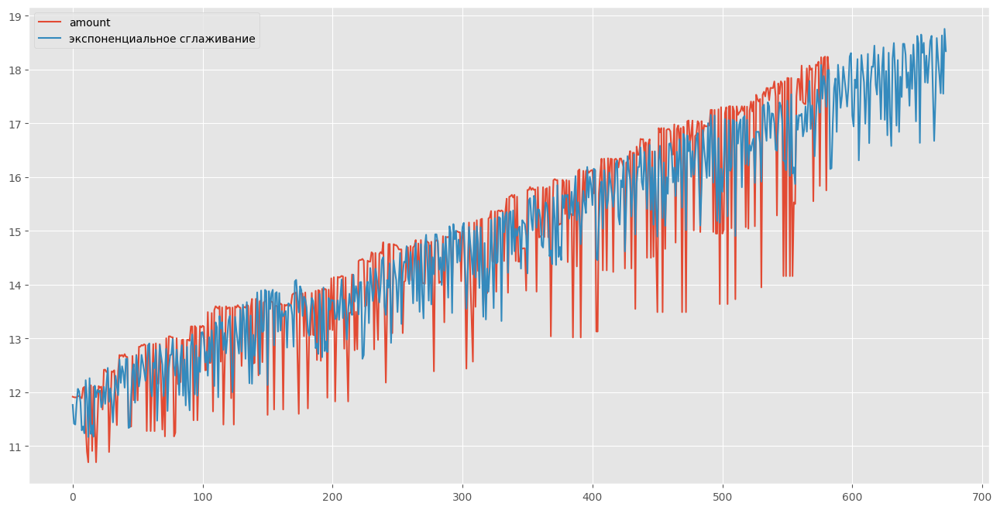

In [103]:
data_competitors_3_1 = data_competitors_3_1[370:]
fit_competitors_3_1 = ExponentialSmoothing(np.asarray(data_competitors_3_1), seasonal_periods=180, 
                                           seasonal='multiplicative', trend='additive', damped_trend=True).fit()
fitted_competitors_3_1_ = fit_competitors_3_1.predict(0, len(data_competitors_3_1)+90-1)

plt.figure(figsize=(16,8))
plt.plot(np.asarray(data_competitors_3_1), label='amount')
plt.plot(fitted_competitors_3_1_, label='экспоненциальное сглаживание')
plt.legend(loc='best')
plt.show()

Text(0.5, 1.0, 'Цены конкурентов')

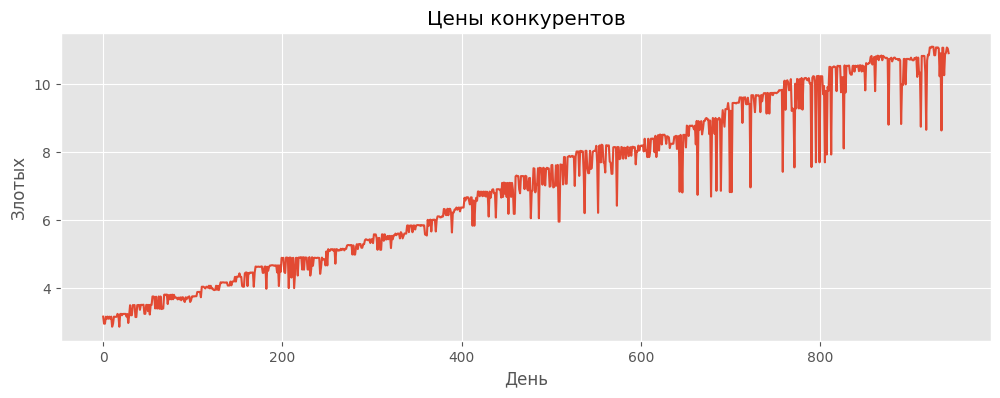

In [104]:
data_competitors_3_2 = df_competitors_grouped[(df_competitors_grouped['place'] == 3) & (df_competitors_grouped['product'] == 2)]['price']
data_competitors_3_2.reset_index(drop=True, inplace=True)

fig = plt.figure(figsize=(12, 4))
data_competitors_3_2.plot()
plt.xlabel(u'День')
plt.ylabel(u'Злотых')
plt.title(u'Цены конкурентов')

1. У временного ряда растущий тренд
2. У временного ряда мультипликативная сезонность
3. Ряд меняет свой характер около 400
4. У ряда нет выбросов
5. У ряда нет пропусков

D:\anaconda3\envs\cuda\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


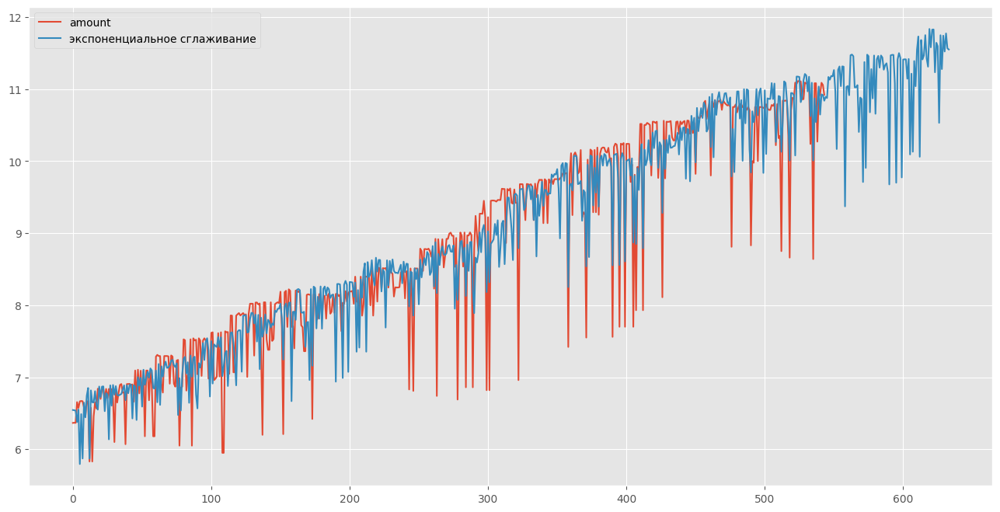

In [105]:
data_competitors_3_2 = data_competitors_3_2[400:]
fit_competitors_3_2 = ExponentialSmoothing(np.asarray(data_competitors_3_2), seasonal_periods=200, 
                                           seasonal='multiplicative', trend='additive').fit()
fitted_competitors_3_2_ = fit_competitors_3_2.predict(0, len(data_competitors_3_2)+90-1)

plt.figure(figsize=(16,8))
plt.plot(np.asarray(data_competitors_3_2), label='amount')
plt.plot(fitted_competitors_3_2_, label='экспоненциальное сглаживание')
plt.legend(loc='best')
plt.show()

Text(0.5, 1.0, 'Цены конкурентов')

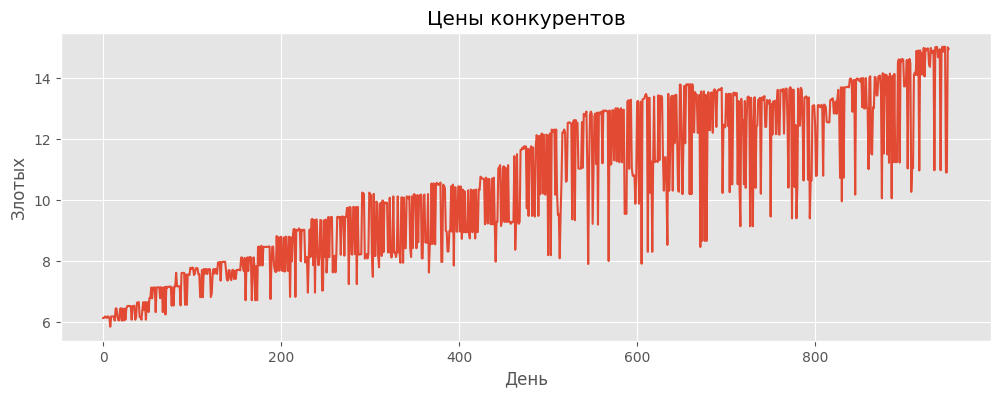

In [106]:
data_competitors_4_0 = df_competitors_grouped[(df_competitors_grouped['place'] == 4) & (df_competitors_grouped['product'] == 0)]['price']
data_competitors_4_0.reset_index(drop=True, inplace=True)

fig = plt.figure(figsize=(12, 4))
data_competitors_4_0.plot()
plt.xlabel(u'День')
plt.ylabel(u'Злотых')
plt.title(u'Цены конкурентов')

1. У временного ряда растущий тренд
2. У временного ряда мультипликативная сезонность
3. Ряд меняет свой характер около 420 и 800 наблюдениев
4. У ряда нет выбросов
5. У ряда нет пропусков

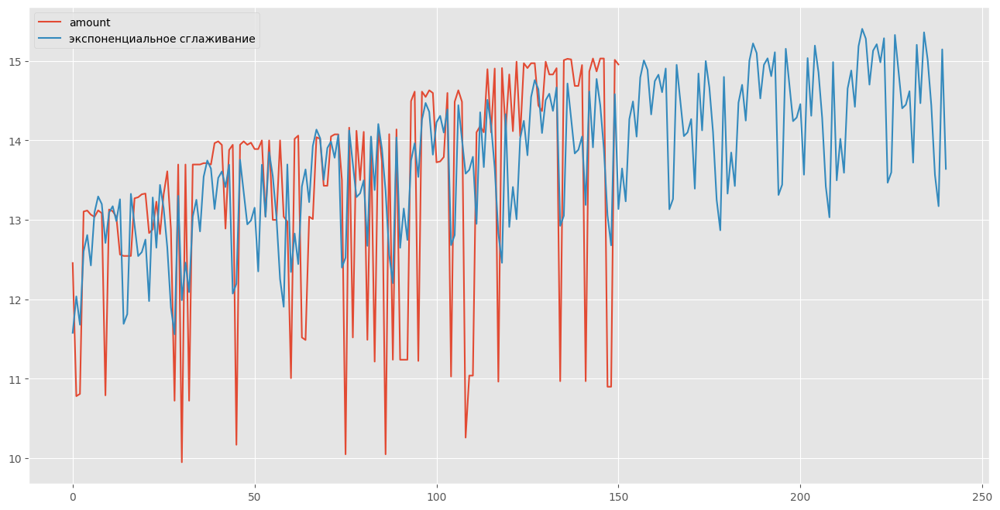

In [107]:
data_competitors_4_0 = data_competitors_4_0[800:]
fit_competitors_4_0 = ExponentialSmoothing(np.asarray(data_competitors_4_0), seasonal_periods=30, 
                                           seasonal='multiplicative', trend='additive', damped_trend=True).fit()
fitted_competitors_4_0_ = fit_competitors_4_0.predict(0, len(data_competitors_4_0)+90-1)

plt.figure(figsize=(16,8))
plt.plot(np.asarray(data_competitors_4_0), label='amount')
plt.plot(fitted_competitors_4_0_, label='экспоненциальное сглаживание')
plt.legend(loc='best')
plt.show()

Text(0.5, 1.0, 'Цены конкурентов')

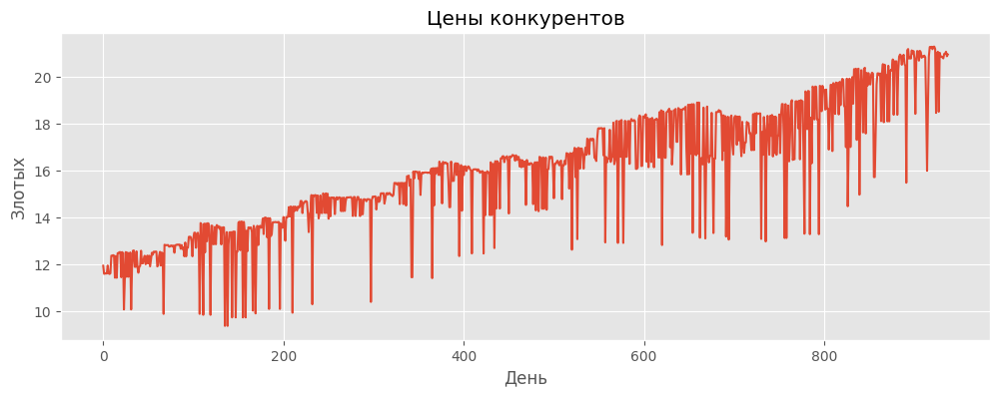

In [108]:
data_competitors_4_1 = df_competitors_grouped[(df_competitors_grouped['place'] == 4) & (df_competitors_grouped['product'] == 1)]['price']
data_competitors_4_1.reset_index(drop=True, inplace=True)

fig = plt.figure(figsize=(12, 4))
data_competitors_4_1.plot()
plt.xlabel(u'День')
plt.ylabel(u'Злотых')
plt.title(u'Цены конкурентов')

1. У временного ряда растущий тренд
2. У временного ряда аддетивная сезонность
3. Ряд меняет свой характер около 750 наблюдения
4. У ряда нет выбросов
5. У ряда нет пропусков

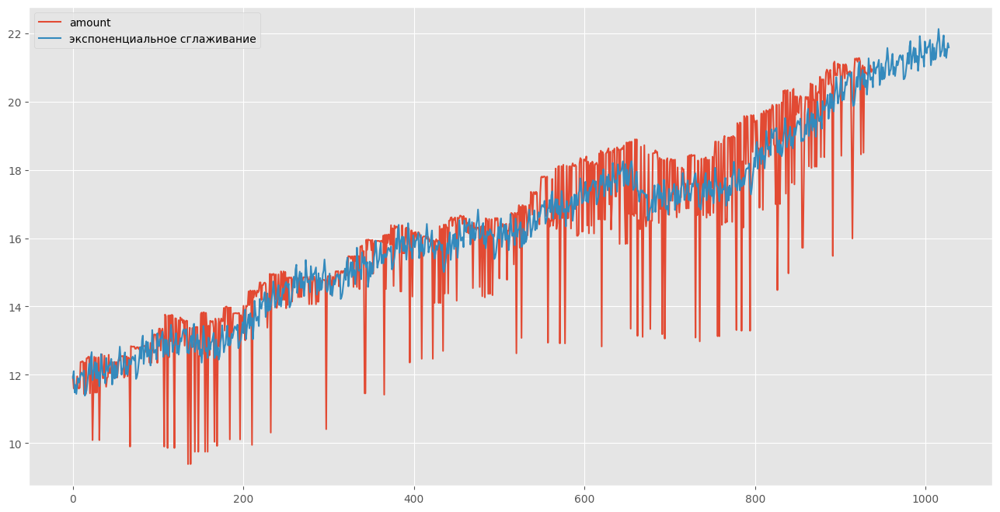

In [109]:
# data_competitors_4_1 = data_competitors_4_1[750:]
fit_competitors_4_1 = ExponentialSmoothing(np.asarray(data_competitors_4_1), seasonal_periods=60, 
                                           seasonal='additive', trend='additive', damped_trend=True).fit()
fitted_competitors_4_1_ = fit_competitors_4_1.predict(0, len(data_competitors_4_1)+90-1)

plt.figure(figsize=(16,8))
plt.plot(np.asarray(data_competitors_4_1), label='amount')
plt.plot(fitted_competitors_4_1_, label='экспоненциальное сглаживание')
plt.legend(loc='best')
plt.show()

Text(0.5, 1.0, 'Цены конкурентов')

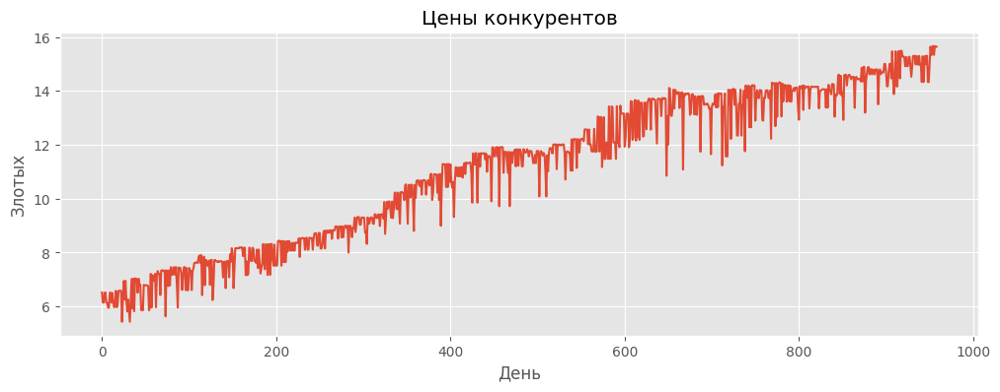

In [110]:
data_competitors_4_2 = df_competitors_grouped[(df_competitors_grouped['place'] == 4) & (df_competitors_grouped['product'] == 2)]['price']
data_competitors_4_2.reset_index(drop=True, inplace=True)

fig = plt.figure(figsize=(12, 4))
data_competitors_4_2.plot()
plt.xlabel(u'День')
plt.ylabel(u'Злотых')
plt.title(u'Цены конкурентов')

1. У временного ряда растущий тренд
2. У временного ряда аддетивная сезонность
3. Ряд меняет свой характер около 620 наблюдения
4. У ряда нет выбросов
5. У ряда нет пропусков

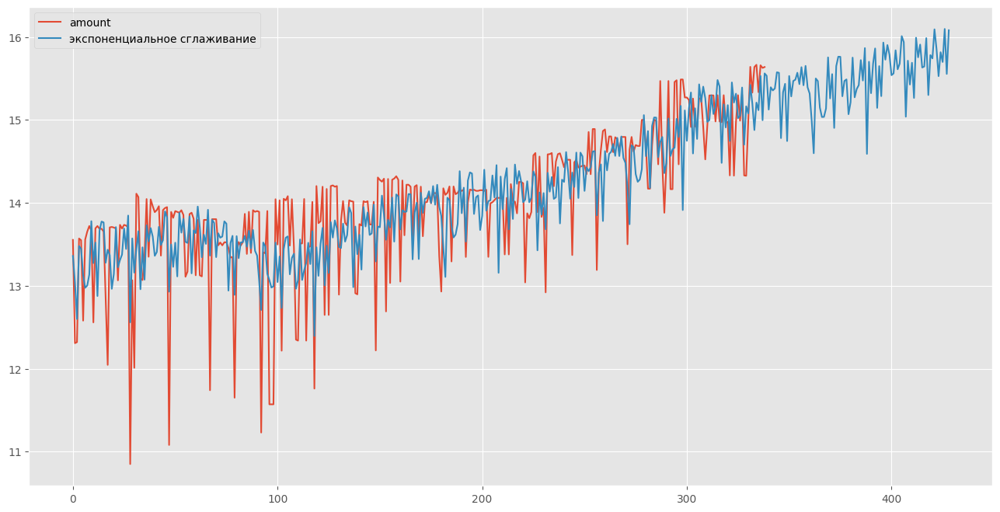

In [111]:
data_competitors_4_2 = data_competitors_4_2[620:]
fit_competitors_4_2 = ExponentialSmoothing(np.asarray(data_competitors_4_2), seasonal_periods=90, 
                                           seasonal='additive', trend='additive', damped_trend=True).fit()
fitted_competitors_4_2_ = fit_competitors_4_2.predict(0, len(data_competitors_4_2)+90-1)

plt.figure(figsize=(16,8))
plt.plot(np.asarray(data_competitors_4_2), label='amount')
plt.plot(fitted_competitors_4_2_, label='экспоненциальное сглаживание')
plt.legend(loc='best')
plt.show()

In [112]:
predict_competitors_expon_1_1 = fitted_competitors_0_0_[len(fitted_competitors_0_0_)-90:]
predict_competitors_expon_2_1 = fitted_competitors_1_0_[len(fitted_competitors_1_0_)-90:]
predict_competitors_expon_3_1 = fitted_competitors_2_0_[len(fitted_competitors_2_0_)-90:]
predict_competitors_expon_4_1 = fitted_competitors_3_0_[len(fitted_competitors_3_0_)-90:]
predict_competitors_expon_5_1 = fitted_competitors_4_0_[len(fitted_competitors_4_0_)-90:]

predict_competitors_expon_1_2 = fitted_competitors_0_1_[len(fitted_competitors_0_1_)-90:]
predict_competitors_expon_2_2 = fitted_competitors_1_1_[len(fitted_competitors_1_1_)-90:]
predict_competitors_expon_3_2 = fitted_competitors_2_1_[len(fitted_competitors_2_1_)-90:]
predict_competitors_expon_4_2 = fitted_competitors_3_1_[len(fitted_competitors_3_1_)-90:]
predict_competitors_expon_5_2 = fitted_competitors_4_1_[len(fitted_competitors_4_1_)-90:]

predict_competitors_expon_1_3 = fitted_competitors_0_2_[len(fitted_competitors_0_2_)-90:]
predict_competitors_expon_2_3 = fitted_competitors_1_2_[len(fitted_competitors_1_2_)-90:]
predict_competitors_expon_3_3 = fitted_competitors_2_2_[len(fitted_competitors_2_2_)-90:]
predict_competitors_expon_4_3 = fitted_competitors_3_2_[len(fitted_competitors_3_2_)-90:]
predict_competitors_expon_5_3 = fitted_competitors_4_2_[len(fitted_competitors_4_2_)-90:]

In [113]:
predicted_cost = [[predict_cost_expon_1_1, predict_cost_expon_1_2, predict_cost_expon_1_3],
                  [predict_cost_expon_2_1, predict_cost_expon_2_2, predict_cost_expon_2_3],
                  [predict_cost_expon_3_1, predict_cost_expon_3_2, predict_cost_expon_3_3],
                  [predict_cost_expon_4_1, predict_cost_expon_4_2, predict_cost_expon_4_3],
                  [predict_cost_expon_5_1, predict_cost_expon_5_2, predict_cost_expon_5_3]]

predicted_competitors = [[predict_competitors_expon_1_1, predict_competitors_expon_1_2, predict_competitors_expon_1_3],
                         [predict_competitors_expon_2_1, predict_competitors_expon_2_2, predict_competitors_expon_2_3],
                         [predict_competitors_expon_3_1, predict_competitors_expon_3_2, predict_competitors_expon_3_3],
                         [predict_competitors_expon_4_1, predict_competitors_expon_4_2, predict_competitors_expon_4_3],
                         [predict_competitors_expon_5_1, predict_competitors_expon_5_2, predict_competitors_expon_5_3]]

In [114]:
max_date = max(df_transaction_clean['date']).date()
def create_dataframe(place, product):
    cost = list()
    for i in range(len(predicted_cost[place][product])):
        cost.extend([predicted_cost[place][product][i] for _ in range(round(90/len(predicted_cost[place][product])))])

    data = {'day_num': list(range(1, 91)),
            'place': [place for _ in range(90)],
            'product': [product for _ in range(90)],
            'cost': cost[:90],
            'date': [max_date + timedelta(i) for i in range(1, 91)],
            'competitors_price': predicted_competitors[place][product]}

    return pd.DataFrame(data)

In [116]:
df_predict_1_1 = create_dataframe(0, 0)
df_predict_1_2 = create_dataframe(0, 1)
df_predict_1_3 = create_dataframe(0, 2)

df_predict_2_1 = create_dataframe(1, 0)
df_predict_2_2 = create_dataframe(1, 1)
df_predict_2_3 = create_dataframe(1, 2)

df_predict_3_1 = create_dataframe(2, 0)
df_predict_3_2 = create_dataframe(2, 1)
df_predict_3_3 = create_dataframe(2, 2)

df_predict_4_1 = create_dataframe(3, 0)
df_predict_4_2 = create_dataframe(3, 1)
df_predict_4_3 = create_dataframe(3, 2)

df_predict_5_1 = create_dataframe(4, 0)
df_predict_5_2 = create_dataframe(4, 1)
df_predict_5_3 = create_dataframe(4, 2)

In [117]:
df_predict = pd.concat([
    df_predict_1_1,
    df_predict_1_2,
    df_predict_1_3,
    
    df_predict_2_1,
    df_predict_2_2,
    df_predict_2_3,
    
    df_predict_3_1,
    df_predict_3_2,
    df_predict_3_3,
    
    df_predict_4_1,
    df_predict_4_2,
    df_predict_4_3,
    
    df_predict_5_1,
    df_predict_5_2,
    df_predict_5_3,
])

In [118]:
df_predict.head()

,day_num,place,product,cost,date,competitors_price
0,1,0,0,5.072269,2218-09-28,10.511567
1,2,0,0,5.072269,2218-09-29,9.879071
2,3,0,0,5.072269,2218-09-30,9.107714
3,4,0,0,5.072269,2218-10-01,9.862911
4,5,0,0,5.072269,2218-10-02,10.880847


### 3 Предсказание погоды

In [119]:
# создадим модель предсказания погоды по дате и месту 
# (будем предсказывать только есть ли погодные условия или нет - 1/0 - бинарная классификация)
# в качестве модели будем использовать XGBoost
# для начала из даты сделаем стобцы год/месяц/день

df_predict['year'] = df_predict['date'].apply(lambda x: x.year)
df_predict['month'] = df_predict['date'].apply(lambda x: x.month)
df_predict['day'] = df_predict['date'].apply(lambda x: x.day)

In [120]:
# классы сбалансированы
print(sum(df_transaction_clean['weather'] == 0))
print(sum(df_transaction_clean['weather'] == 1))

7182
7690


In [121]:
# разобем данные на тренировочный и валидационный наборы
# используем информацию только о первых четырех местах, если везде нули - пятое место (для избежания коллинеарности)

X_train, X_test, y_train, y_test = train_test_split(df_transaction_clean[['place_0', 'place_1', 'place_2', 'place_3', 'year', 'month', 'day']], 
                                                    df_transaction_clean['weather'], test_size=0.2, random_state=42)

In [656]:
# начнем с бейзлайна с заранее определенными параметрами
model = XGBClassifier(seed=42,
                      n_estimators=100,
                      max_depth=6,
                      learning_rate=0.3)
model.fit(X_train, y_train)

y_pred_train = model.predict(X_train)
print (metrics.classification_report(y_train, y_pred_train))

y_pred_test = model.predict(X_test)
print (metrics.classification_report(y_test, y_pred_test))
# получили неплохие результаты в 0.71 для тестового набора данных

              precision    recall  f1-score   support

           0       0.83      0.79      0.81      5739
           1       0.82      0.84      0.83      6158

    accuracy                           0.82     11897
   macro avg       0.82      0.82      0.82     11897
weighted avg       0.82      0.82      0.82     11897

              precision    recall  f1-score   support

           0       0.71      0.69      0.70      1443
           1       0.71      0.73      0.72      1532

    accuracy                           0.71      2975
   macro avg       0.71      0.71      0.71      2975
weighted avg       0.71      0.71      0.71      2975



In [658]:
model = XGBClassifier(gamma=0.0001)

# Задаём сетку параметров
n_estimators = [50, 100, 300, 400, 500, 1000]
learning_rate = [0.3, 0.2, 0.1, 0.05]
max_depth = [4, 5, 6, 8, 10]
reg_lambda = [0, 1]
reg_alpha = [0, 1]
# Задаём словарь с параметрами
param_grid = dict(learning_rate=learning_rate, n_estimators=n_estimators, 
                  max_depth=max_depth, reg_lambda=reg_lambda, reg_alpha=reg_alpha)
# Задаём разбиение данных на лёрн и тест n_splits раз. Для каждого такого разбиения буде
kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

grid_search = GridSearchCV(model, param_grid, scoring="accuracy", cv=kfold, verbose=2)
grid_result = grid_search.fit(X_train, y_train)

print("best score: ", grid_search.best_score_)
print("best param: ", grid_search.best_params_)
print("test score:", grid_search.score(X_test, y_test))

Fitting 5 folds for each of 480 candidates, totalling 2400 fits
[CV] END learning_rate=0.3, max_depth=4, n_estimators=50, reg_alpha=0, reg_lambda=0; total time=   0.0s
[CV] END learning_rate=0.3, max_depth=4, n_estimators=50, reg_alpha=0, reg_lambda=0; total time=   0.0s
[CV] END learning_rate=0.3, max_depth=4, n_estimators=50, reg_alpha=0, reg_lambda=0; total time=   0.0s
[CV] END learning_rate=0.3, max_depth=4, n_estimators=50, reg_alpha=0, reg_lambda=0; total time=   0.0s
[CV] END learning_rate=0.3, max_depth=4, n_estimators=50, reg_alpha=0, reg_lambda=0; total time=   0.0s
[CV] END learning_rate=0.3, max_depth=4, n_estimators=50, reg_alpha=0, reg_lambda=1; total time=   0.0s
[CV] END learning_rate=0.3, max_depth=4, n_estimators=50, reg_alpha=0, reg_lambda=1; total time=   0.0s
[CV] END learning_rate=0.3, max_depth=4, n_estimators=50, reg_alpha=0, reg_lambda=1; total time=   0.0s
[CV] END learning_rate=0.3, max_depth=4, n_estimators=50, reg_alpha=0, reg_lambda=1; total time=   0.0s


[CV] END learning_rate=0.3, max_depth=4, n_estimators=400, reg_alpha=1, reg_lambda=1; total time=   0.1s
[CV] END learning_rate=0.3, max_depth=4, n_estimators=400, reg_alpha=1, reg_lambda=1; total time=   0.0s
[CV] END learning_rate=0.3, max_depth=4, n_estimators=500, reg_alpha=0, reg_lambda=0; total time=   0.1s
[CV] END learning_rate=0.3, max_depth=4, n_estimators=500, reg_alpha=0, reg_lambda=0; total time=   0.1s
[CV] END learning_rate=0.3, max_depth=4, n_estimators=500, reg_alpha=0, reg_lambda=0; total time=   0.1s
[CV] END learning_rate=0.3, max_depth=4, n_estimators=500, reg_alpha=0, reg_lambda=0; total time=   0.1s
[CV] END learning_rate=0.3, max_depth=4, n_estimators=500, reg_alpha=0, reg_lambda=0; total time=   0.1s
[CV] END learning_rate=0.3, max_depth=4, n_estimators=500, reg_alpha=0, reg_lambda=1; total time=   0.1s
[CV] END learning_rate=0.3, max_depth=4, n_estimators=500, reg_alpha=0, reg_lambda=1; total time=   0.1s
[CV] END learning_rate=0.3, max_depth=4, n_estimators=5

[CV] END learning_rate=0.3, max_depth=5, n_estimators=100, reg_alpha=1, reg_lambda=1; total time=   0.0s
[CV] END learning_rate=0.3, max_depth=5, n_estimators=100, reg_alpha=1, reg_lambda=1; total time=   0.0s
[CV] END learning_rate=0.3, max_depth=5, n_estimators=300, reg_alpha=0, reg_lambda=0; total time=   0.0s
[CV] END learning_rate=0.3, max_depth=5, n_estimators=300, reg_alpha=0, reg_lambda=0; total time=   0.0s
[CV] END learning_rate=0.3, max_depth=5, n_estimators=300, reg_alpha=0, reg_lambda=0; total time=   0.0s
[CV] END learning_rate=0.3, max_depth=5, n_estimators=300, reg_alpha=0, reg_lambda=0; total time=   0.0s
[CV] END learning_rate=0.3, max_depth=5, n_estimators=300, reg_alpha=0, reg_lambda=0; total time=   0.0s
[CV] END learning_rate=0.3, max_depth=5, n_estimators=300, reg_alpha=0, reg_lambda=1; total time=   0.0s
[CV] END learning_rate=0.3, max_depth=5, n_estimators=300, reg_alpha=0, reg_lambda=1; total time=   0.0s
[CV] END learning_rate=0.3, max_depth=5, n_estimators=3

[CV] END learning_rate=0.3, max_depth=5, n_estimators=1000, reg_alpha=1, reg_lambda=1; total time=   0.1s
[CV] END learning_rate=0.3, max_depth=5, n_estimators=1000, reg_alpha=1, reg_lambda=1; total time=   0.1s
[CV] END learning_rate=0.3, max_depth=5, n_estimators=1000, reg_alpha=1, reg_lambda=1; total time=   0.1s
[CV] END learning_rate=0.3, max_depth=5, n_estimators=1000, reg_alpha=1, reg_lambda=1; total time=   0.1s
[CV] END learning_rate=0.3, max_depth=6, n_estimators=50, reg_alpha=0, reg_lambda=0; total time=   0.0s
[CV] END learning_rate=0.3, max_depth=6, n_estimators=50, reg_alpha=0, reg_lambda=0; total time=   0.0s
[CV] END learning_rate=0.3, max_depth=6, n_estimators=50, reg_alpha=0, reg_lambda=0; total time=   0.0s
[CV] END learning_rate=0.3, max_depth=6, n_estimators=50, reg_alpha=0, reg_lambda=0; total time=   0.0s
[CV] END learning_rate=0.3, max_depth=6, n_estimators=50, reg_alpha=0, reg_lambda=0; total time=   0.0s
[CV] END learning_rate=0.3, max_depth=6, n_estimators=50

[CV] END learning_rate=0.3, max_depth=6, n_estimators=400, reg_alpha=1, reg_lambda=1; total time=   0.1s
[CV] END learning_rate=0.3, max_depth=6, n_estimators=400, reg_alpha=1, reg_lambda=1; total time=   0.1s
[CV] END learning_rate=0.3, max_depth=6, n_estimators=400, reg_alpha=1, reg_lambda=1; total time=   0.0s
[CV] END learning_rate=0.3, max_depth=6, n_estimators=400, reg_alpha=1, reg_lambda=1; total time=   0.1s
[CV] END learning_rate=0.3, max_depth=6, n_estimators=400, reg_alpha=1, reg_lambda=1; total time=   0.1s
[CV] END learning_rate=0.3, max_depth=6, n_estimators=500, reg_alpha=0, reg_lambda=0; total time=   0.2s
[CV] END learning_rate=0.3, max_depth=6, n_estimators=500, reg_alpha=0, reg_lambda=0; total time=   0.2s
[CV] END learning_rate=0.3, max_depth=6, n_estimators=500, reg_alpha=0, reg_lambda=0; total time=   0.2s
[CV] END learning_rate=0.3, max_depth=6, n_estimators=500, reg_alpha=0, reg_lambda=0; total time=   0.2s
[CV] END learning_rate=0.3, max_depth=6, n_estimators=5

[CV] END learning_rate=0.3, max_depth=8, n_estimators=100, reg_alpha=1, reg_lambda=1; total time=   0.0s
[CV] END learning_rate=0.3, max_depth=8, n_estimators=100, reg_alpha=1, reg_lambda=1; total time=   0.0s
[CV] END learning_rate=0.3, max_depth=8, n_estimators=100, reg_alpha=1, reg_lambda=1; total time=   0.0s
[CV] END learning_rate=0.3, max_depth=8, n_estimators=100, reg_alpha=1, reg_lambda=1; total time=   0.0s
[CV] END learning_rate=0.3, max_depth=8, n_estimators=100, reg_alpha=1, reg_lambda=1; total time=   0.0s
[CV] END learning_rate=0.3, max_depth=8, n_estimators=300, reg_alpha=0, reg_lambda=0; total time=   0.2s
[CV] END learning_rate=0.3, max_depth=8, n_estimators=300, reg_alpha=0, reg_lambda=0; total time=   0.2s
[CV] END learning_rate=0.3, max_depth=8, n_estimators=300, reg_alpha=0, reg_lambda=0; total time=   0.1s
[CV] END learning_rate=0.3, max_depth=8, n_estimators=300, reg_alpha=0, reg_lambda=0; total time=   0.2s
[CV] END learning_rate=0.3, max_depth=8, n_estimators=3

[CV] END learning_rate=0.3, max_depth=8, n_estimators=1000, reg_alpha=1, reg_lambda=0; total time=   0.2s
[CV] END learning_rate=0.3, max_depth=8, n_estimators=1000, reg_alpha=1, reg_lambda=0; total time=   0.1s
[CV] END learning_rate=0.3, max_depth=8, n_estimators=1000, reg_alpha=1, reg_lambda=1; total time=   0.2s
[CV] END learning_rate=0.3, max_depth=8, n_estimators=1000, reg_alpha=1, reg_lambda=1; total time=   0.2s
[CV] END learning_rate=0.3, max_depth=8, n_estimators=1000, reg_alpha=1, reg_lambda=1; total time=   0.2s
[CV] END learning_rate=0.3, max_depth=8, n_estimators=1000, reg_alpha=1, reg_lambda=1; total time=   0.2s
[CV] END learning_rate=0.3, max_depth=8, n_estimators=1000, reg_alpha=1, reg_lambda=1; total time=   0.2s
[CV] END learning_rate=0.3, max_depth=10, n_estimators=50, reg_alpha=0, reg_lambda=0; total time=   0.0s
[CV] END learning_rate=0.3, max_depth=10, n_estimators=50, reg_alpha=0, reg_lambda=0; total time=   0.0s
[CV] END learning_rate=0.3, max_depth=10, n_esti

[CV] END learning_rate=0.3, max_depth=10, n_estimators=400, reg_alpha=1, reg_lambda=0; total time=   0.1s
[CV] END learning_rate=0.3, max_depth=10, n_estimators=400, reg_alpha=1, reg_lambda=0; total time=   0.1s
[CV] END learning_rate=0.3, max_depth=10, n_estimators=400, reg_alpha=1, reg_lambda=0; total time=   0.1s
[CV] END learning_rate=0.3, max_depth=10, n_estimators=400, reg_alpha=1, reg_lambda=0; total time=   0.1s
[CV] END learning_rate=0.3, max_depth=10, n_estimators=400, reg_alpha=1, reg_lambda=1; total time=   0.1s
[CV] END learning_rate=0.3, max_depth=10, n_estimators=400, reg_alpha=1, reg_lambda=1; total time=   0.1s
[CV] END learning_rate=0.3, max_depth=10, n_estimators=400, reg_alpha=1, reg_lambda=1; total time=   0.1s
[CV] END learning_rate=0.3, max_depth=10, n_estimators=400, reg_alpha=1, reg_lambda=1; total time=   0.1s
[CV] END learning_rate=0.3, max_depth=10, n_estimators=400, reg_alpha=1, reg_lambda=1; total time=   0.1s
[CV] END learning_rate=0.3, max_depth=10, n_es

[CV] END learning_rate=0.2, max_depth=4, n_estimators=100, reg_alpha=1, reg_lambda=0; total time=   0.0s
[CV] END learning_rate=0.2, max_depth=4, n_estimators=100, reg_alpha=1, reg_lambda=0; total time=   0.0s
[CV] END learning_rate=0.2, max_depth=4, n_estimators=100, reg_alpha=1, reg_lambda=0; total time=   0.0s
[CV] END learning_rate=0.2, max_depth=4, n_estimators=100, reg_alpha=1, reg_lambda=1; total time=   0.0s
[CV] END learning_rate=0.2, max_depth=4, n_estimators=100, reg_alpha=1, reg_lambda=1; total time=   0.0s
[CV] END learning_rate=0.2, max_depth=4, n_estimators=100, reg_alpha=1, reg_lambda=1; total time=   0.0s
[CV] END learning_rate=0.2, max_depth=4, n_estimators=100, reg_alpha=1, reg_lambda=1; total time=   0.0s
[CV] END learning_rate=0.2, max_depth=4, n_estimators=100, reg_alpha=1, reg_lambda=1; total time=   0.0s
[CV] END learning_rate=0.2, max_depth=4, n_estimators=300, reg_alpha=0, reg_lambda=0; total time=   0.0s
[CV] END learning_rate=0.2, max_depth=4, n_estimators=3

[CV] END learning_rate=0.2, max_depth=4, n_estimators=1000, reg_alpha=1, reg_lambda=0; total time=   0.2s
[CV] END learning_rate=0.2, max_depth=4, n_estimators=1000, reg_alpha=1, reg_lambda=0; total time=   0.1s
[CV] END learning_rate=0.2, max_depth=4, n_estimators=1000, reg_alpha=1, reg_lambda=0; total time=   0.2s
[CV] END learning_rate=0.2, max_depth=4, n_estimators=1000, reg_alpha=1, reg_lambda=0; total time=   0.2s
[CV] END learning_rate=0.2, max_depth=4, n_estimators=1000, reg_alpha=1, reg_lambda=0; total time=   0.1s
[CV] END learning_rate=0.2, max_depth=4, n_estimators=1000, reg_alpha=1, reg_lambda=1; total time=   0.1s
[CV] END learning_rate=0.2, max_depth=4, n_estimators=1000, reg_alpha=1, reg_lambda=1; total time=   0.2s
[CV] END learning_rate=0.2, max_depth=4, n_estimators=1000, reg_alpha=1, reg_lambda=1; total time=   0.2s
[CV] END learning_rate=0.2, max_depth=4, n_estimators=1000, reg_alpha=1, reg_lambda=1; total time=   0.2s
[CV] END learning_rate=0.2, max_depth=4, n_est

[CV] END learning_rate=0.2, max_depth=5, n_estimators=400, reg_alpha=1, reg_lambda=0; total time=   0.1s
[CV] END learning_rate=0.2, max_depth=5, n_estimators=400, reg_alpha=1, reg_lambda=0; total time=   0.1s
[CV] END learning_rate=0.2, max_depth=5, n_estimators=400, reg_alpha=1, reg_lambda=0; total time=   0.1s
[CV] END learning_rate=0.2, max_depth=5, n_estimators=400, reg_alpha=1, reg_lambda=0; total time=   0.1s
[CV] END learning_rate=0.2, max_depth=5, n_estimators=400, reg_alpha=1, reg_lambda=0; total time=   0.0s
[CV] END learning_rate=0.2, max_depth=5, n_estimators=400, reg_alpha=1, reg_lambda=1; total time=   0.1s
[CV] END learning_rate=0.2, max_depth=5, n_estimators=400, reg_alpha=1, reg_lambda=1; total time=   0.1s
[CV] END learning_rate=0.2, max_depth=5, n_estimators=400, reg_alpha=1, reg_lambda=1; total time=   0.1s
[CV] END learning_rate=0.2, max_depth=5, n_estimators=400, reg_alpha=1, reg_lambda=1; total time=   0.1s
[CV] END learning_rate=0.2, max_depth=5, n_estimators=4

[CV] END learning_rate=0.2, max_depth=6, n_estimators=100, reg_alpha=1, reg_lambda=0; total time=   0.0s
[CV] END learning_rate=0.2, max_depth=6, n_estimators=100, reg_alpha=1, reg_lambda=0; total time=   0.0s
[CV] END learning_rate=0.2, max_depth=6, n_estimators=100, reg_alpha=1, reg_lambda=0; total time=   0.0s
[CV] END learning_rate=0.2, max_depth=6, n_estimators=100, reg_alpha=1, reg_lambda=0; total time=   0.0s
[CV] END learning_rate=0.2, max_depth=6, n_estimators=100, reg_alpha=1, reg_lambda=0; total time=   0.0s
[CV] END learning_rate=0.2, max_depth=6, n_estimators=100, reg_alpha=1, reg_lambda=1; total time=   0.0s
[CV] END learning_rate=0.2, max_depth=6, n_estimators=100, reg_alpha=1, reg_lambda=1; total time=   0.0s
[CV] END learning_rate=0.2, max_depth=6, n_estimators=100, reg_alpha=1, reg_lambda=1; total time=   0.0s
[CV] END learning_rate=0.2, max_depth=6, n_estimators=100, reg_alpha=1, reg_lambda=1; total time=   0.0s
[CV] END learning_rate=0.2, max_depth=6, n_estimators=1

[CV] END learning_rate=0.2, max_depth=6, n_estimators=1000, reg_alpha=0, reg_lambda=1; total time=   0.4s
[CV] END learning_rate=0.2, max_depth=6, n_estimators=1000, reg_alpha=0, reg_lambda=1; total time=   0.5s
[CV] END learning_rate=0.2, max_depth=6, n_estimators=1000, reg_alpha=1, reg_lambda=0; total time=   0.2s
[CV] END learning_rate=0.2, max_depth=6, n_estimators=1000, reg_alpha=1, reg_lambda=0; total time=   0.2s
[CV] END learning_rate=0.2, max_depth=6, n_estimators=1000, reg_alpha=1, reg_lambda=0; total time=   0.2s
[CV] END learning_rate=0.2, max_depth=6, n_estimators=1000, reg_alpha=1, reg_lambda=0; total time=   0.2s
[CV] END learning_rate=0.2, max_depth=6, n_estimators=1000, reg_alpha=1, reg_lambda=0; total time=   0.2s
[CV] END learning_rate=0.2, max_depth=6, n_estimators=1000, reg_alpha=1, reg_lambda=1; total time=   0.2s
[CV] END learning_rate=0.2, max_depth=6, n_estimators=1000, reg_alpha=1, reg_lambda=1; total time=   0.2s
[CV] END learning_rate=0.2, max_depth=6, n_est

[CV] END learning_rate=0.2, max_depth=8, n_estimators=400, reg_alpha=0, reg_lambda=1; total time=   0.3s
[CV] END learning_rate=0.2, max_depth=8, n_estimators=400, reg_alpha=0, reg_lambda=1; total time=   0.3s
[CV] END learning_rate=0.2, max_depth=8, n_estimators=400, reg_alpha=0, reg_lambda=1; total time=   0.3s
[CV] END learning_rate=0.2, max_depth=8, n_estimators=400, reg_alpha=1, reg_lambda=0; total time=   0.1s
[CV] END learning_rate=0.2, max_depth=8, n_estimators=400, reg_alpha=1, reg_lambda=0; total time=   0.1s
[CV] END learning_rate=0.2, max_depth=8, n_estimators=400, reg_alpha=1, reg_lambda=0; total time=   0.2s
[CV] END learning_rate=0.2, max_depth=8, n_estimators=400, reg_alpha=1, reg_lambda=0; total time=   0.2s
[CV] END learning_rate=0.2, max_depth=8, n_estimators=400, reg_alpha=1, reg_lambda=0; total time=   0.1s
[CV] END learning_rate=0.2, max_depth=8, n_estimators=400, reg_alpha=1, reg_lambda=1; total time=   0.2s
[CV] END learning_rate=0.2, max_depth=8, n_estimators=4

[CV] END learning_rate=0.2, max_depth=10, n_estimators=100, reg_alpha=0, reg_lambda=1; total time=   0.1s
[CV] END learning_rate=0.2, max_depth=10, n_estimators=100, reg_alpha=0, reg_lambda=1; total time=   0.1s
[CV] END learning_rate=0.2, max_depth=10, n_estimators=100, reg_alpha=0, reg_lambda=1; total time=   0.1s
[CV] END learning_rate=0.2, max_depth=10, n_estimators=100, reg_alpha=0, reg_lambda=1; total time=   0.1s
[CV] END learning_rate=0.2, max_depth=10, n_estimators=100, reg_alpha=1, reg_lambda=0; total time=   0.1s
[CV] END learning_rate=0.2, max_depth=10, n_estimators=100, reg_alpha=1, reg_lambda=0; total time=   0.1s
[CV] END learning_rate=0.2, max_depth=10, n_estimators=100, reg_alpha=1, reg_lambda=0; total time=   0.1s
[CV] END learning_rate=0.2, max_depth=10, n_estimators=100, reg_alpha=1, reg_lambda=0; total time=   0.1s
[CV] END learning_rate=0.2, max_depth=10, n_estimators=100, reg_alpha=1, reg_lambda=0; total time=   0.1s
[CV] END learning_rate=0.2, max_depth=10, n_es

[CV] END learning_rate=0.2, max_depth=10, n_estimators=1000, reg_alpha=0, reg_lambda=0; total time=   0.9s
[CV] END learning_rate=0.2, max_depth=10, n_estimators=1000, reg_alpha=0, reg_lambda=1; total time=   1.0s
[CV] END learning_rate=0.2, max_depth=10, n_estimators=1000, reg_alpha=0, reg_lambda=1; total time=   1.0s
[CV] END learning_rate=0.2, max_depth=10, n_estimators=1000, reg_alpha=0, reg_lambda=1; total time=   1.1s
[CV] END learning_rate=0.2, max_depth=10, n_estimators=1000, reg_alpha=0, reg_lambda=1; total time=   1.1s
[CV] END learning_rate=0.2, max_depth=10, n_estimators=1000, reg_alpha=0, reg_lambda=1; total time=   1.1s
[CV] END learning_rate=0.2, max_depth=10, n_estimators=1000, reg_alpha=1, reg_lambda=0; total time=   0.3s
[CV] END learning_rate=0.2, max_depth=10, n_estimators=1000, reg_alpha=1, reg_lambda=0; total time=   0.3s
[CV] END learning_rate=0.2, max_depth=10, n_estimators=1000, reg_alpha=1, reg_lambda=0; total time=   0.3s
[CV] END learning_rate=0.2, max_depth

[CV] END learning_rate=0.1, max_depth=4, n_estimators=400, reg_alpha=0, reg_lambda=0; total time=   0.1s
[CV] END learning_rate=0.1, max_depth=4, n_estimators=400, reg_alpha=0, reg_lambda=0; total time=   0.1s
[CV] END learning_rate=0.1, max_depth=4, n_estimators=400, reg_alpha=0, reg_lambda=0; total time=   0.1s
[CV] END learning_rate=0.1, max_depth=4, n_estimators=400, reg_alpha=0, reg_lambda=1; total time=   0.1s
[CV] END learning_rate=0.1, max_depth=4, n_estimators=400, reg_alpha=0, reg_lambda=1; total time=   0.1s
[CV] END learning_rate=0.1, max_depth=4, n_estimators=400, reg_alpha=0, reg_lambda=1; total time=   0.1s
[CV] END learning_rate=0.1, max_depth=4, n_estimators=400, reg_alpha=0, reg_lambda=1; total time=   0.1s
[CV] END learning_rate=0.1, max_depth=4, n_estimators=400, reg_alpha=0, reg_lambda=1; total time=   0.1s
[CV] END learning_rate=0.1, max_depth=4, n_estimators=400, reg_alpha=1, reg_lambda=0; total time=   0.1s
[CV] END learning_rate=0.1, max_depth=4, n_estimators=4

[CV] END learning_rate=0.1, max_depth=5, n_estimators=100, reg_alpha=0, reg_lambda=0; total time=   0.0s
[CV] END learning_rate=0.1, max_depth=5, n_estimators=100, reg_alpha=0, reg_lambda=1; total time=   0.0s
[CV] END learning_rate=0.1, max_depth=5, n_estimators=100, reg_alpha=0, reg_lambda=1; total time=   0.0s
[CV] END learning_rate=0.1, max_depth=5, n_estimators=100, reg_alpha=0, reg_lambda=1; total time=   0.0s
[CV] END learning_rate=0.1, max_depth=5, n_estimators=100, reg_alpha=0, reg_lambda=1; total time=   0.0s
[CV] END learning_rate=0.1, max_depth=5, n_estimators=100, reg_alpha=0, reg_lambda=1; total time=   0.0s
[CV] END learning_rate=0.1, max_depth=5, n_estimators=100, reg_alpha=1, reg_lambda=0; total time=   0.0s
[CV] END learning_rate=0.1, max_depth=5, n_estimators=100, reg_alpha=1, reg_lambda=0; total time=   0.0s
[CV] END learning_rate=0.1, max_depth=5, n_estimators=100, reg_alpha=1, reg_lambda=0; total time=   0.0s
[CV] END learning_rate=0.1, max_depth=5, n_estimators=1

[CV] END learning_rate=0.1, max_depth=5, n_estimators=1000, reg_alpha=0, reg_lambda=0; total time=   0.4s
[CV] END learning_rate=0.1, max_depth=5, n_estimators=1000, reg_alpha=0, reg_lambda=0; total time=   0.5s
[CV] END learning_rate=0.1, max_depth=5, n_estimators=1000, reg_alpha=0, reg_lambda=1; total time=   0.4s
[CV] END learning_rate=0.1, max_depth=5, n_estimators=1000, reg_alpha=0, reg_lambda=1; total time=   0.4s
[CV] END learning_rate=0.1, max_depth=5, n_estimators=1000, reg_alpha=0, reg_lambda=1; total time=   0.4s
[CV] END learning_rate=0.1, max_depth=5, n_estimators=1000, reg_alpha=0, reg_lambda=1; total time=   0.4s
[CV] END learning_rate=0.1, max_depth=5, n_estimators=1000, reg_alpha=0, reg_lambda=1; total time=   0.4s
[CV] END learning_rate=0.1, max_depth=5, n_estimators=1000, reg_alpha=1, reg_lambda=0; total time=   0.2s
[CV] END learning_rate=0.1, max_depth=5, n_estimators=1000, reg_alpha=1, reg_lambda=0; total time=   0.2s
[CV] END learning_rate=0.1, max_depth=5, n_est

[CV] END learning_rate=0.1, max_depth=6, n_estimators=400, reg_alpha=0, reg_lambda=0; total time=   0.3s
[CV] END learning_rate=0.1, max_depth=6, n_estimators=400, reg_alpha=0, reg_lambda=0; total time=   0.3s
[CV] END learning_rate=0.1, max_depth=6, n_estimators=400, reg_alpha=0, reg_lambda=0; total time=   0.2s
[CV] END learning_rate=0.1, max_depth=6, n_estimators=400, reg_alpha=0, reg_lambda=1; total time=   0.2s
[CV] END learning_rate=0.1, max_depth=6, n_estimators=400, reg_alpha=0, reg_lambda=1; total time=   0.2s
[CV] END learning_rate=0.1, max_depth=6, n_estimators=400, reg_alpha=0, reg_lambda=1; total time=   0.2s
[CV] END learning_rate=0.1, max_depth=6, n_estimators=400, reg_alpha=0, reg_lambda=1; total time=   0.2s
[CV] END learning_rate=0.1, max_depth=6, n_estimators=400, reg_alpha=0, reg_lambda=1; total time=   0.2s
[CV] END learning_rate=0.1, max_depth=6, n_estimators=400, reg_alpha=1, reg_lambda=0; total time=   0.2s
[CV] END learning_rate=0.1, max_depth=6, n_estimators=4

[CV] END learning_rate=0.1, max_depth=8, n_estimators=100, reg_alpha=0, reg_lambda=0; total time=   0.0s
[CV] END learning_rate=0.1, max_depth=8, n_estimators=100, reg_alpha=0, reg_lambda=0; total time=   0.0s
[CV] END learning_rate=0.1, max_depth=8, n_estimators=100, reg_alpha=0, reg_lambda=0; total time=   0.0s
[CV] END learning_rate=0.1, max_depth=8, n_estimators=100, reg_alpha=0, reg_lambda=0; total time=   0.0s
[CV] END learning_rate=0.1, max_depth=8, n_estimators=100, reg_alpha=0, reg_lambda=1; total time=   0.0s
[CV] END learning_rate=0.1, max_depth=8, n_estimators=100, reg_alpha=0, reg_lambda=1; total time=   0.0s
[CV] END learning_rate=0.1, max_depth=8, n_estimators=100, reg_alpha=0, reg_lambda=1; total time=   0.0s
[CV] END learning_rate=0.1, max_depth=8, n_estimators=100, reg_alpha=0, reg_lambda=1; total time=   0.0s
[CV] END learning_rate=0.1, max_depth=8, n_estimators=100, reg_alpha=0, reg_lambda=1; total time=   0.0s
[CV] END learning_rate=0.1, max_depth=8, n_estimators=1

[CV] END learning_rate=0.1, max_depth=8, n_estimators=1000, reg_alpha=0, reg_lambda=0; total time=   0.9s
[CV] END learning_rate=0.1, max_depth=8, n_estimators=1000, reg_alpha=0, reg_lambda=0; total time=   0.8s
[CV] END learning_rate=0.1, max_depth=8, n_estimators=1000, reg_alpha=0, reg_lambda=0; total time=   0.8s
[CV] END learning_rate=0.1, max_depth=8, n_estimators=1000, reg_alpha=0, reg_lambda=0; total time=   0.8s
[CV] END learning_rate=0.1, max_depth=8, n_estimators=1000, reg_alpha=0, reg_lambda=0; total time=   0.8s
[CV] END learning_rate=0.1, max_depth=8, n_estimators=1000, reg_alpha=0, reg_lambda=1; total time=   0.8s
[CV] END learning_rate=0.1, max_depth=8, n_estimators=1000, reg_alpha=0, reg_lambda=1; total time=   0.8s
[CV] END learning_rate=0.1, max_depth=8, n_estimators=1000, reg_alpha=0, reg_lambda=1; total time=   0.8s
[CV] END learning_rate=0.1, max_depth=8, n_estimators=1000, reg_alpha=0, reg_lambda=1; total time=   0.8s
[CV] END learning_rate=0.1, max_depth=8, n_est

[CV] END learning_rate=0.1, max_depth=10, n_estimators=300, reg_alpha=1, reg_lambda=1; total time=   0.2s
[CV] END learning_rate=0.1, max_depth=10, n_estimators=300, reg_alpha=1, reg_lambda=1; total time=   0.3s
[CV] END learning_rate=0.1, max_depth=10, n_estimators=400, reg_alpha=0, reg_lambda=0; total time=   0.4s
[CV] END learning_rate=0.1, max_depth=10, n_estimators=400, reg_alpha=0, reg_lambda=0; total time=   0.4s
[CV] END learning_rate=0.1, max_depth=10, n_estimators=400, reg_alpha=0, reg_lambda=0; total time=   0.4s
[CV] END learning_rate=0.1, max_depth=10, n_estimators=400, reg_alpha=0, reg_lambda=0; total time=   0.4s
[CV] END learning_rate=0.1, max_depth=10, n_estimators=400, reg_alpha=0, reg_lambda=0; total time=   0.4s
[CV] END learning_rate=0.1, max_depth=10, n_estimators=400, reg_alpha=0, reg_lambda=1; total time=   0.4s
[CV] END learning_rate=0.1, max_depth=10, n_estimators=400, reg_alpha=0, reg_lambda=1; total time=   0.4s
[CV] END learning_rate=0.1, max_depth=10, n_es

[CV] END learning_rate=0.05, max_depth=4, n_estimators=100, reg_alpha=0, reg_lambda=0; total time=   0.0s
[CV] END learning_rate=0.05, max_depth=4, n_estimators=100, reg_alpha=0, reg_lambda=0; total time=   0.0s
[CV] END learning_rate=0.05, max_depth=4, n_estimators=100, reg_alpha=0, reg_lambda=0; total time=   0.0s
[CV] END learning_rate=0.05, max_depth=4, n_estimators=100, reg_alpha=0, reg_lambda=1; total time=   0.0s
[CV] END learning_rate=0.05, max_depth=4, n_estimators=100, reg_alpha=0, reg_lambda=1; total time=   0.0s
[CV] END learning_rate=0.05, max_depth=4, n_estimators=100, reg_alpha=0, reg_lambda=1; total time=   0.0s
[CV] END learning_rate=0.05, max_depth=4, n_estimators=100, reg_alpha=0, reg_lambda=1; total time=   0.0s
[CV] END learning_rate=0.05, max_depth=4, n_estimators=100, reg_alpha=0, reg_lambda=1; total time=   0.0s
[CV] END learning_rate=0.05, max_depth=4, n_estimators=100, reg_alpha=1, reg_lambda=0; total time=   0.0s
[CV] END learning_rate=0.05, max_depth=4, n_es

[CV] END learning_rate=0.05, max_depth=4, n_estimators=1000, reg_alpha=0, reg_lambda=0; total time=   0.3s
[CV] END learning_rate=0.05, max_depth=4, n_estimators=1000, reg_alpha=0, reg_lambda=0; total time=   0.3s
[CV] END learning_rate=0.05, max_depth=4, n_estimators=1000, reg_alpha=0, reg_lambda=0; total time=   0.3s
[CV] END learning_rate=0.05, max_depth=4, n_estimators=1000, reg_alpha=0, reg_lambda=0; total time=   0.3s
[CV] END learning_rate=0.05, max_depth=4, n_estimators=1000, reg_alpha=0, reg_lambda=0; total time=   0.3s
[CV] END learning_rate=0.05, max_depth=4, n_estimators=1000, reg_alpha=0, reg_lambda=1; total time=   0.3s
[CV] END learning_rate=0.05, max_depth=4, n_estimators=1000, reg_alpha=0, reg_lambda=1; total time=   0.3s
[CV] END learning_rate=0.05, max_depth=4, n_estimators=1000, reg_alpha=0, reg_lambda=1; total time=   0.3s
[CV] END learning_rate=0.05, max_depth=4, n_estimators=1000, reg_alpha=0, reg_lambda=1; total time=   0.3s
[CV] END learning_rate=0.05, max_dept

[CV] END learning_rate=0.05, max_depth=5, n_estimators=300, reg_alpha=1, reg_lambda=1; total time=   0.1s
[CV] END learning_rate=0.05, max_depth=5, n_estimators=300, reg_alpha=1, reg_lambda=1; total time=   0.1s
[CV] END learning_rate=0.05, max_depth=5, n_estimators=400, reg_alpha=0, reg_lambda=0; total time=   0.1s
[CV] END learning_rate=0.05, max_depth=5, n_estimators=400, reg_alpha=0, reg_lambda=0; total time=   0.1s
[CV] END learning_rate=0.05, max_depth=5, n_estimators=400, reg_alpha=0, reg_lambda=0; total time=   0.1s
[CV] END learning_rate=0.05, max_depth=5, n_estimators=400, reg_alpha=0, reg_lambda=0; total time=   0.1s
[CV] END learning_rate=0.05, max_depth=5, n_estimators=400, reg_alpha=0, reg_lambda=0; total time=   0.1s
[CV] END learning_rate=0.05, max_depth=5, n_estimators=400, reg_alpha=0, reg_lambda=1; total time=   0.1s
[CV] END learning_rate=0.05, max_depth=5, n_estimators=400, reg_alpha=0, reg_lambda=1; total time=   0.1s
[CV] END learning_rate=0.05, max_depth=5, n_es

[CV] END learning_rate=0.05, max_depth=6, n_estimators=100, reg_alpha=0, reg_lambda=0; total time=   0.0s
[CV] END learning_rate=0.05, max_depth=6, n_estimators=100, reg_alpha=0, reg_lambda=0; total time=   0.0s
[CV] END learning_rate=0.05, max_depth=6, n_estimators=100, reg_alpha=0, reg_lambda=0; total time=   0.0s
[CV] END learning_rate=0.05, max_depth=6, n_estimators=100, reg_alpha=0, reg_lambda=0; total time=   0.0s
[CV] END learning_rate=0.05, max_depth=6, n_estimators=100, reg_alpha=0, reg_lambda=0; total time=   0.0s
[CV] END learning_rate=0.05, max_depth=6, n_estimators=100, reg_alpha=0, reg_lambda=1; total time=   0.0s
[CV] END learning_rate=0.05, max_depth=6, n_estimators=100, reg_alpha=0, reg_lambda=1; total time=   0.0s
[CV] END learning_rate=0.05, max_depth=6, n_estimators=100, reg_alpha=0, reg_lambda=1; total time=   0.0s
[CV] END learning_rate=0.05, max_depth=6, n_estimators=100, reg_alpha=0, reg_lambda=1; total time=   0.0s
[CV] END learning_rate=0.05, max_depth=6, n_es

[CV] END learning_rate=0.05, max_depth=6, n_estimators=500, reg_alpha=1, reg_lambda=1; total time=   0.2s
[CV] END learning_rate=0.05, max_depth=6, n_estimators=500, reg_alpha=1, reg_lambda=1; total time=   0.3s
[CV] END learning_rate=0.05, max_depth=6, n_estimators=1000, reg_alpha=0, reg_lambda=0; total time=   0.5s
[CV] END learning_rate=0.05, max_depth=6, n_estimators=1000, reg_alpha=0, reg_lambda=0; total time=   0.5s
[CV] END learning_rate=0.05, max_depth=6, n_estimators=1000, reg_alpha=0, reg_lambda=0; total time=   0.5s
[CV] END learning_rate=0.05, max_depth=6, n_estimators=1000, reg_alpha=0, reg_lambda=0; total time=   0.5s
[CV] END learning_rate=0.05, max_depth=6, n_estimators=1000, reg_alpha=0, reg_lambda=0; total time=   0.5s
[CV] END learning_rate=0.05, max_depth=6, n_estimators=1000, reg_alpha=0, reg_lambda=1; total time=   0.5s
[CV] END learning_rate=0.05, max_depth=6, n_estimators=1000, reg_alpha=0, reg_lambda=1; total time=   0.6s
[CV] END learning_rate=0.05, max_depth=

[CV] END learning_rate=0.05, max_depth=8, n_estimators=300, reg_alpha=1, reg_lambda=1; total time=   0.3s
[CV] END learning_rate=0.05, max_depth=8, n_estimators=300, reg_alpha=1, reg_lambda=1; total time=   0.3s
[CV] END learning_rate=0.05, max_depth=8, n_estimators=300, reg_alpha=1, reg_lambda=1; total time=   0.3s
[CV] END learning_rate=0.05, max_depth=8, n_estimators=300, reg_alpha=1, reg_lambda=1; total time=   0.2s
[CV] END learning_rate=0.05, max_depth=8, n_estimators=400, reg_alpha=0, reg_lambda=0; total time=   0.4s
[CV] END learning_rate=0.05, max_depth=8, n_estimators=400, reg_alpha=0, reg_lambda=0; total time=   0.4s
[CV] END learning_rate=0.05, max_depth=8, n_estimators=400, reg_alpha=0, reg_lambda=0; total time=   0.3s
[CV] END learning_rate=0.05, max_depth=8, n_estimators=400, reg_alpha=0, reg_lambda=0; total time=   0.3s
[CV] END learning_rate=0.05, max_depth=8, n_estimators=400, reg_alpha=0, reg_lambda=0; total time=   0.3s
[CV] END learning_rate=0.05, max_depth=8, n_es

[CV] END learning_rate=0.05, max_depth=10, n_estimators=50, reg_alpha=1, reg_lambda=1; total time=   0.0s
[CV] END learning_rate=0.05, max_depth=10, n_estimators=50, reg_alpha=1, reg_lambda=1; total time=   0.0s
[CV] END learning_rate=0.05, max_depth=10, n_estimators=50, reg_alpha=1, reg_lambda=1; total time=   0.0s
[CV] END learning_rate=0.05, max_depth=10, n_estimators=50, reg_alpha=1, reg_lambda=1; total time=   0.0s
[CV] END learning_rate=0.05, max_depth=10, n_estimators=100, reg_alpha=0, reg_lambda=0; total time=   0.1s
[CV] END learning_rate=0.05, max_depth=10, n_estimators=100, reg_alpha=0, reg_lambda=0; total time=   0.1s
[CV] END learning_rate=0.05, max_depth=10, n_estimators=100, reg_alpha=0, reg_lambda=0; total time=   0.1s
[CV] END learning_rate=0.05, max_depth=10, n_estimators=100, reg_alpha=0, reg_lambda=0; total time=   0.1s
[CV] END learning_rate=0.05, max_depth=10, n_estimators=100, reg_alpha=0, reg_lambda=0; total time=   0.1s
[CV] END learning_rate=0.05, max_depth=10

[CV] END learning_rate=0.05, max_depth=10, n_estimators=500, reg_alpha=1, reg_lambda=0; total time=   0.5s
[CV] END learning_rate=0.05, max_depth=10, n_estimators=500, reg_alpha=1, reg_lambda=0; total time=   0.4s
[CV] END learning_rate=0.05, max_depth=10, n_estimators=500, reg_alpha=1, reg_lambda=1; total time=   0.6s
[CV] END learning_rate=0.05, max_depth=10, n_estimators=500, reg_alpha=1, reg_lambda=1; total time=   0.6s
[CV] END learning_rate=0.05, max_depth=10, n_estimators=500, reg_alpha=1, reg_lambda=1; total time=   0.5s
[CV] END learning_rate=0.05, max_depth=10, n_estimators=500, reg_alpha=1, reg_lambda=1; total time=   0.4s
[CV] END learning_rate=0.05, max_depth=10, n_estimators=500, reg_alpha=1, reg_lambda=1; total time=   0.5s
[CV] END learning_rate=0.05, max_depth=10, n_estimators=1000, reg_alpha=0, reg_lambda=0; total time=   1.0s
[CV] END learning_rate=0.05, max_depth=10, n_estimators=1000, reg_alpha=0, reg_lambda=0; total time=   1.2s
[CV] END learning_rate=0.05, max_de

In [122]:
grid_result = XGBClassifier(seed=42,
                      n_estimators=1000,
                      max_depth=10,
                      learning_rate=0.3)
grid_result.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.3, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=10, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=1000, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

После грид серча мы получили весьмя хорошую модель по предсказанию погоды

In [123]:
df_predict.reset_index(drop= True , inplace= True ) # обновим индекс к 0-1350

In [124]:
# так как мы кодировали категориальные признаки той же функцией, 
# то мы получим такие же OHE векторы, как и в случаее тренировочного датасета
ohe_predict_place = pd.get_dummies(df_predict['place'], dtype=int, prefix='place')
# df_transaction = df_transaction.drop('place',axis = 1)
df_predict = df_predict.join(ohe_predict_place)

In [125]:
# создадим новую колонку - погода
df_predict['weather'] = grid_result.predict(df_predict[['place_0', 'place_1', 'place_2', 'place_3', 'year', 'month', 'day']])

In [126]:
df_predict.head()

,day_num,place,product,cost,date,competitors_price,year,month,day,place_0,place_1,place_2,place_3,place_4,weather
0,1,0,0,5.072269,2218-09-28,10.511567,2218,9,28,1,0,0,0,0,0
1,2,0,0,5.072269,2218-09-29,9.879071,2218,9,29,1,0,0,0,0,1
2,3,0,0,5.072269,2218-09-30,9.107714,2218,9,30,1,0,0,0,0,0
3,4,0,0,5.072269,2218-10-01,9.862911,2218,10,1,1,0,0,0,0,1
4,5,0,0,5.072269,2218-10-02,10.880847,2218,10,2,1,0,0,0,0,0


In [1032]:
df_predict.to_csv('dataframes/df_predict.csv')

In [127]:
df_predict = pd.read_csv('dataframes/df_predict.csv')
df_predict.drop('Unnamed: 0', axis=1, inplace=True)

### Предсказание количества продаж

Для решения этой задачи необходимо построить регрессионную модель. Для ее обучения будем использовать следующие признаки: место, товар, дата, погода и цену (так как впоследствии мы будем искать зависимости между ценой и числом продаж с целью получения максимальной прибыли)

In [129]:
X_train2, X_test2, y_train2, y_test2 = train_test_split(
    df_transaction_clean[['place_0', 'place_1', 'place_2', 'place_3', 'product_0', 'product_1', 'year', 'month', 'day', 'weather', 'price']],
    df_transaction_clean['amount'], test_size=0.2, random_state=42)

In [130]:
# стандартизуем данные
scaler = StandardScaler().fit(X_train2)
x_train2_scaled = scaler.transform(X_train2)
X_test2_scaled = scaler.transform(X_test2)

In [131]:
def plot_history(history):
    plt.plot(history.history['mae'], 
            label='Средняя абсолютная ошибка на обучающем наборе')
    plt.plot(history.history['val_mae'], 
            label='Средняя абсолютная ошибка на проверочном наборе')
    plt.xlabel('Эпоха обучения')
    plt.ylabel('Средняя абсолютная ошибка')
    plt.legend()
    plt.show()

Epoch 1/500
40/40 [==============================] - 2s 14ms/step - loss: 3543.4592 - mae: 57.7152 - val_loss: 3534.6157 - val_mae: 57.6083
Epoch 2/500
40/40 [==============================] - 0s 10ms/step - loss: 3497.2705 - mae: 57.3137 - val_loss: 3485.0938 - val_mae: 57.1769
Epoch 3/500
40/40 [==============================] - 0s 10ms/step - loss: 3441.3213 - mae: 56.8230 - val_loss: 3420.6553 - val_mae: 56.6115
Epoch 4/500
40/40 [==============================] - 0s 10ms/step - loss: 3365.8911 - mae: 56.1566 - val_loss: 3331.4331 - val_mae: 55.8190
Epoch 5/500
40/40 [==============================] - 0s 10ms/step - loss: 3260.8225 - mae: 55.2101 - val_loss: 3206.9702 - val_mae: 54.6932
Epoch 6/500
40/40 [==============================] - 0s 10ms/step - loss: 3115.1965 - mae: 53.8725 - val_loss: 3036.2029 - val_mae: 53.1089
Epoch 7/500
40/40 [==============================] - 0s 10ms/step - loss: 2918.5515 - mae: 52.0102 - val_loss: 2809.9976 - val_mae: 50.9331
Epoch 8/500
40/40 [=

Epoch 120/500
40/40 [==============================] - 0s 10ms/step - loss: 101.9162 - mae: 8.0349 - val_loss: 106.3652 - val_mae: 8.0315
Epoch 121/500
40/40 [==============================] - 0s 11ms/step - loss: 101.4364 - mae: 8.0269 - val_loss: 106.5094 - val_mae: 8.0347
Epoch 122/500
40/40 [==============================] - 0s 10ms/step - loss: 101.2973 - mae: 8.0138 - val_loss: 106.1094 - val_mae: 8.0212
Epoch 123/500
40/40 [==============================] - 0s 10ms/step - loss: 101.1838 - mae: 8.0078 - val_loss: 106.1100 - val_mae: 8.0224
Epoch 124/500
40/40 [==============================] - 0s 11ms/step - loss: 101.1851 - mae: 8.0025 - val_loss: 105.7600 - val_mae: 8.0106
Epoch 125/500
40/40 [==============================] - 0s 11ms/step - loss: 101.2015 - mae: 8.0085 - val_loss: 105.8537 - val_mae: 8.0124
Epoch 126/500
40/40 [==============================] - 0s 11ms/step - loss: 100.3511 - mae: 7.9799 - val_loss: 105.4931 - val_mae: 8.0027
Epoch 127/500
40/40 [=============

Epoch 180/500
40/40 [==============================] - 0s 10ms/step - loss: 92.2066 - mae: 7.6426 - val_loss: 97.6808 - val_mae: 7.7282
Epoch 181/500
40/40 [==============================] - 0s 10ms/step - loss: 92.2633 - mae: 7.6521 - val_loss: 97.5958 - val_mae: 7.7230
Epoch 182/500
40/40 [==============================] - 0s 10ms/step - loss: 91.9168 - mae: 7.6380 - val_loss: 98.0781 - val_mae: 7.7358
Epoch 183/500
40/40 [==============================] - 0s 10ms/step - loss: 91.7276 - mae: 7.6382 - val_loss: 97.2447 - val_mae: 7.7132
Epoch 184/500
40/40 [==============================] - 0s 10ms/step - loss: 90.9672 - mae: 7.5976 - val_loss: 97.1143 - val_mae: 7.7057
Epoch 185/500
40/40 [==============================] - 0s 10ms/step - loss: 91.2999 - mae: 7.6038 - val_loss: 96.8934 - val_mae: 7.6992
Epoch 186/500
40/40 [==============================] - 0s 10ms/step - loss: 90.9678 - mae: 7.6065 - val_loss: 96.8329 - val_mae: 7.6947
Epoch 187/500
40/40 [===========================

40/40 [==============================] - 0s 10ms/step - loss: 74.3302 - mae: 6.8902 - val_loss: 79.4188 - val_mae: 7.0435
Epoch 301/500
40/40 [==============================] - 0s 10ms/step - loss: 73.7424 - mae: 6.8654 - val_loss: 79.2858 - val_mae: 7.0387
Epoch 302/500
40/40 [==============================] - 0s 10ms/step - loss: 73.5250 - mae: 6.8558 - val_loss: 79.4673 - val_mae: 7.0407
Epoch 303/500
40/40 [==============================] - 0s 10ms/step - loss: 73.4999 - mae: 6.8484 - val_loss: 79.3865 - val_mae: 7.0375
Epoch 304/500
40/40 [==============================] - 0s 10ms/step - loss: 73.4296 - mae: 6.8522 - val_loss: 79.0802 - val_mae: 7.0295
Epoch 305/500
40/40 [==============================] - 0s 10ms/step - loss: 73.9420 - mae: 6.8706 - val_loss: 79.1114 - val_mae: 7.0271
Epoch 306/500
40/40 [==============================] - 0s 10ms/step - loss: 73.3279 - mae: 6.8440 - val_loss: 78.9612 - val_mae: 7.0338
Epoch 307/500
40/40 [==============================] - 0s 10ms

40/40 [==============================] - 0s 10ms/step - loss: 68.2539 - mae: 6.6127 - val_loss: 73.7875 - val_mae: 6.8099
Epoch 421/500
40/40 [==============================] - 0s 10ms/step - loss: 68.4562 - mae: 6.5975 - val_loss: 73.7458 - val_mae: 6.8145
Epoch 422/500
40/40 [==============================] - 0s 10ms/step - loss: 68.2211 - mae: 6.5988 - val_loss: 73.7793 - val_mae: 6.8057
Epoch 423/500
40/40 [==============================] - 0s 10ms/step - loss: 68.1138 - mae: 6.6032 - val_loss: 73.7318 - val_mae: 6.8055
Epoch 424/500
40/40 [==============================] - 0s 10ms/step - loss: 69.0592 - mae: 6.6359 - val_loss: 73.6863 - val_mae: 6.8061
Epoch 425/500
40/40 [==============================] - 0s 10ms/step - loss: 68.0201 - mae: 6.5970 - val_loss: 74.1248 - val_mae: 6.8067
Epoch 426/500
40/40 [==============================] - 0s 10ms/step - loss: 67.9523 - mae: 6.5894 - val_loss: 73.6161 - val_mae: 6.8032
Epoch 427/500
40/40 [==============================] - 0s 10ms

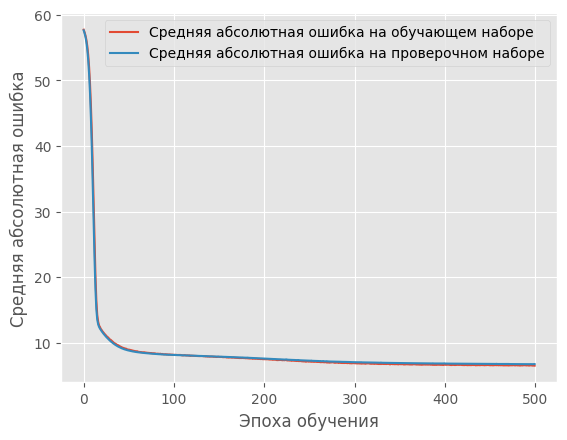

In [83]:
# Обучение модели на простых данных

model = Sequential()
model.add(BatchNormalization(input_dim=x_train2_scaled.shape[1]))
model.add(Dense(128, activation='relu'))
model.add(Dense(512, activation='relu'))
model.add(Dense(1024, activation='relu'))
model.add(Dense(128, activation='relu'))
model.add(Dense(1, activation='linear'))

model.compile(optimizer=Adam(learning_rate=1e-5), loss='mse', metrics=['mae'])

history = model.fit(x_train2_scaled, 
                    y_train2, 
                    epochs=500, 
                    batch_size=256,
                    validation_split=0.15, 
                    verbose=1)

plot_history(history)

In [84]:
r2_score(y_test2, model.predict(X_test2_scaled))

# точность не самая высокая, попробуем запустить еще 100 итераций обучения

93/93 [==============================] - 1s 2ms/step


0.6718084089113641

Epoch 1/100
40/40 [==============================] - 0s 10ms/step - loss: 67.0664 - mae: 6.5377 - val_loss: 72.1137 - val_mae: 6.7425
Epoch 2/100
40/40 [==============================] - 0s 9ms/step - loss: 67.4629 - mae: 6.5584 - val_loss: 72.2622 - val_mae: 6.7310
Epoch 3/100
40/40 [==============================] - 0s 10ms/step - loss: 67.1736 - mae: 6.5507 - val_loss: 72.5533 - val_mae: 6.7352
Epoch 4/100
40/40 [==============================] - 0s 10ms/step - loss: 67.3681 - mae: 6.5552 - val_loss: 72.0620 - val_mae: 6.7328
Epoch 5/100
40/40 [==============================] - 0s 9ms/step - loss: 67.1543 - mae: 6.5408 - val_loss: 72.0602 - val_mae: 6.7320
Epoch 6/100
40/40 [==============================] - 0s 10ms/step - loss: 67.0965 - mae: 6.5460 - val_loss: 72.0164 - val_mae: 6.7296
Epoch 7/100
40/40 [==============================] - 0s 10ms/step - loss: 67.6627 - mae: 6.5746 - val_loss: 72.0626 - val_mae: 6.7540
Epoch 8/100
40/40 [==============================] - 0s 10ms/ste

Epoch 62/100
40/40 [==============================] - 0s 10ms/step - loss: 65.9667 - mae: 6.4964 - val_loss: 71.4197 - val_mae: 6.6937
Epoch 63/100
40/40 [==============================] - 0s 10ms/step - loss: 65.5744 - mae: 6.4713 - val_loss: 71.2902 - val_mae: 6.6944
Epoch 64/100
40/40 [==============================] - 0s 10ms/step - loss: 65.9673 - mae: 6.4871 - val_loss: 71.4388 - val_mae: 6.6931
Epoch 65/100
40/40 [==============================] - 0s 10ms/step - loss: 65.2608 - mae: 6.4707 - val_loss: 71.6085 - val_mae: 6.6936
Epoch 66/100
40/40 [==============================] - 0s 10ms/step - loss: 65.9123 - mae: 6.4784 - val_loss: 71.3105 - val_mae: 6.6936
Epoch 67/100
40/40 [==============================] - 0s 11ms/step - loss: 66.2723 - mae: 6.5133 - val_loss: 71.1870 - val_mae: 6.7029
Epoch 68/100
40/40 [==============================] - 0s 10ms/step - loss: 66.6751 - mae: 6.5188 - val_loss: 71.1355 - val_mae: 6.7003
Epoch 69/100
40/40 [==============================] - 0

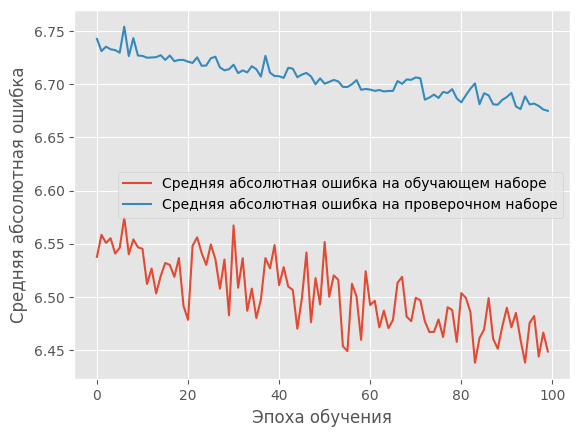

In [85]:
history = model.fit(x_train2_scaled, 
                    y_train2, 
                    epochs=100, 
                    batch_size=256,
                    validation_split=0.15, 
                    verbose=1)

plot_history(history)

In [86]:
r2_score(y_test2, model.predict(X_test2_scaled))
# точность выросла

93/93 [==============================] - 0s 2ms/step


0.6773878392426094

Epoch 1/100
40/40 [==============================] - 0s 10ms/step - loss: 66.3557 - mae: 6.5097 - val_loss: 70.7625 - val_mae: 6.6767
Epoch 2/100
40/40 [==============================] - 0s 10ms/step - loss: 65.3733 - mae: 6.4657 - val_loss: 70.9065 - val_mae: 6.6725
Epoch 3/100
40/40 [==============================] - 0s 10ms/step - loss: 65.4866 - mae: 6.4530 - val_loss: 70.7604 - val_mae: 6.6794
Epoch 4/100
40/40 [==============================] - 0s 10ms/step - loss: 64.9609 - mae: 6.4291 - val_loss: 70.7066 - val_mae: 6.6826
Epoch 5/100
40/40 [==============================] - 0s 9ms/step - loss: 65.3227 - mae: 6.4490 - val_loss: 70.8462 - val_mae: 6.6718
Epoch 6/100
40/40 [==============================] - 0s 9ms/step - loss: 65.2016 - mae: 6.4449 - val_loss: 71.0957 - val_mae: 6.6724
Epoch 7/100
40/40 [==============================] - 0s 9ms/step - loss: 66.2943 - mae: 6.4998 - val_loss: 71.0112 - val_mae: 6.6720
Epoch 8/100
40/40 [==============================] - 0s 9ms/step 

Epoch 62/100
40/40 [==============================] - 0s 9ms/step - loss: 65.2809 - mae: 6.4306 - val_loss: 70.1970 - val_mae: 6.6466
Epoch 63/100
40/40 [==============================] - 0s 10ms/step - loss: 64.2898 - mae: 6.4031 - val_loss: 70.0503 - val_mae: 6.6539
Epoch 64/100
40/40 [==============================] - 0s 10ms/step - loss: 64.7791 - mae: 6.4143 - val_loss: 70.2190 - val_mae: 6.6441
Epoch 65/100
40/40 [==============================] - 0s 10ms/step - loss: 64.7565 - mae: 6.4218 - val_loss: 70.8526 - val_mae: 6.6531
Epoch 66/100
40/40 [==============================] - 0s 10ms/step - loss: 64.9402 - mae: 6.4305 - val_loss: 70.7133 - val_mae: 6.6498
Epoch 67/100
40/40 [==============================] - 0s 10ms/step - loss: 65.4052 - mae: 6.4503 - val_loss: 70.1905 - val_mae: 6.6757
Epoch 68/100
40/40 [==============================] - 0s 10ms/step - loss: 64.5359 - mae: 6.4172 - val_loss: 69.9972 - val_mae: 6.6499
Epoch 69/100
40/40 [==============================] - 0s

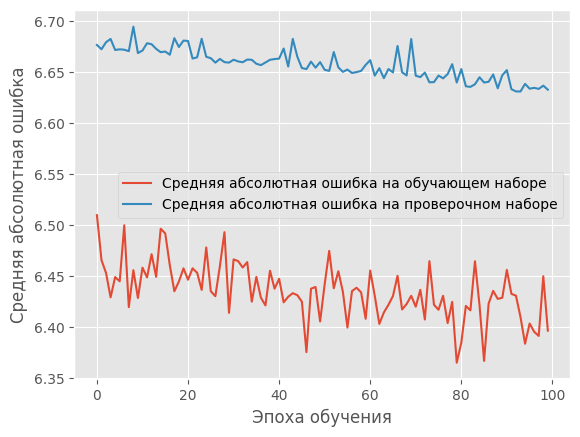

In [87]:
history = model.fit(x_train2_scaled, 
                    y_train2, 
                    epochs=100, 
                    batch_size=256,
                    validation_split=0.15, 
                    verbose=1)

plot_history(history)

In [88]:
r2_score(y_test2, model.predict(X_test2_scaled))
# точность почти не изменилась

93/93 [==============================] - 0s 2ms/step


0.6821681334400951

In [94]:
model.save('models/model_amount_predict.h5')

D:\anaconda3\envs\cuda\Lib\site-packages\keras\src\engine\training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [132]:
model = tf.keras.saving.load_model("models/model_amount_predict.h5")

In [133]:
amount_predict_cols = ['place_0', 'place_1', 'place_2', 'place_3', 'product_0', 'product_1', 'year', 'month', 'day', 'weather', 'price']

In [134]:
df_predict

,day_num,place,product,cost,date,competitors_price,year,month,day,place_0,place_1,place_2,place_3,place_4,weather
0,1,0,0,5.072269,2218-09-28,10.511567,2218,9,28,1,0,0,0,0,0
1,2,0,0,5.072269,2218-09-29,9.879071,2218,9,29,1,0,0,0,0,1
2,3,0,0,5.072269,2218-09-30,9.107714,2218,9,30,1,0,0,0,0,0
3,4,0,0,5.072269,2218-10-01,9.862911,2218,10,1,1,0,0,0,0,1
4,5,0,0,5.072269,2218-10-02,10.880847,2218,10,2,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1345,86,4,2,3.943291,2218-12-22,15.815362,2218,12,22,0,0,0,0,1,1
1346,87,4,2,3.943291,2218-12-23,15.697788,2218,12,23,0,0,0,0,1,1
1347,88,4,2,3.943291,2218-12-24,16.095864,2218,12,24,0,0,0,0,1,0
1348,89,4,2,3.943291,2218-12-25,15.553877,2218,12,25,0,0,0,0,1,1


### Условия для цен

* одна цена на товар должна держаться больше, чем 3 дня (то есть нельзя установить цену на один день, а на следующий день ее сменить). 
* запрещается изменение цены больше, чем на 1 золотой за раз (то есть нельзя резко изменить цену с 3 золотых на 4,50 золотых, но можно с 3 золотых на 4 золотых, а затем через 3 дня поднять до 4,5 золотых)
* не искушайтесь поставить слишком высокую цену — все откажутся у вас покупать, А если Древние Боги заметят, что ваша цена на 20% выше, чем у конкурентов, они могут наказать вас за вашу алчность (большим штрафом)

Исходя из условий: будем отдельно подбирать цену для каждого из 3х дней на каждый товар в каждом регионе; будем изменять цены в интервале [price-1;price+1]; верхняя граница цены не должна привышать цены конкурентов + 15% (не 20, так как могут быть погрешности в предсказниях цен у конкурентов, следовательно лучше чуть занизить порог, чем получить большой штраф)

In [135]:
df_predict.head()

,day_num,place,product,cost,date,competitors_price,year,month,day,place_0,place_1,place_2,place_3,place_4,weather
0,1,0,0,5.072269,2218-09-28,10.511567,2218,9,28,1,0,0,0,0,0
1,2,0,0,5.072269,2218-09-29,9.879071,2218,9,29,1,0,0,0,0,1
2,3,0,0,5.072269,2218-09-30,9.107714,2218,9,30,1,0,0,0,0,0
3,4,0,0,5.072269,2218-10-01,9.862911,2218,10,1,1,0,0,0,0,1
4,5,0,0,5.072269,2218-10-02,10.880847,2218,10,2,1,0,0,0,0,0


In [136]:
# преобразуем категориальные данные в формат ohe
ohe_product = pd.get_dummies(df_predict['product'], dtype=int, prefix='product')
# df_transaction = df_transaction.drop('product',axis = 1)
df_predict = df_predict.join(ohe_product)

In [137]:
# разобем данные для каждого товара
df_predict_0_0 = df_predict[(df_predict['place'] == 0) & (df_predict['product'] == 0)].sort_values('date')

In [138]:
# зададим стандартизацию
scaler = StandardScaler().fit(X_train2)
x_train2_scaled = scaler.transform(X_train2)
X_test2_scaled = scaler.transform(X_test2)

In [163]:
# построим функцию подсчета дневной прибыли на основе цены
# profit = price∗amount−cost∗amount
def get_profit(data, price):
    data['price'] = [price]*3
    data_scaled = scaler.transform(data[amount_predict_cols])
    # предсказываем amount на 3 дня и берем медиану
    __amount = np.median(model.predict(data_scaled, verbose=0))
    # получаем медианную себестоимость
    __cost = np.median(data['cost'])
    # возвращаем прибыль
    return price*__amount - __cost*__amount

In [164]:
# напишем просутю функцию для поиска максимума
def get_func_max(f, a, b, data):
    for _ in range(14):
        mid = (b+a) / 2
        if f(data, a) >= f(data, b):
            b = mid
            mid = (b+a)/2
        else:
            a = mid
            mid = (b+a)/2
    
    return round(mid, 2)
            

In [139]:
# соберем функцию предсказания наилучшей цены
def predict_best_price(place_num, product_num):
    data = df_predict[(df_predict['place'] == place_num) & (df_predict['product'] == product_num)].sort_values('date').reset_index(drop=True)
    # инициализируем цену средней ценой у конкурентов + 15%
    # (средняя а не максимальная, так как максимальные цены конкурентов могут иметь большие колебания)
    start_price = round(np.mean(np.array(df_predict[(df_predict['place'] == place_num) & (df_predict['product'] == product_num)].sort_values('date').reset_index(drop=True)['competitors_price'])[:3])*1.15, 2)
    def get_profit(data, price):
        data['price'] = [price]*3
        data_scaled = scaler.transform(data[amount_predict_cols])
        # предсказываем amount на 3 дня и берем медиану
        __amount = np.median(model.predict(data_scaled, verbose=0))
        # получаем медианную себестоимость
        __cost = np.median(data['cost'])
        # возвращаем прибыль
        return price*__amount - __cost*__amount
    
    def get_func_max(f, a, b, data):
        for _ in range(14):
            mid = (b+a) / 2
            if f(data, a) >= f(data, b):
                b = mid
                mid = (b+a)/2
            else:
                a = mid
                mid = (b+a)/2

        return round(mid, 2)
    
    prices = []
    prices.extend([start_price]*3)
    for i in range(1, 30):
        data_3 = data[i*3:i*3+3]
        min_price = prices[i*3-1]-1
        competitors_price = max(data_3['competitors_price']) # а здесь уже берем максимум, так как мы контролируем колибания единичным шагом цены
        if competitors_price * 1.15 > prices[i*3-1]+1:
            max_price = prices[i*3-1]+1
        else:
            max_price = competitors_price * 1.15
        
        prices.extend([get_func_max(get_profit, min_price, max_price, data_3)]*3)
    
    data['price'] = prices
    return data
        
    

In [141]:
predict_0_0 = predict_best_price(0, 0)
predict_1_0 = predict_best_price(1, 0)
predict_2_0 = predict_best_price(2, 0)
predict_3_0 = predict_best_price(3, 0)
predict_4_0 = predict_best_price(4, 0)

predict_0_1 = predict_best_price(0, 1)
predict_1_1 = predict_best_price(1, 1)
predict_2_1 = predict_best_price(2, 1)
predict_3_1 = predict_best_price(3, 1)
predict_4_1 = predict_best_price(4, 1)

predict_0_2 = predict_best_price(0, 2)
predict_1_2 = predict_best_price(1, 2)
predict_2_2 = predict_best_price(2, 2)
predict_3_2 = predict_best_price(3, 2)
predict_4_2 = predict_best_price(4, 2)

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price'] = [price]*3
C:\Users\Egor\AppData\Local\Temp\ipykernel_25884\3030465933.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in th

In [142]:
df_result = pd.concat([
    predict_0_0,
    predict_1_0,
    predict_2_0,
    predict_3_0,
    predict_4_0,
    
    predict_0_1,
    predict_1_1,
    predict_2_1,
    predict_3_1,
    predict_4_1,
    
    predict_0_2,
    predict_1_2,
    predict_2_2,
    predict_3_2,
    predict_4_2,

])

In [143]:
df_result.reset_index(drop= True , inplace= True ) # обновим индекс к 0-1350

In [144]:
df_result.head()

,day_num,place,product,cost,date,competitors_price,year,month,day,place_0,place_1,place_2,place_3,place_4,weather,product_0,product_1,product_2,price
0,1,0,0,5.072269,2218-09-28,10.511567,2218,9,28,1,0,0,0,0,0,1,0,0,11.31
1,2,0,0,5.072269,2218-09-29,9.879071,2218,9,29,1,0,0,0,0,1,1,0,0,11.31
2,3,0,0,5.072269,2218-09-30,9.107714,2218,9,30,1,0,0,0,0,0,1,0,0,11.31
3,4,0,0,5.072269,2218-10-01,9.862911,2218,10,1,1,0,0,0,0,1,1,0,0,12.31
4,5,0,0,5.072269,2218-10-02,10.880847,2218,10,2,1,0,0,0,0,0,1,0,0,12.31


In [145]:
scaler = StandardScaler().fit(X_train2.values)
# обучим скейлер только на значениях, потому что он ругается при apply, так как мы подавали датафрейм

In [146]:
# посчитаем прибыль
def predict_profit(x):
    x_transform = scaler.transform(np.array(x[amount_predict_cols]).reshape(1, -1))
    __amount = model.predict(x_transform, verbose=0)[0][0]
    return x['price']*__amount - x['cost']*__amount

df_result['profit'] = df_result.apply(lambda x: predict_profit(x), axis=1)

In [147]:
# общая прибыль за 3 месяца
df_result['profit'].sum()

860096.517102952

In [149]:
# загрузим бейзлайн предсказание

df_baseline = pd.read_parquet("dataframes/df_baseline.parquet")

In [150]:
df_baseline.head()

# для определения прибыли нужно преобразовать колонки product и place
# добавить колонки weather, cost
# разбить колонку дат

,day_num,place,product,price
0,1,Анор Лондо,Целебные травы,13.63
1,2,Анор Лондо,Целебные травы,13.63
2,3,Анор Лондо,Целебные травы,13.63
3,4,Анор Лондо,Целебные травы,13.63
4,5,Анор Лондо,Целебные травы,13.63


In [151]:
# сбросим индексы 
df_baseline.reset_index(drop=True, inplace=True)

In [152]:
df_baseline['product'] = df_baseline['product'].apply(lambda x: products[x]) # меняем продукт на соответсвтующую цифру
df_baseline['place'] = df_baseline['place'].apply(lambda x: places[x]) # меняем место на соответсвтующую цифру

# преобразуем категориальные данные в формат ohe
ohe_product = pd.get_dummies(df_baseline['product'], dtype=int, prefix='product')
# df_transaction = df_transaction.drop('product',axis = 1)
df_baseline = df_baseline.join(ohe_product)

# преобразуем категориальные данные в формат ohe
ohe_place = pd.get_dummies(df_baseline['place'], dtype=int, prefix='place')
# df_transaction = df_transaction.drop('product',axis = 1)
df_baseline = df_baseline.join(ohe_place)

In [153]:
# добавим даты
df_baseline['year'] = df_baseline['day_num'].apply(lambda x: np.array(df_predict[df_predict['day_num'] == x]['year'])[0])
df_baseline['month'] = df_baseline['day_num'].apply(lambda x: np.array(df_predict[df_predict['day_num'] == x]['month'])[0])
df_baseline['day'] = df_baseline['day_num'].apply(lambda x: np.array(df_predict[df_predict['day_num'] == x]['day'])[0])

In [154]:
# обучим XGBoost с лучшими параметрами
# начнем с бейзлайна с заранее определенными параметрами
X_train, X_test, y_train, y_test = train_test_split(df_transaction_clean[['place_0', 'place_1', 'place_2', 'place_3', 'year', 'month', 'day']], 
                                                    df_transaction_clean['weather'], test_size=0.2, random_state=42)

model_xgb = XGBClassifier(seed=42,
                      n_estimators=1000,
                      max_depth=10,
                      learning_rate=0.3)
model_xgb.fit(X_train, y_train)

y_pred_train = model_xgb.predict(X_train)
print (metrics.classification_report(y_train, y_pred_train))

y_pred_test = model_xgb.predict(X_test)
print (metrics.classification_report(y_test, y_pred_test))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      5739
           1       1.00      1.00      1.00      6158

    accuracy                           1.00     11897
   macro avg       1.00      1.00      1.00     11897
weighted avg       1.00      1.00      1.00     11897

              precision    recall  f1-score   support

           0       0.97      0.98      0.98      1443
           1       0.98      0.97      0.98      1532

    accuracy                           0.98      2975
   macro avg       0.98      0.98      0.98      2975
weighted avg       0.98      0.98      0.98      2975



In [155]:
# предскажим погоду
df_baseline['weather'] = model_xgb.predict(df_baseline[['place_0', 'place_1', 'place_2', 'place_3', 'year', 'month', 'day']])

In [156]:
# добавим колонку cost
def get_cost_from_result(x):
    return np.array(df_predict[(df_predict['year'] == x['year']) & 
                               (df_predict['month'] == x['month']) & 
                               (df_predict['day'] == x['day']) & 
                               (df_predict['product'] == x['product']) & 
                               (df_predict['place'] == x['place'])]['cost'])[0]
df_baseline['cost'] = df_baseline[['year', 'month', 'day', 'product', 'place']].apply(lambda x: get_cost_from_result(x), axis=1)

In [157]:
df_baseline['profit'] = df_baseline.apply(lambda x: predict_profit(x), axis=1)

In [158]:
# прибыль предложенного мною вариант на 332158 злотых больше (почти в 2 раза) чем baseline
df_result['profit'].sum() - df_baseline['profit'].sum()

332158.18404476845

In [159]:
# преобразуем колонки product и place обратно
# product_0: Целебные травы
# product_1: Эльфийская пыльца
# product_2: Эстус

# place_0: Анор Лондо
# place_1: Врата Балдура
# place_2: Кеджистан
# place_3: Нокрон
# place_4: Фалькония

product_to_str = {
    0: 'Целебные травы',
    1: 'Эльфийская пыльца',
    2: 'Эстус'
}

place_to_str = {
    0: 'Анор Лондо',
    1: 'Врата Балдура',
    2: 'Кеджистан',
    3: 'Нокрон',
    4: 'Фалькония',
}

df_result['product'] = df_result['product'].apply(lambda x: product_to_str[x])
df_result['place'] = df_result['place'].apply(lambda x: place_to_str[x])

In [160]:
df_result.head()

,day_num,place,product,cost,date,competitors_price,year,month,day,place_0,place_1,place_2,place_3,place_4,weather,product_0,product_1,product_2,price,profit
0,1,Анор Лондо,Целебные травы,5.072269,2218-09-28,10.511567,2218,9,28,1,0,0,0,0,0,1,0,0,11.31,222.584386
1,2,Анор Лондо,Целебные травы,5.072269,2218-09-29,9.879071,2218,9,29,1,0,0,0,0,1,1,0,0,11.31,324.739539
2,3,Анор Лондо,Целебные травы,5.072269,2218-09-30,9.107714,2218,9,30,1,0,0,0,0,0,1,0,0,11.31,223.677531
3,4,Анор Лондо,Целебные травы,5.072269,2218-10-01,9.862911,2218,10,1,1,0,0,0,0,1,1,0,0,12.31,365.358218
4,5,Анор Лондо,Целебные травы,5.072269,2218-10-02,10.880847,2218,10,2,1,0,0,0,0,0,1,0,0,12.31,253.498984


In [161]:
df_prices_90_days = df_result[['day_num', 'place', 'product', 'price']]

In [162]:
df_prices_90_days

,day_num,place,product,price
0,1,Анор Лондо,Целебные травы,11.31
1,2,Анор Лондо,Целебные травы,11.31
2,3,Анор Лондо,Целебные травы,11.31
3,4,Анор Лондо,Целебные травы,12.31
4,5,Анор Лондо,Целебные травы,12.31
...,...,...,...,...
1345,86,Фалькония,Эстус,18.19
1346,87,Фалькония,Эстус,18.19
1347,88,Фалькония,Эстус,18.51
1348,89,Фалькония,Эстус,18.51


In [434]:
df_prices_90_days.to_parquet('result/result.parquet')

In [435]:
df_prices_90_days.to_csv('result/result.csv')